In [1]:
# Please check excellent notebook of Guido Zuidhof for full explanation of this code
%matplotlib inline
import sys
import numpy as np
from numpy import *
from scipy import stats
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.metrics import *
import glob
from sklearn.model_selection import train_test_split
import datetime
import math
import os.path
#from importlib import reload
import matplotlib.pyplot as plt
from IPython.display import display
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from multiprocessing import Pool
import time
from skimage import measure, morphology, segmentation
import scipy.ndimage as ndimage
import dicom

try:
    from tqdm import tqdm # long waits are not fun
except:
    print('TQDM does make much nicer wait bars...')
    tqdm = lambda x: x

# import keras
# from keras.layers.core import *
# from keras.layers.normalization import *
# from keras.layers.pooling import *
# from keras.layers import Input
# from keras.layers.convolutional import *
# from keras.regularizers import *
# from keras.optimizers import *
# from keras.callbacks import *
# from keras.models import Model, Sequential
# from keras.models import load_model
# import tensorflow as tf


In [2]:
#INPUT_SCAN_FOLDER = '/data/kaggle_cancer_2017/stage1/'
#OUTPUT_FOLDER = '/data/kaggle_preprocessed_output/'

# For Kaggle I have added  sample_image directory only
INPUT_SCAN_FOLDER = '/home/watts/lal/Kaggle/lung_cancer/data/stage1/stage1/'
OUTPUT_FOLDER = '/home/watts/lal/Kaggle/lung_cancer/cache/stage1/'

THRESHOLD_HIGH = 700
THRESHOLD_LOW = -1100

# fix random seed for reproducibility
np.random.seed(17)


In [3]:
# Load the scans in given folder path
def read_ct_scan_gzuidhof(folder_path):
    #print folder_path
    slices = [dicom.read_file(folder_path + '/' + s) for s in os.listdir(folder_path)]
    slices.sort(key = lambda x: int(x.ImagePositionPatient[2]))
    try:
        slice_thickness = np.abs(slices[0].ImagePositionPatient[2] - slices[1].ImagePositionPatient[2])
    except:
        slice_thickness = np.abs(slices[0].SliceLocation - slices[1].SliceLocation)
        
    for s in slices:
        s.SliceThickness = slice_thickness
        
    return slices

In [4]:
# Simple Function to show the slice at full resolustion normal imshow would downscale this image.
# It can accept either (image_width, image_height) array or (image_width, image_height, 1) numpy as input.
# Optional Value range is a tuple of fixed max value and min value. This is useful if you do not want color 
#  to change between different scan slices.

def show_slice(arr, value_range = None):
    if len (list(arr.shape)) > 2:
        arr2 = arr.copy()
        arr2 = np.reshape (arr, (arr.shape[0],arr.shape[1]))
    else:
        arr2 = arr

    dpi = 80
    margin = 0.05 # (5% of the width/height of the figure...)
    xpixels, ypixels = arr2.shape[0], arr2.shape[1]

    # Make a figure big enough to accomodate an axis of xpixels by ypixels
    # as well as the ticklabels, etc...
    figsize = (1 + margin) * ypixels / dpi, (1 + margin) * xpixels / dpi

    fig = plt.figure(figsize=figsize, dpi=dpi)
    # Make the axis the right size...
    ax = fig.add_axes([margin, margin, 1 - 2*margin, 1 - 2*margin])

    if value_range is None:
        plt.imshow(arr2, cmap=plt.cm.gray)
    else:        
        ax.imshow(arr2, vmin=value_range[0], vmax=1, cmap=plt.cm.gray, interpolation='none')
    plt.show()

def preprocess_all_scans_mp (in_folder, out_folder, demo=False):

    dicom_folder_list = [ name for name in os.listdir(in_folder) if os.path.isdir(os.path.join(in_folder, name)) ]
   
    # For Testing feed just load one scan
    segment_pad_and_save_ct_scan_as_npz  (dicom_folder_list[0], demo=True)
    
    if not demo:
        # Multi-threaded processes to utilize all available CPUs for this task. Note that many threads will block on IO
        # so creating more than number of CPUs.    
        thread_pool = Pool(24)
        thread_pool.map (segment_pad_and_save_ct_scan_as_npz, dicom_folder_list)
        
        # Cleanup
        thread_pool.close()
        thread_pool.join_thread()
        
def segment_pad_and_save_ct_scan_as_npz (scanid, demo=False):
    
    scan_dir = INPUT_SCAN_FOLDER + str(scanid)
    
    scan = load_scan_as_HU_nparray(scan_dir)
    
    # For demo reduce number of slices to 5 to save time
    if demo:
        scan = scan[78:82]
    
    if demo:
        print ("----Loaded Scan and Converted to HU units----")
        print ("Shape: ", scan.shape)
        show_slice (scan[3])
    
    scan = seperate_lungs_and_pad (scan)
    
    if demo:
        print ("----Segmented Lung and Padded/Trimmed to have 256 slices----")
        print ("Shape: ", scan.shape)
        show_slice (scan[3])
        
    scan = threshold_and_normalize_scan (scan)
    
    if demo:
        print ("----Thresholded and Normalized----")
        print ("Shape: ", scan.shape)
        show_slice (scan[3]) 
    
    # For Convnet we will need one extra dimension representing color channel
    #scan = scan.reshape((256,512,512,1))
    scan = scan.reshape((616,512,512,1))
    
    if demo:
        print ("----Expanded dimensions for color channel representation ----")
        print ("Shape: ", scan.shape)
        show_slice (scan[3], value_range=(-1,1))         
    
    # Save output file to compressed npz file for easy reading.
    if not demo:
        # out_file = OUTPUT_FOLDER + 'stage1/' + scanid + '.npy'  
        out_file = OUTPUT_FOLDER + scanid + '.npy'  
        # np.savez_compressed (out_file, scan)
        np.save(out_file, scan)
    
# Load the scans in given folder path
def load_scan_as_HU_nparray(path):
    slices = [dicom.read_file(path + '/' + s) for s in os.listdir(path)]
    slices.sort(key = lambda x: int(x.ImagePositionPatient[2]))
    try:
        slice_thickness = np.abs(slices[0].ImagePositionPatient[2] - slices[1].ImagePositionPatient[2])
    except:
        slice_thickness = np.abs(slices[0].SliceLocation - slices[1].SliceLocation)
        
    for s in slices:
        s.SliceThickness = slice_thickness
    
    image = np.stack([s.pixel_array for s in slices])
    
    # Convert to int16 (from sometimes int16), 
    # should be possible as values should always be low enough (<32k)
    image = image.astype(np.int16)

    # Set outside-of-scan pixels to 0
    # The intercept is usually -1024, so air is approximately 0
    image[image == -2000] = 0
    
    # Convert to Hounsfield units (HU)
    for slice_number in range(len(slices)):
        
        intercept = slices[slice_number].RescaleIntercept
        slope = slices[slice_number].RescaleSlope
        
        if slope != 1:
            image[slice_number] = slope * image[slice_number].astype(np.float64)
            image[slice_number] = image[slice_number].astype(np.int16)
            
        image[slice_number] += np.int16(intercept)
    
    return np.array(image, dtype=np.int16)        


def seperate_lungs_and_pad(scan):
    
    # make total 256 slices fill in -1100 as exterme value 
    segmented_scan = np.full ((616, 512, 512), THRESHOLD_LOW)
    
    for i, image in enumerate (scan):
        
        # Ignore all slices later than 255 if required.
        if (i == 616):
            break
        
        # Creation of the internal Marker
        marker_internal = image < -400
        marker_internal = segmentation.clear_border(marker_internal)
        marker_internal_labels = measure.label(marker_internal)
        areas = [r.area for r in measure.regionprops(marker_internal_labels)]
        areas.sort()
        if len(areas) > 2:
            for region in measure.regionprops(marker_internal_labels):
                if region.area < areas[-2]:
                    for coordinates in region.coords:                
                           marker_internal_labels[coordinates[0], coordinates[1]] = 0
        marker_internal = marker_internal_labels > 0
        #Creation of the external Marker
        external_a = ndimage.binary_dilation(marker_internal, iterations=10)
        external_b = ndimage.binary_dilation(marker_internal, iterations=55)
        marker_external = external_b ^ external_a
        #Creation of the Watershed Marker matrix
        marker_watershed = np.zeros((512, 512), dtype=np.int)
        marker_watershed += marker_internal * 255
        marker_watershed += marker_external * 128

        #Creation of the Sobel-Gradient
        sobel_filtered_dx = ndimage.sobel(image, 1)
        sobel_filtered_dy = ndimage.sobel(image, 0)
        sobel_gradient = np.hypot(sobel_filtered_dx, sobel_filtered_dy)
        sobel_gradient *= 255.0 / np.max(sobel_gradient)

        #Watershed algorithm
        watershed = morphology.watershed(sobel_gradient, marker_watershed)

        #Reducing the image created by the Watershed algorithm to its outline
        outline = ndimage.morphological_gradient(watershed, size=(3,3))
        outline = outline.astype(bool)

        #Performing Black-Tophat Morphology for reinclusion
        #Creation of the disk-kernel and increasing its size a bit
        blackhat_struct = [[0, 0, 1, 1, 1, 0, 0],
                           [0, 1, 1, 1, 1, 1, 0],
                           [1, 1, 1, 1, 1, 1, 1],
                           [1, 1, 1, 1, 1, 1, 1],
                           [1, 1, 1, 1, 1, 1, 1],
                           [0, 1, 1, 1, 1, 1, 0],
                           [0, 0, 1, 1, 1, 0, 0]]
        blackhat_struct = ndimage.iterate_structure(blackhat_struct, 8)
        #Perform the Black-Hat
        outline += ndimage.black_tophat(outline, structure=blackhat_struct)

        #Use the internal marker and the Outline that was just created to generate the lungfilter
        lungfilter = np.bitwise_or(marker_internal, outline)
        #Close holes in the lungfilter
        #fill_holes is not used here, since in some slices the heart would be reincluded by accident
        lungfilter = ndimage.morphology.binary_closing(lungfilter, structure=np.ones((5,5)), iterations=3)

        #Apply the lungfilter (note the filtered areas being assigned 30 HU)
        segmented_scan[i] = np.where(lungfilter == 1, image, 30*np.ones((512, 512)))
        
    return segmented_scan

def threshold_and_normalize_scan (scan):
    scan = scan.astype(np.float32)
    scan [scan < THRESHOLD_LOW] = THRESHOLD_LOW
    scan [scan > THRESHOLD_HIGH] = THRESHOLD_HIGH
    
    # Maximum absolute value of any pixel .
    max_abs = abs (max(THRESHOLD_LOW, THRESHOLD_HIGH, key=abs))
    
    # This will bring values between -1 and 1
    scan /= max_abs
    
    return scan



----Loaded Scan and Converted to HU units----
('Shape: ', (4, 512, 512))


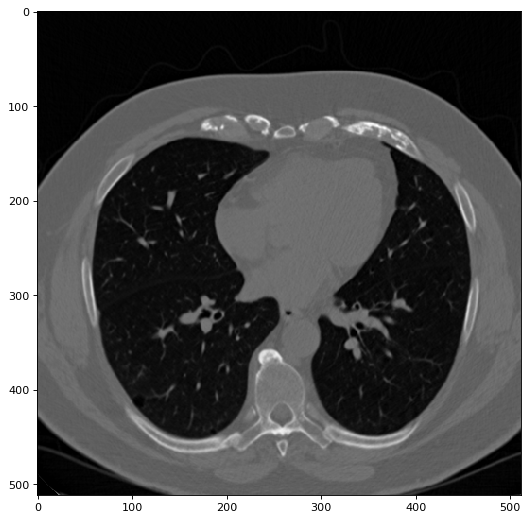

----Segmented Lung and Padded/Trimmed to have 256 slices----
('Shape: ', (616, 512, 512))


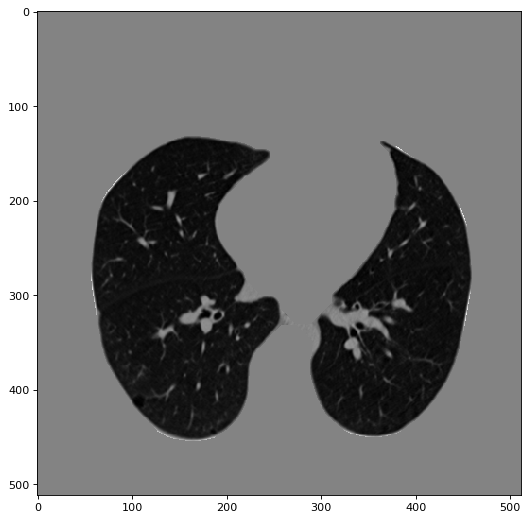

----Thresholded and Normalized----
('Shape: ', (616, 512, 512))


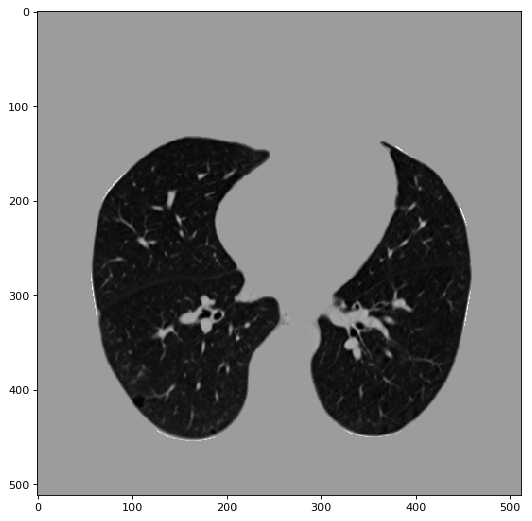

----Expanded dimensions for color channel representation ----
('Shape: ', (616, 512, 512, 1))


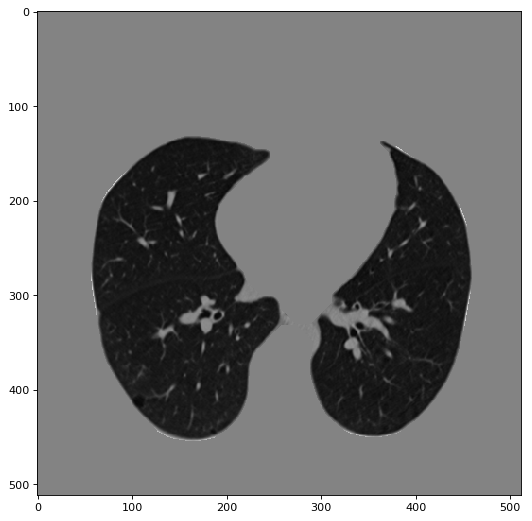

AttributeError: 'Pool' object has no attribute 'join_thread'

In [5]:
if not os.path.exists(OUTPUT_FOLDER+'stage1/'):
    os.makedirs (OUTPUT_FOLDER+'stage1/')
    
# For full preprocessing you should to set demo=False
preprocess_all_scans_mp (INPUT_SCAN_FOLDER, OUTPUT_FOLDER, demo=False)

In [5]:
INPUT_SCAN_FOLDER = '/home/watts/lal/Kaggle/lung_cancer/data/stage2/'
OUTPUT_FOLDER = '/home/watts/lal/Kaggle/lung_cancer/cache/stage2/'

----Loaded Scan and Converted to HU units----
('Shape: ', (4, 512, 512))


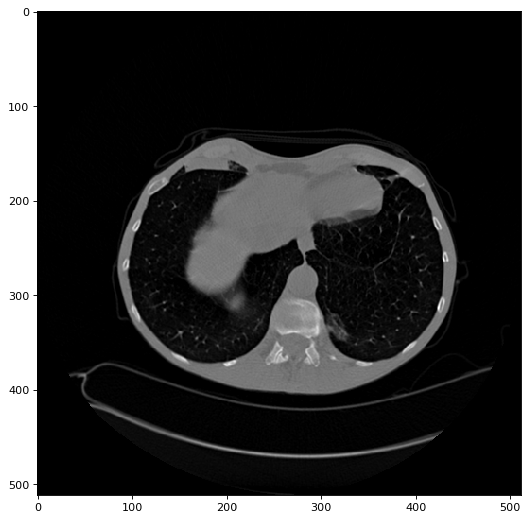

----Segmented Lung and Padded/Trimmed to have 256 slices----
('Shape: ', (616, 512, 512))


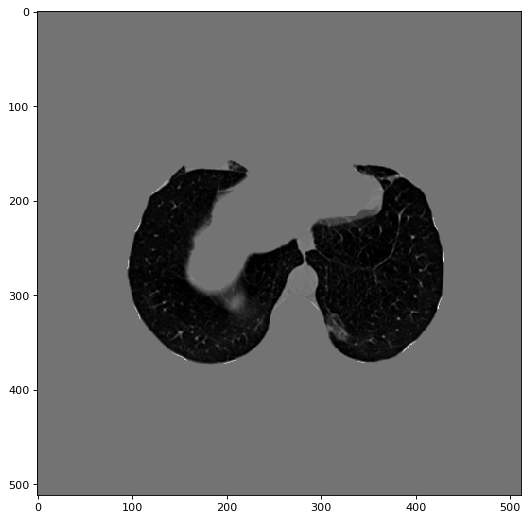

----Thresholded and Normalized----
('Shape: ', (616, 512, 512))


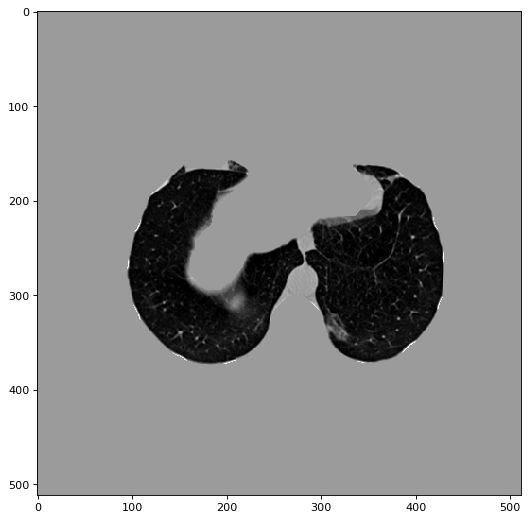

----Expanded dimensions for color channel representation ----
('Shape: ', (616, 512, 512, 1))


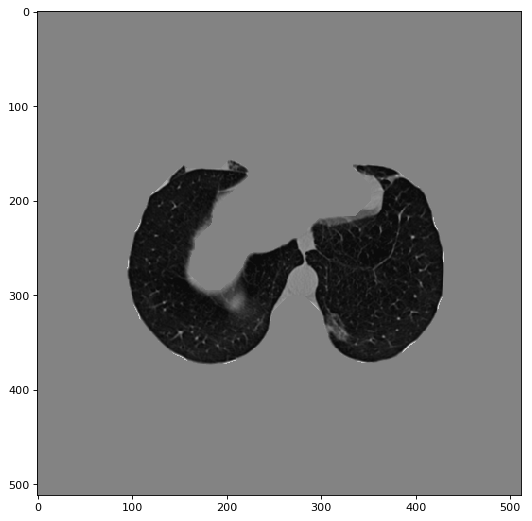

AttributeError: 'Pool' object has no attribute 'join_thread'

In [6]:
if not os.path.exists(OUTPUT_FOLDER):
    os.makedirs (OUTPUT_FOLDER)
    
# For full preprocessing you should to set demo=False
preprocess_all_scans_mp (INPUT_SCAN_FOLDER, OUTPUT_FOLDER, demo=False)

In [6]:
num_slices = 16
img_width = 128
img_height = 128

In [7]:
model_path = "/home/watts/lal/Kaggle/lung_cancer/models/"
model_arch = 'model_unet3d_%d.json' % img_width
model_weights = 'model_unet3d_%d.h5' % img_width

Load the unet3d model

In [8]:
smooth = 1.

def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_np(y_true,y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

In [9]:
# load json and create model
from keras.models import model_from_json
from keras.optimizers import Adam
from keras import backend as K

K.set_image_dim_ordering('th')

json_file = open(model_path+model_arch, 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)

# load weights into new model
model.load_weights(model_path+model_weights)
print("Loaded model from disk")
model.compile(optimizer=Adam(lr=1.0e-5), loss=dice_coef_loss, metrics=[dice_coef])
print("compiled model")

Using TensorFlow backend.
/home/watts/anaconda2/lib/python2.7/site-packages/keras/engine/topology.py:1202: UserWarning: The `Merge` layer is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
  return cls(**config)


Loaded model from disk
compiled model


Get predictions from stage1

In [10]:
INPUT_FOLDER = '/home/watts/lal/Kaggle/lung_cancer/cache/stage1/'
OUTPUT_FOLDER = '/home/watts/lal/Kaggle/lung_cancer/cache/predictions/stage1/'
DATA_PATH = '/home/watts/lal/Kaggle/lung_cancer/data/stage1/stage1/'

In [11]:
if not os.path.exists(OUTPUT_FOLDER):
    os.makedirs (OUTPUT_FOLDER)

In [12]:
lung = np.load(INPUT_FOLDER+'b53d997901eb880c41fbfbc82847204c.npy')

In [13]:
print lung.shape

(616, 512, 512, 1)


In [14]:
# from glob import glob
# file_list=glob(INPUT_FOLDER+"*.npy")

In [15]:
def check_if_image_exists(fname):
    fname = os.path.join(working_path+'data/stage1/stage1/', fname)
    return os.path.exists(fname)

def check_if_scan_exists(folder):
    folder = os.path.join(working_path+'data/stage1/stage1/', folder)
    return os.path.isdir(folder)

def check_if_scan_exists2(folder):
    folder = os.path.join(working_path+'data/stage2/', folder)
    return os.path.isdir(folder)

def get_current_date():
    return strftime('%Y%m%d')

In [16]:
working_path = "/home/watts/lal/Kaggle/lung_cancer/"
df = pd.read_csv(working_path+'data/stage1/stage1_labels_all.csv')

df['scan_folder'] = df['id']

df['exist'] = df['scan_folder'].apply(check_if_scan_exists)

print '%i does not exists' % (len(df) - df['exist'].sum())
print df[~df['exist']]

df = df[df['exist']]
df = df.reset_index(drop=True)

0 does not exists
Empty DataFrame
Columns: [id, cancer, scan_folder, exist]
Index: []


In [17]:
imp_slices = [70,71,72,73,74,75,76,77,78,79,80, 81, 82, 83,84,85,
              86,87,88,89,90,91,92,93,94,95,96, 97, 98, 99,100,101,
              102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,
              118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,
              134,135,136,137,138,139,140,141,142,143,144,149,150,151,152,153,
              202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,
              218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,
              234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,
              302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,
              318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,
              334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,
              402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,
              418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,
              434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,
              502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,
              518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,
              534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549
             ]
#imp_slices.append([70,71,72,73,74,75,76,77,78,79,130,131,132,133,134,135])

In [61]:
# for i, row in tqdm(df.iterrows(), total=len(df)):
#     if i != 1:
#         continue
#     print img_file
#     lung = np.load(img_file)
#     for j in range(256):
#         print j
#         l = lung[j]
#         nz = np.count_nonzero(l)
#         if nz == 0:
#             continue
#         if np.all(l) == THRESHOLD_LOW:
#             continue
#         show_slice (l, value_range=(-1,1))    
#     #raw_input("hit enter to cont : ")

In [18]:
from glob import glob
file_list=glob(INPUT_FOLDER+"*.npy")

In [20]:
lung_slices = np.ndarray([1,1,num_slices,img_width,img_height],dtype=np.float32)
for i, img_file in enumerate(tqdm(file_list)):
#     if i != 0:
#         continue
    slices = np.load(img_file)
#     slices = slices[slices.files[0]]
    #print slices.shape
    scan_folder = img_file.split('.')[0]
    
    scan_folder = scan_folder.split('/')[-1]
    fname = os.path.join(DATA_PATH, scan_folder)
    patient_slices = read_ct_scan_gzuidhof(fname)
    slices = slices.reshape(slices.shape[0], slices.shape[1], slices.shape[2])
    num_test = 0
    num_predictions = 0
    last_img = slices[0]
    for j in range(slices.shape[0]):
        if j not in imp_slices:
            continue
        if j >= len(patient_slices):
            continue
        img = slices[j]
        img[img == THRESHOLD_LOW] = 0
        nz = np.count_nonzero(img)
        if nz == 0:
            continue
        img = resize(img, [img_width, img_height])
        lung_slices[0, 0, num_test] = img
        num_test += 1
        last_img = img
        if num_test == num_slices:
            my_nodules_mask = model.predict([lung_slices], verbose=0)[0]
            nz = np.count_nonzero(my_nodules_mask)
            if nz == 0:
                print 'predicted mask is 0...%d' %j
            num_test = 0
            output_fname = scan_folder + '_%d' % num_predictions
            output_fname += '.npy'
            #print output_fname
            num_predictions += 1
            np.save(OUTPUT_FOLDER+output_fname, my_nodules_mask)
    while num_test != 0 and num_test < num_slices:
        lung_slices[0, 0, num_test] = last_img
        num_test += 1
    if num_test == num_slices:
        my_nodules_mask = model.predict([lung_slices], verbose=0)[0]
        nz = np.count_nonzero(my_nodules_mask)
        if nz == 0:
            print 'predicted mask is 0...%d' %j                                 
        num_test = 0
        output_fname = scan_folder + '_%d' % num_predictions
        output_fname += '.npy'
        num_predictions += 1
        np.save(OUTPUT_FOLDER+output_fname, my_nodules_mask)
    #print num_predictions
    if num_predictions == 0:
        continue
    predictions = np.ndarray([1,num_slices*num_predictions,img_width,img_height],dtype=np.float32)
    output_fname = scan_folder + '.npy'
    for k in range(num_predictions):
        fname = scan_folder + '_%d' % k
        fname += '.npy'
        pred = np.load(OUTPUT_FOLDER+fname)
        for l in range(num_slices):
            img = pred[0, l]
            predictions[0, (k*num_slices)+l] = img
    np.save(OUTPUT_FOLDER+output_fname, predictions)
            

100%|██████████| 1595/1595 [3:59:59<00:00,  8.49s/it]  


In [21]:
mask = np.load(OUTPUT_FOLDER+'b53d997901eb880c41fbfbc82847204c.npy')
print mask.shape

(1, 80, 128, 128)


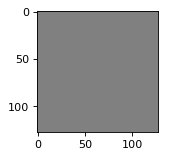

In [22]:
show_slice (mask[0,15], value_range=(-1,1)) 

In [23]:
INPUT_FOLDER = '/home/watts/lal/Kaggle/lung_cancer/cache/stage2/'
OUTPUT_FOLDER = '/home/watts/lal/Kaggle/lung_cancer/cache/predictions/stage2/'
DATA_FOLDER = '/home/watts/lal/Kaggle/lung_cancer/data/stage2/'

In [24]:
if not os.path.exists(OUTPUT_FOLDER):
    os.makedirs (OUTPUT_FOLDER)

In [25]:
working_path = "/home/watts/lal/Kaggle/lung_cancer/"
df = pd.read_csv(working_path+'data/stage2_sample_submission.csv')

df['scan_folder'] = df['id']

df['exist'] = df['scan_folder'].apply(check_if_scan_exists2)

print '%i does not exists' % (len(df) - df['exist'].sum())
print df[~df['exist']]

df = df[df['exist']]
df = df.reset_index(drop=True)

0 does not exists
Empty DataFrame
Columns: [id, cancer, scan_folder, exist]
Index: []


In [26]:
imp_slices = [70,71,72,73,74,75,76,77,78,79,80, 81, 82, 83,84,85,
              86,87,88,89,90,91,92,93,94,95,96, 97, 98, 99,100,101,
              102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,
              118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,
              134,135,136,137,138,139,140,141,142,143,144,149,150,151,152,153,
              202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,
              218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,
              234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,
              302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,
              318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,
              334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,
              402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,
              418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,
              434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,
              502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,
              518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,
              534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549
             ]


  0%|          | 0/506 [00:00<?, ?it/s]

/home/watts/lal/Kaggle/lung_cancer/cache/stage1/0015ceb851d7251b8f399e39779d1e7d.npy
0


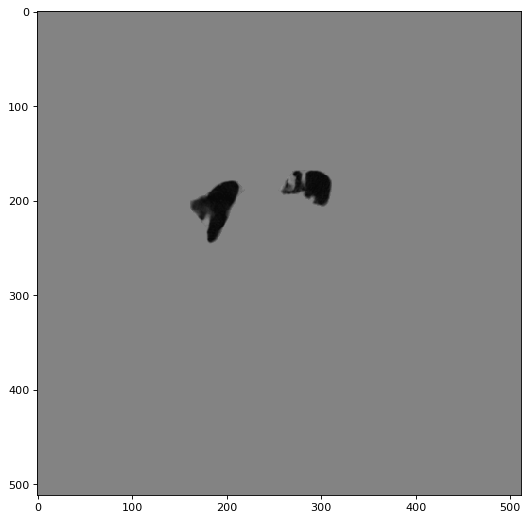

1


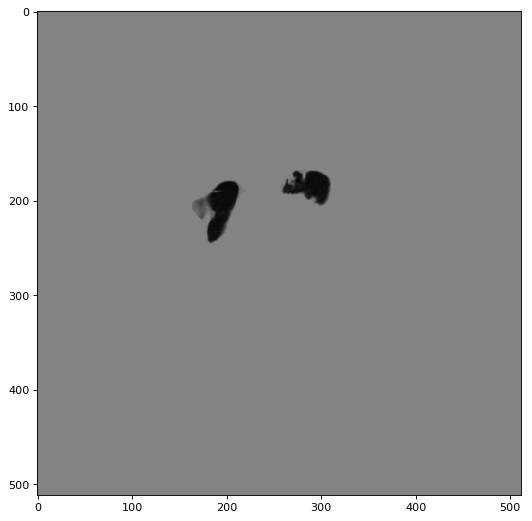

2


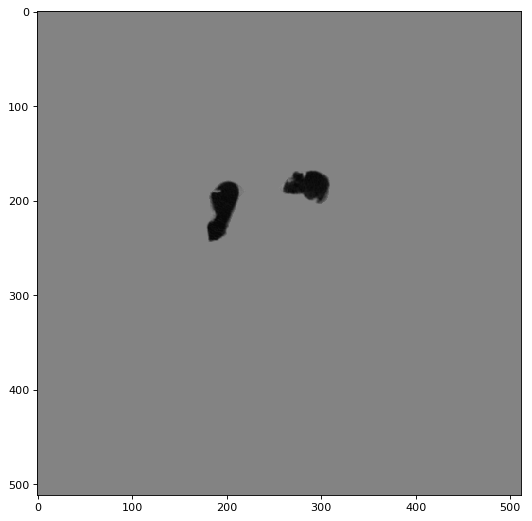

3


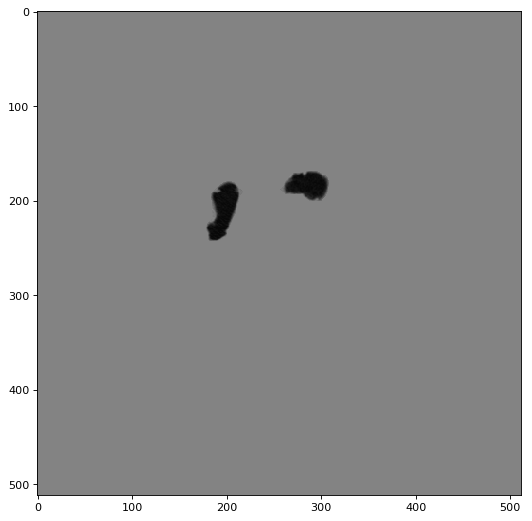

4


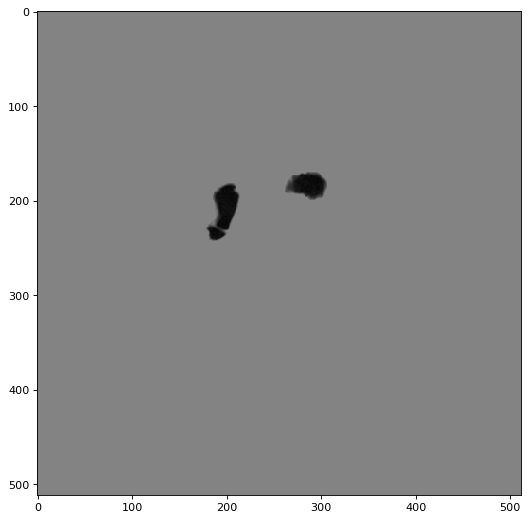

5


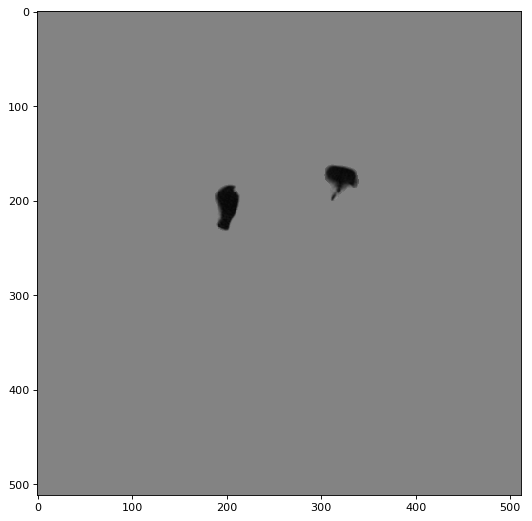

6


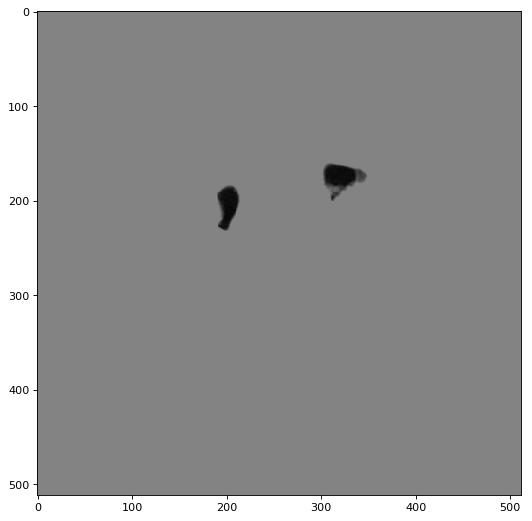

7


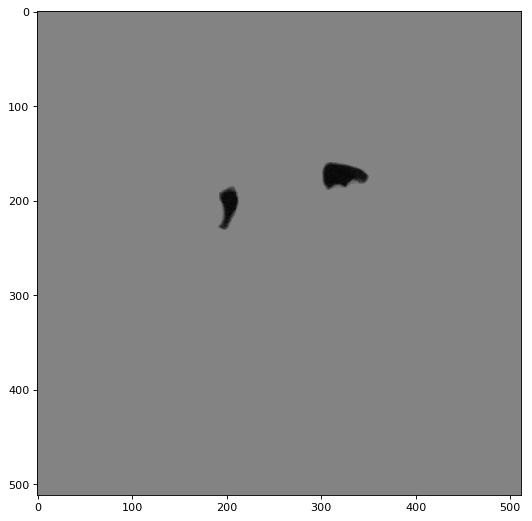

8


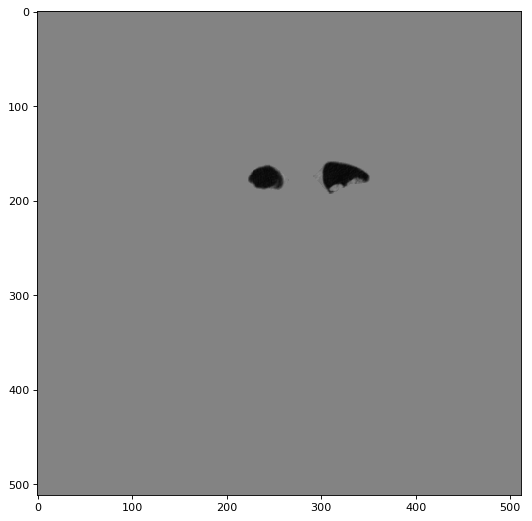

9


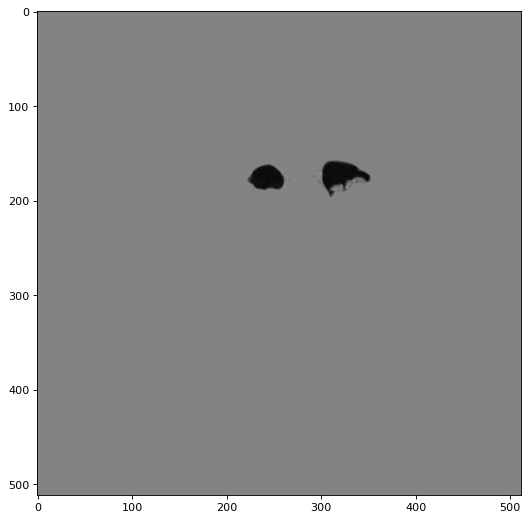

10


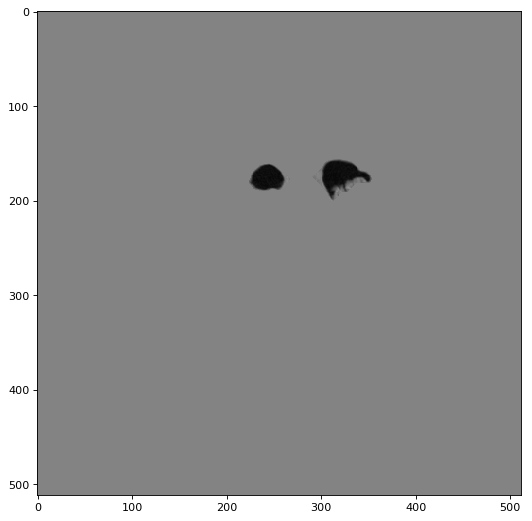

11


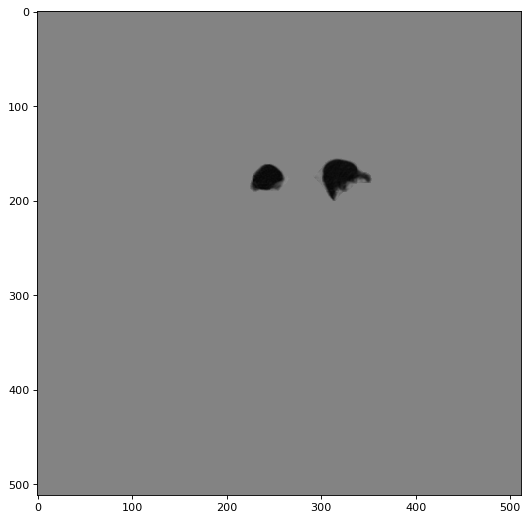

12


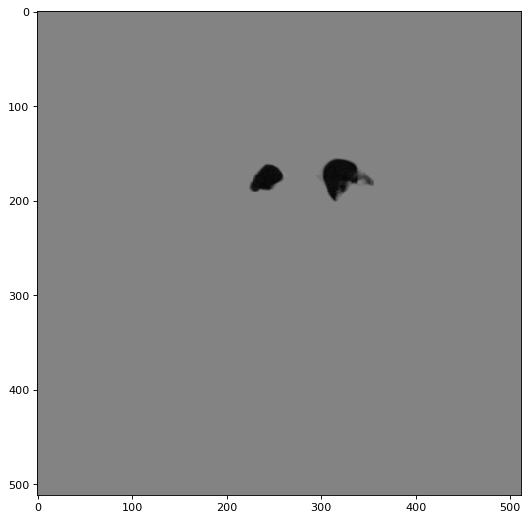

13


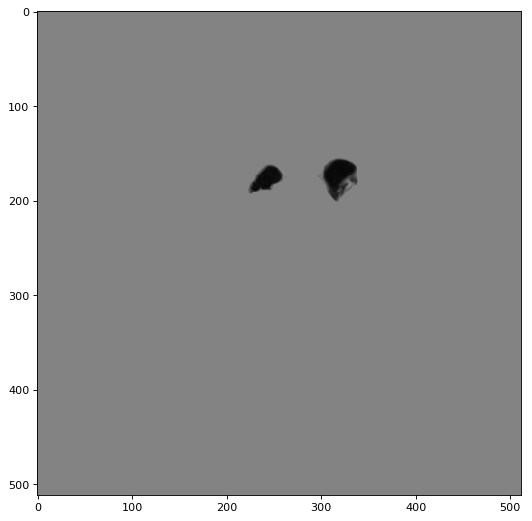

14


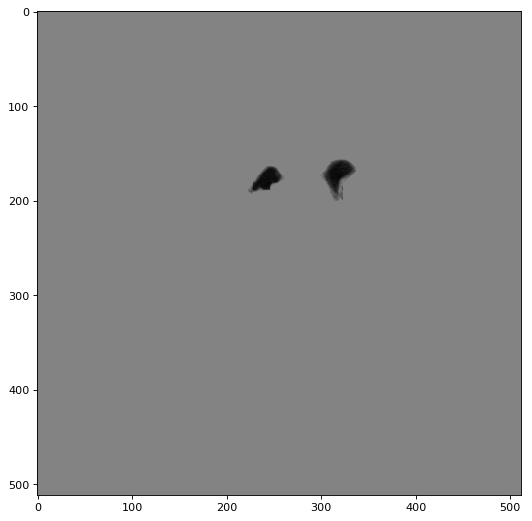

15


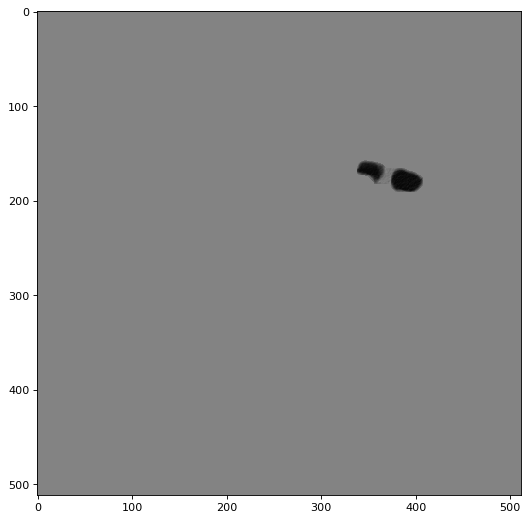

16


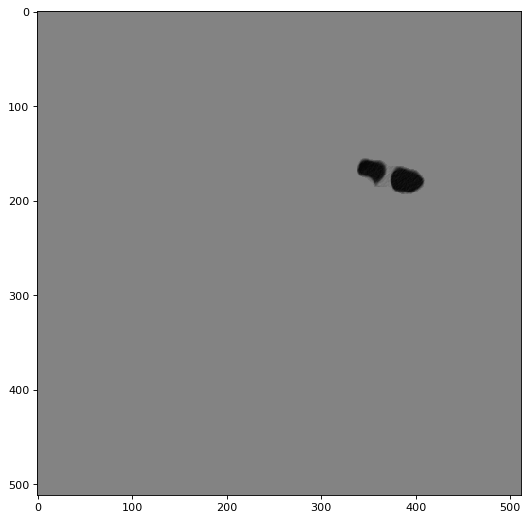

17


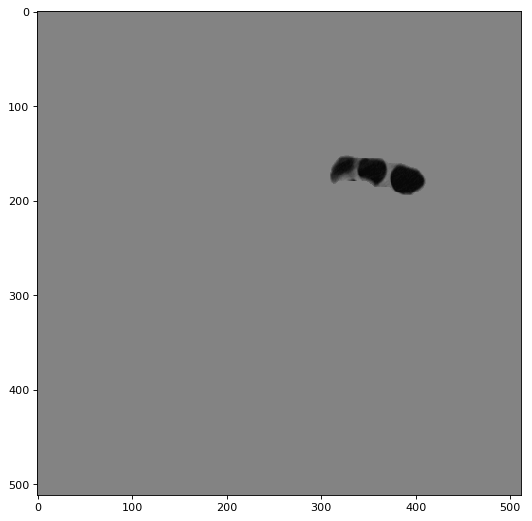

18


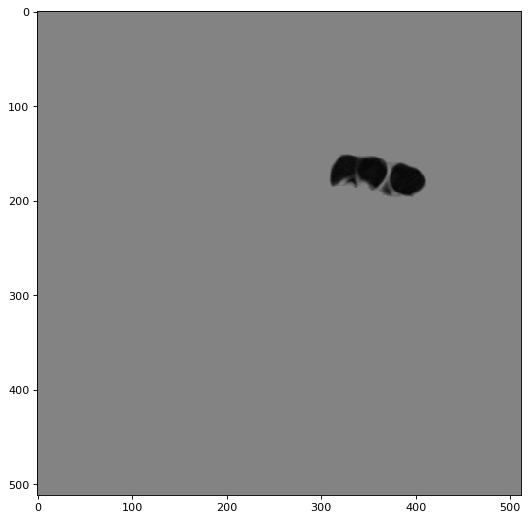

19


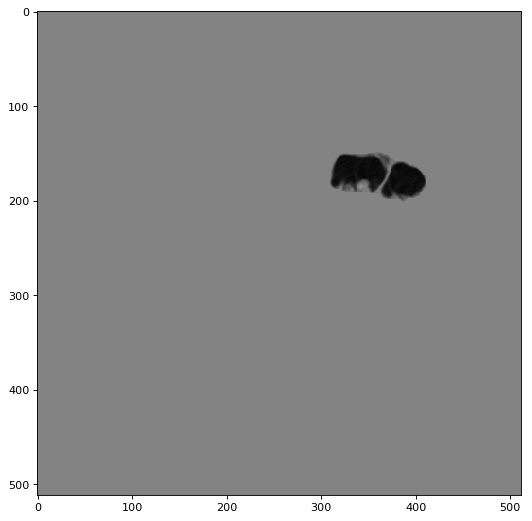

20


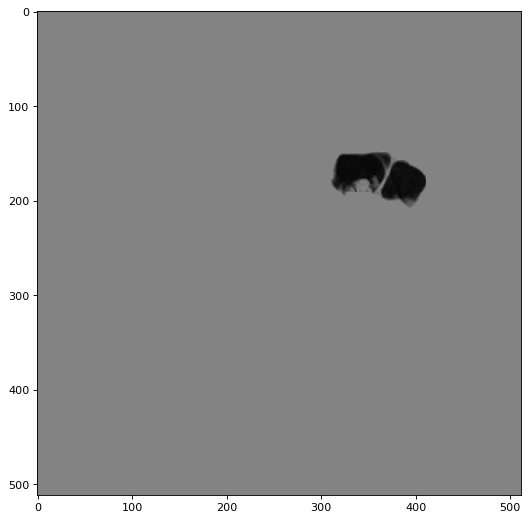

21


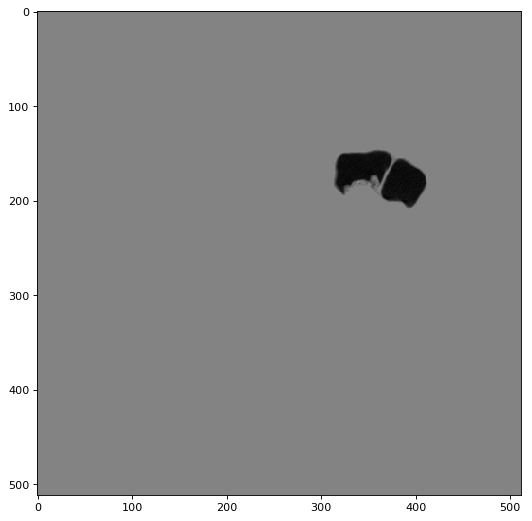

22


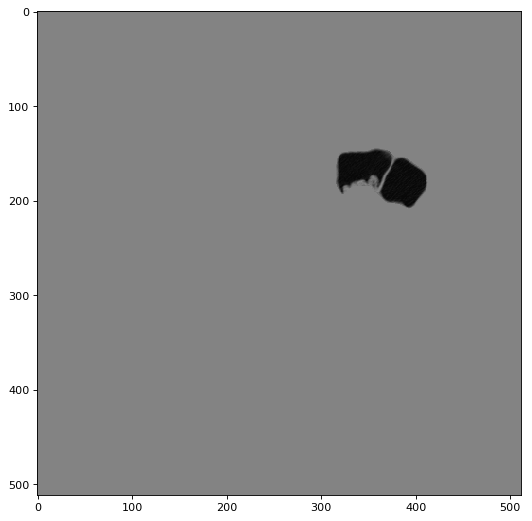

23


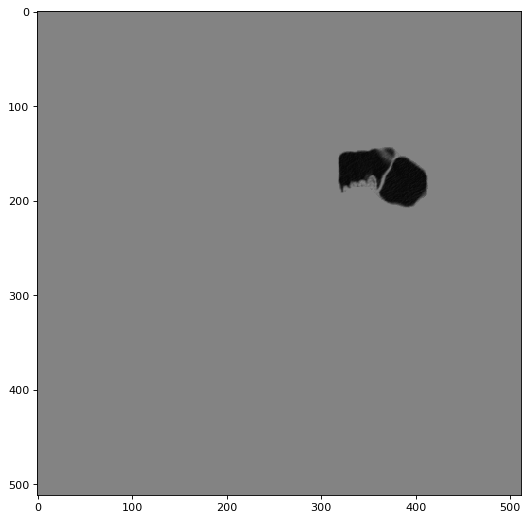

24


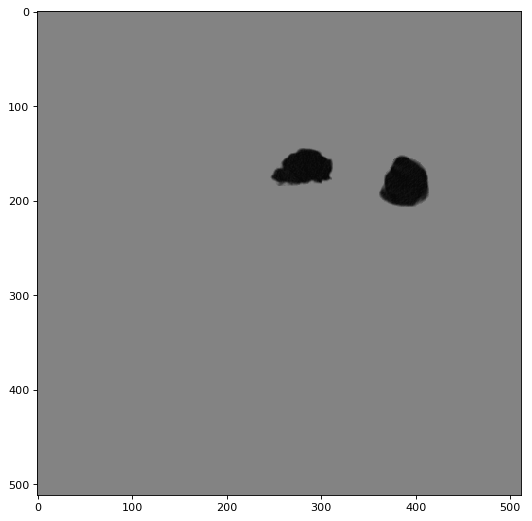

25


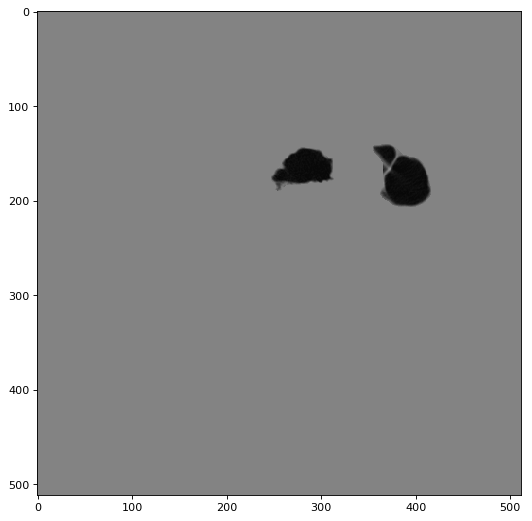

26


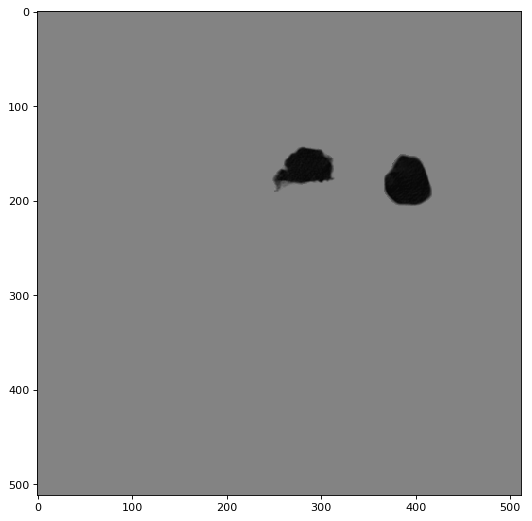

27


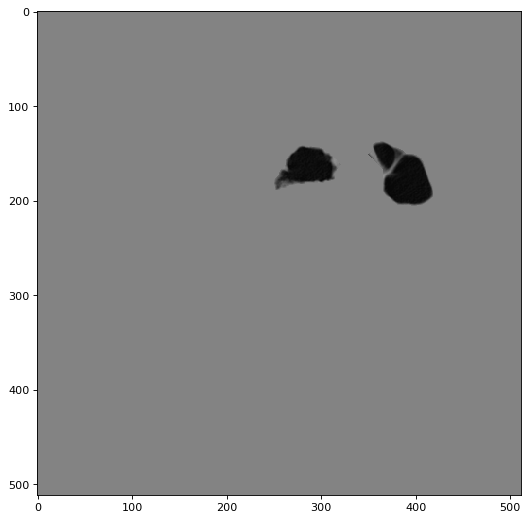

28


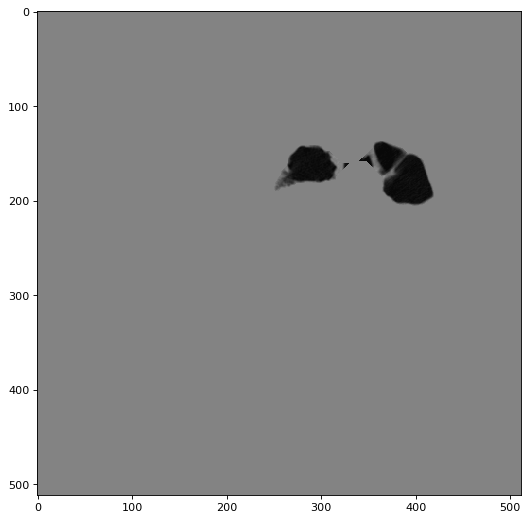

29


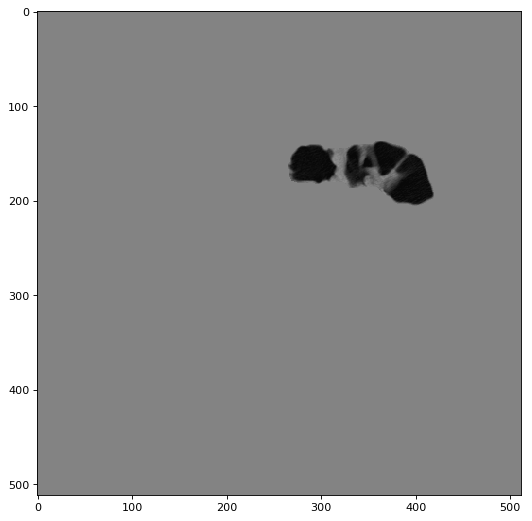

30


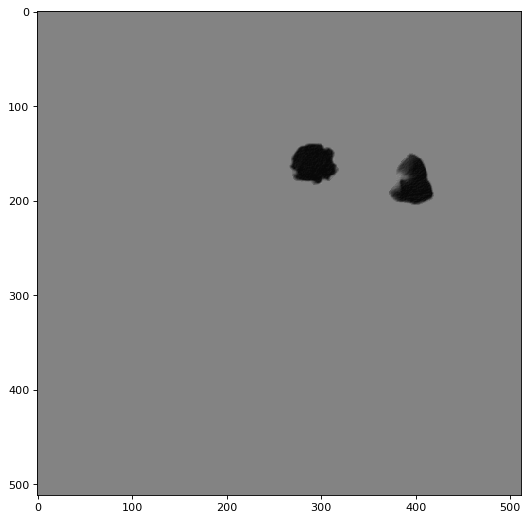

31


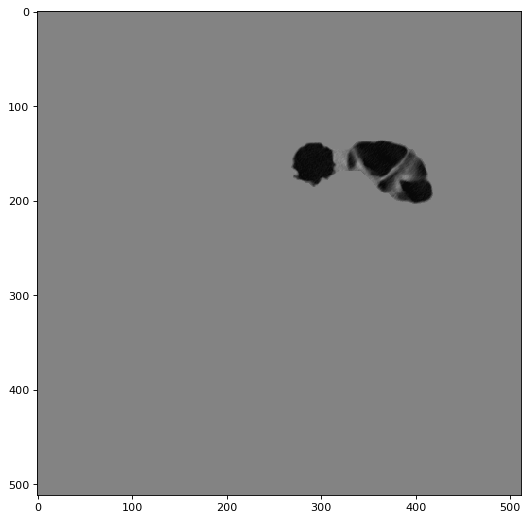

32


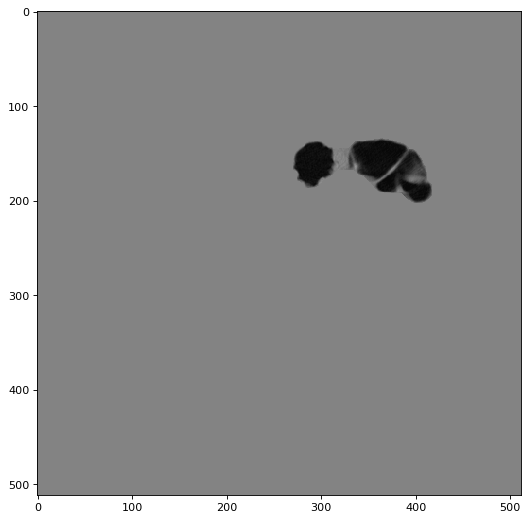

33


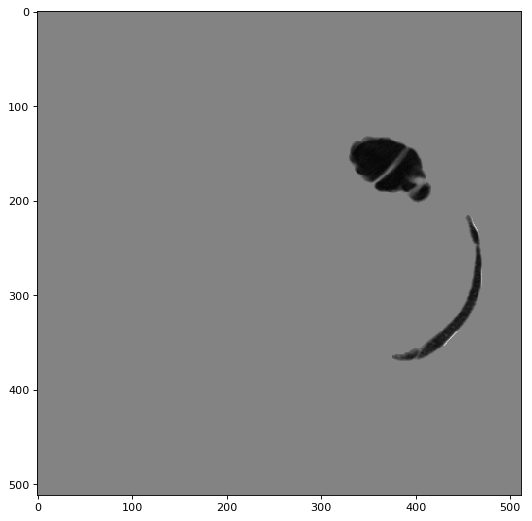

34


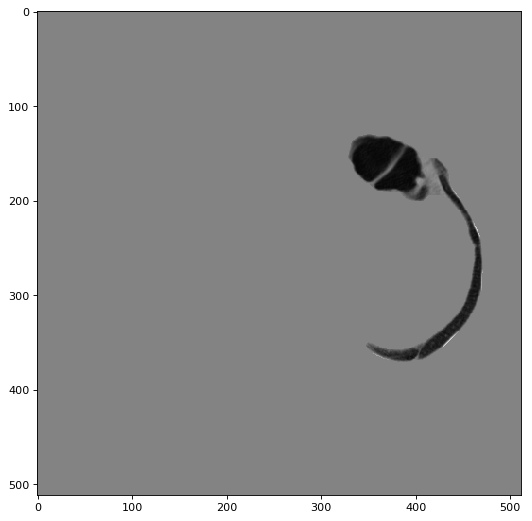

35


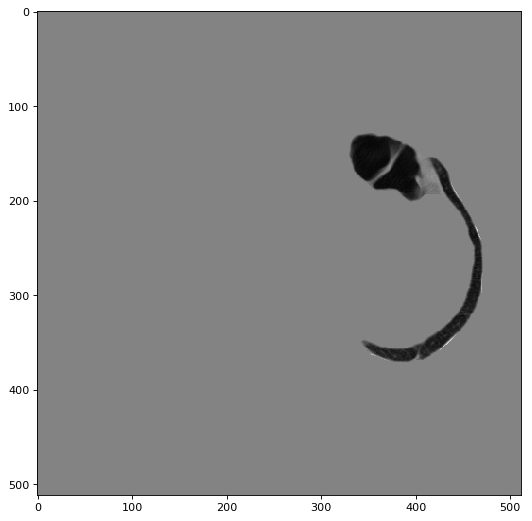

36


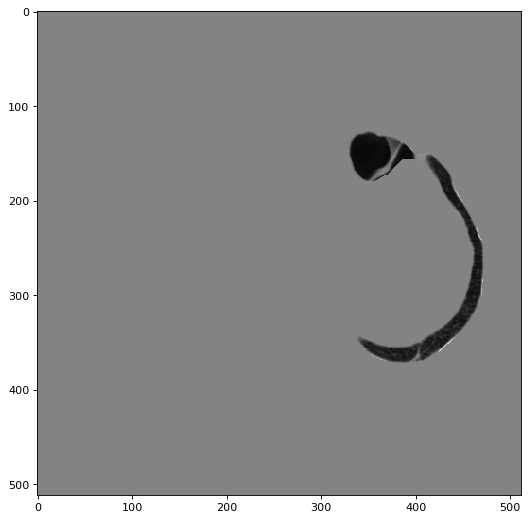

37


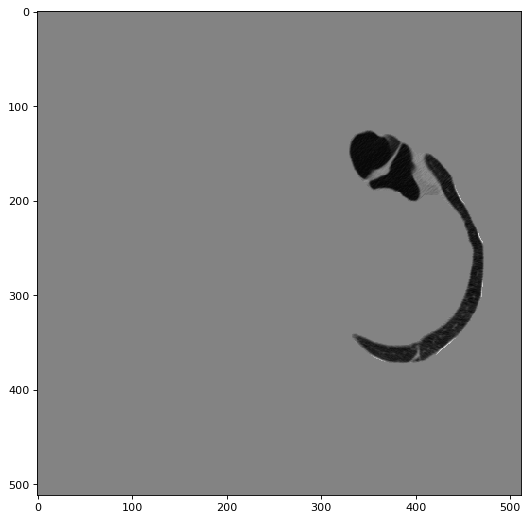

38


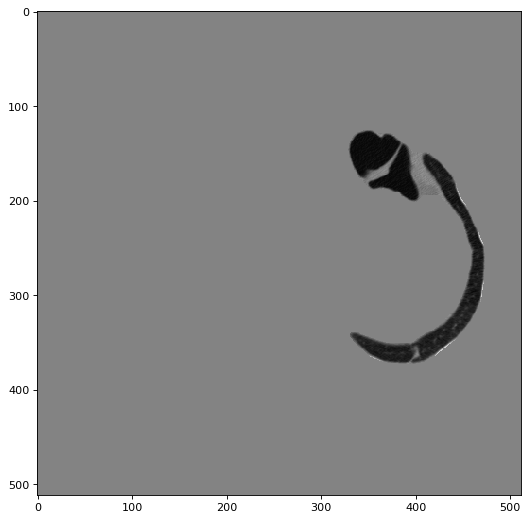

39


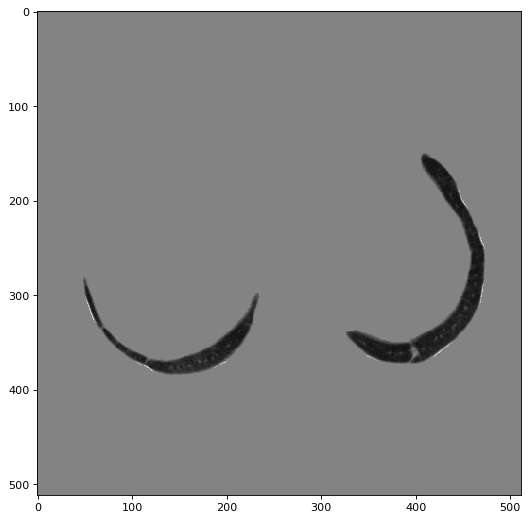

40


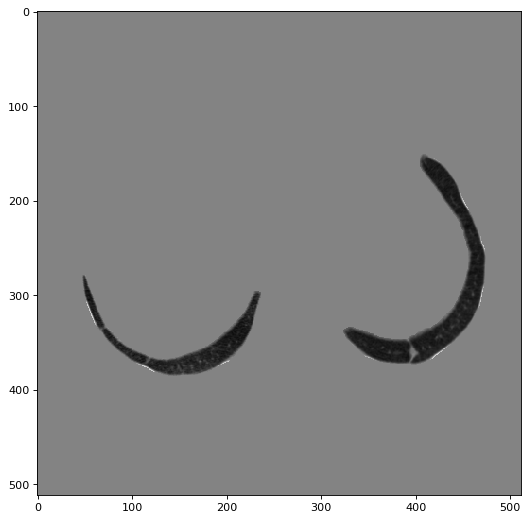

41


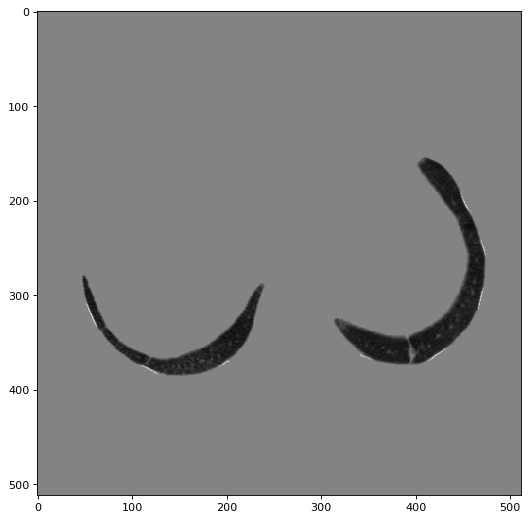

42


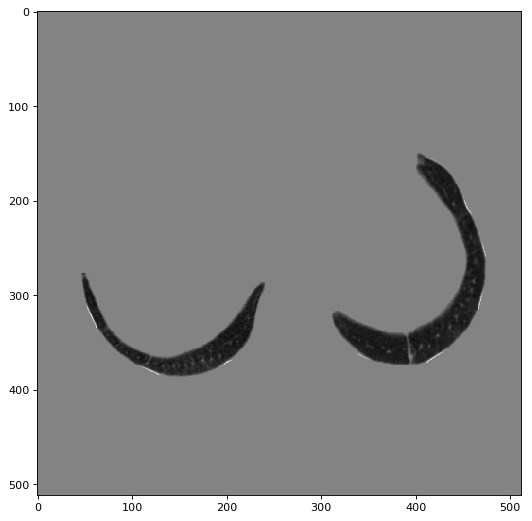

43


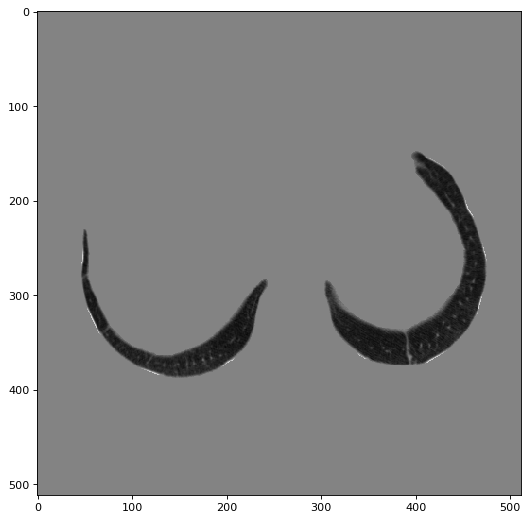

44


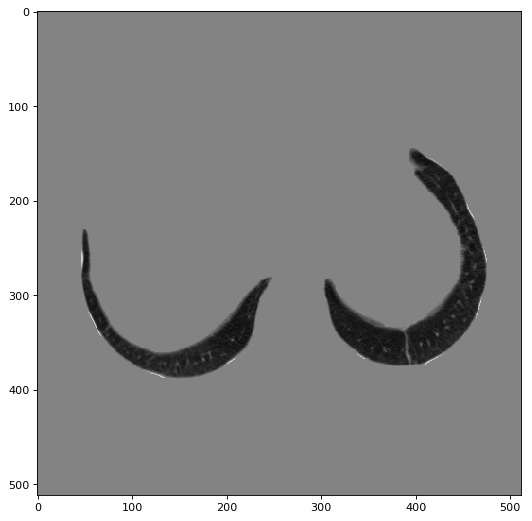

45


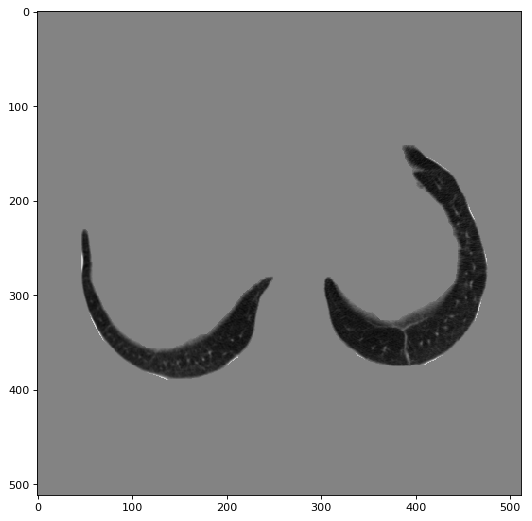

46


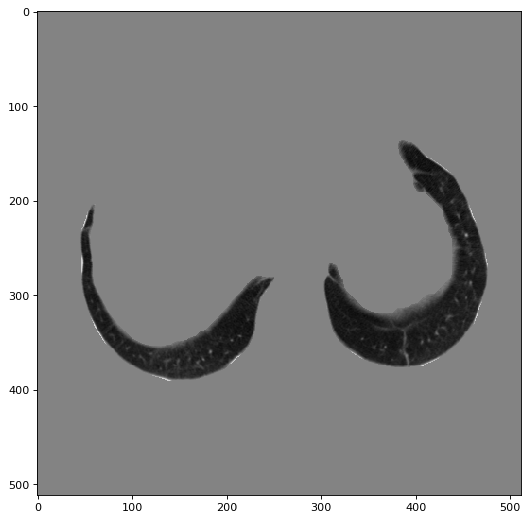

47


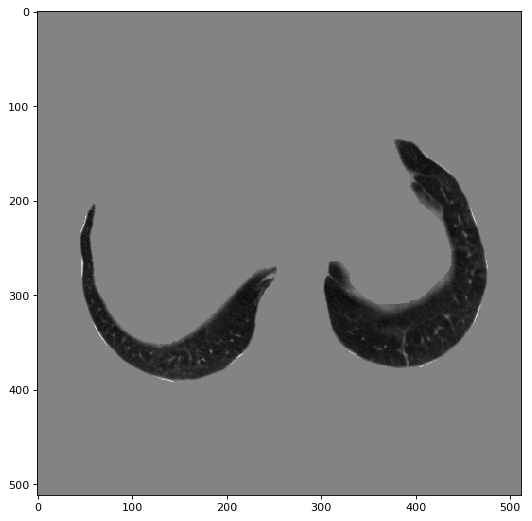

48


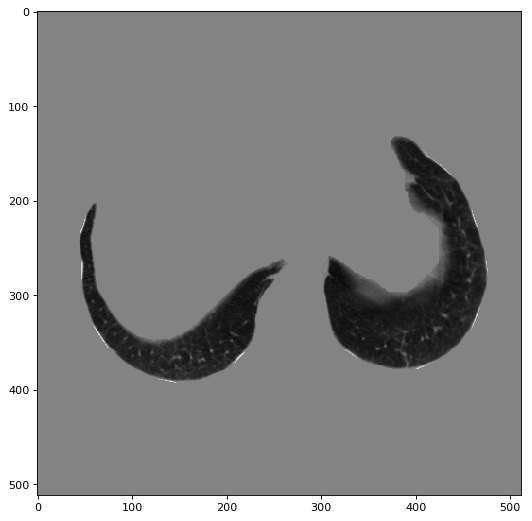

49


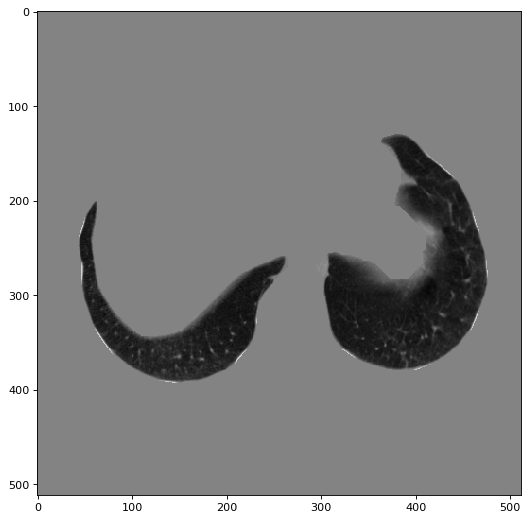

50


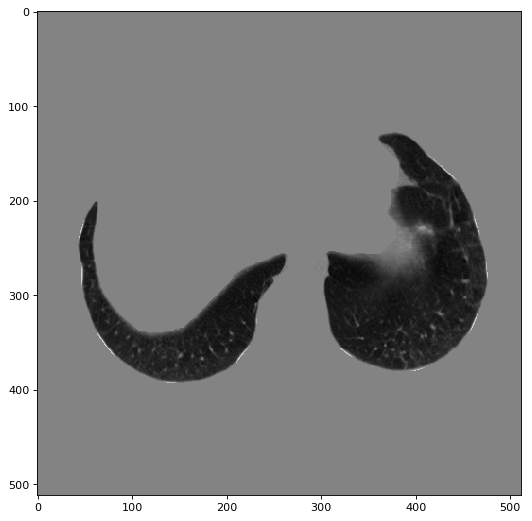

51


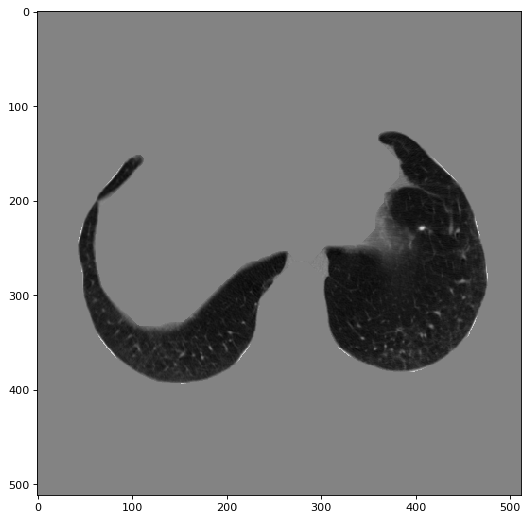

52


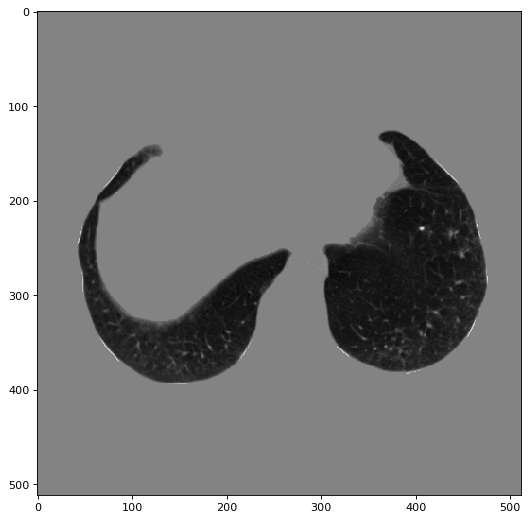

53


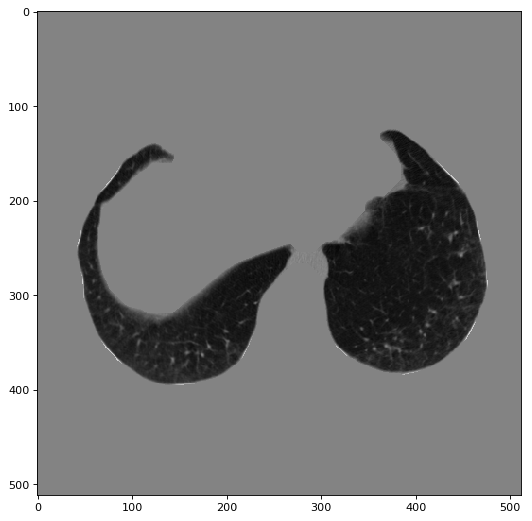

54


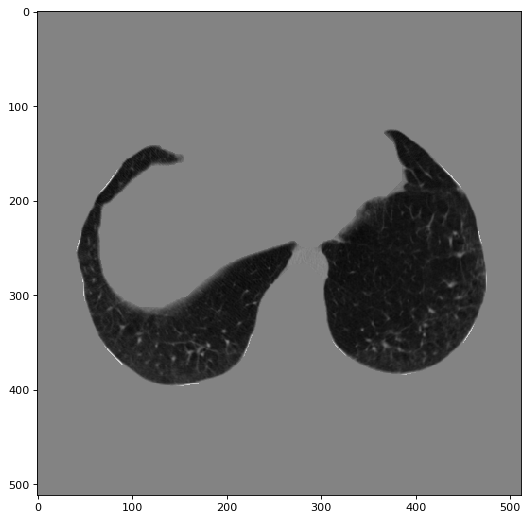

55


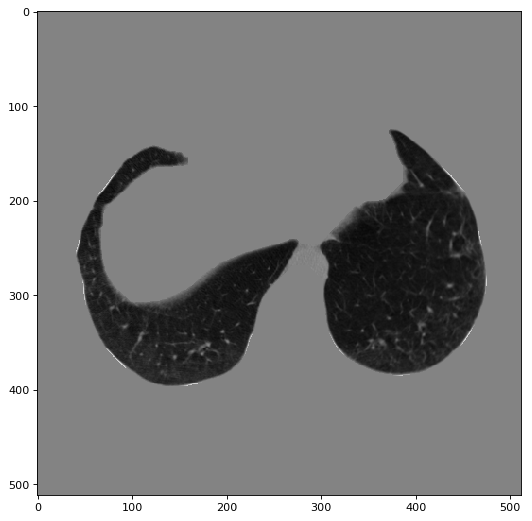

56


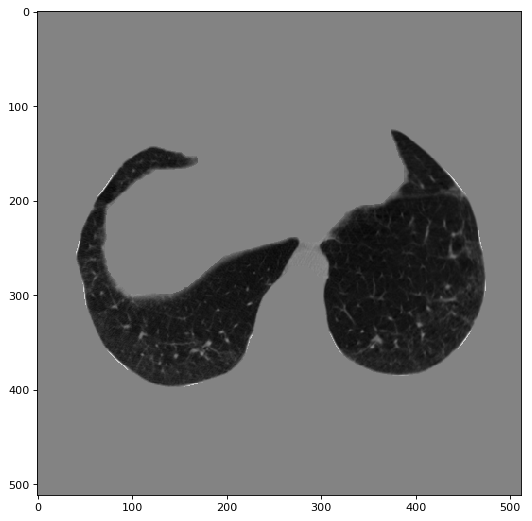

57


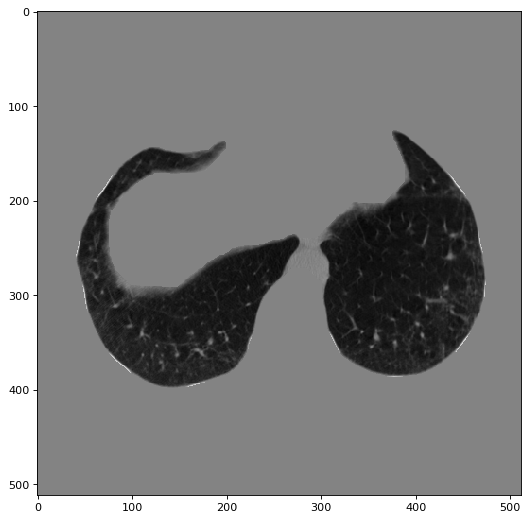

58


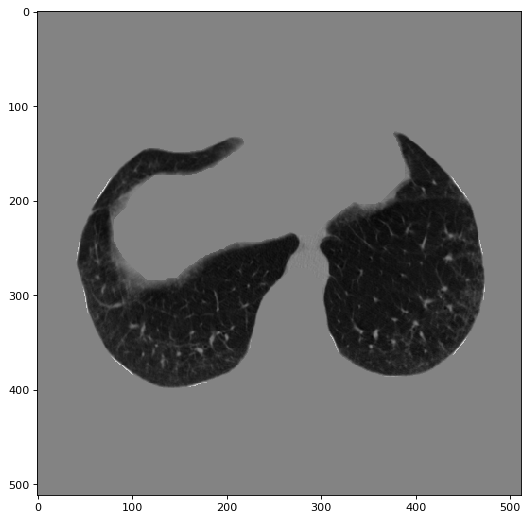

59


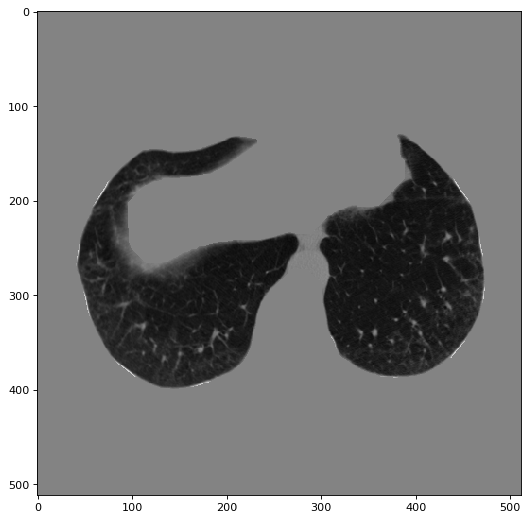

60


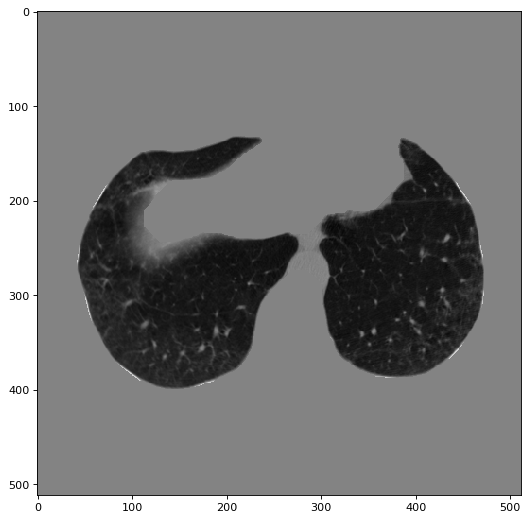

61


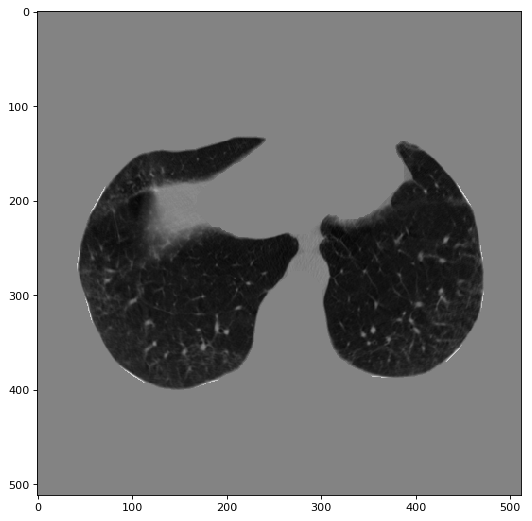

62


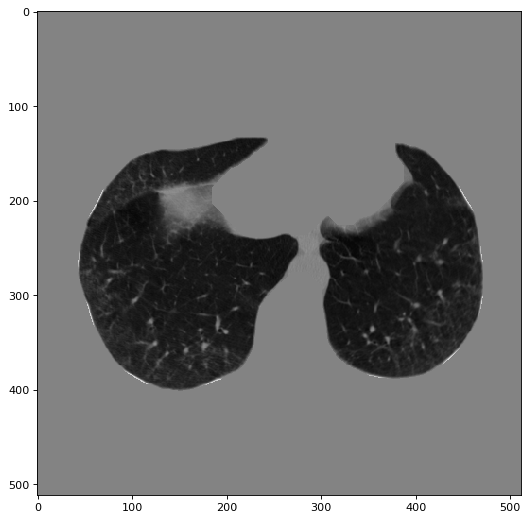

63


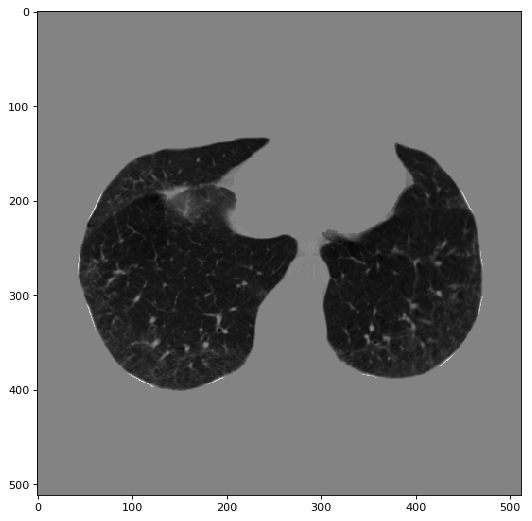

64


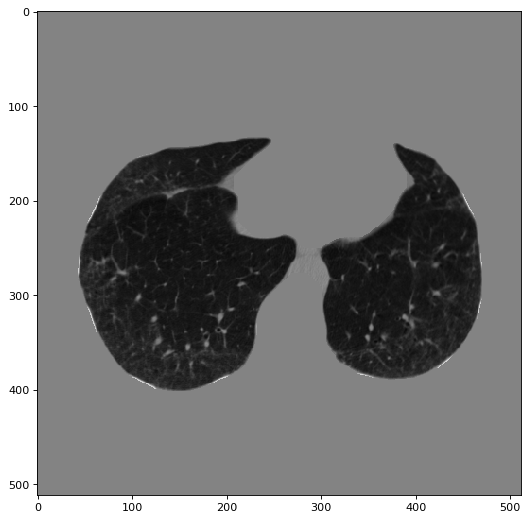

65


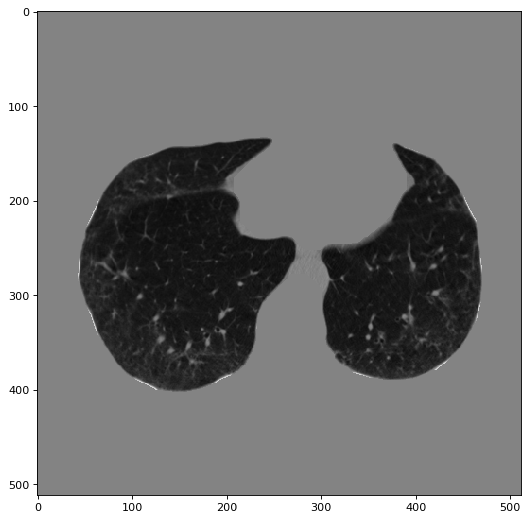

66


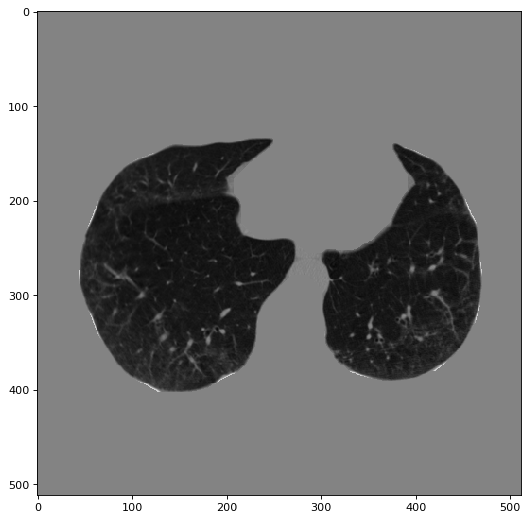

67


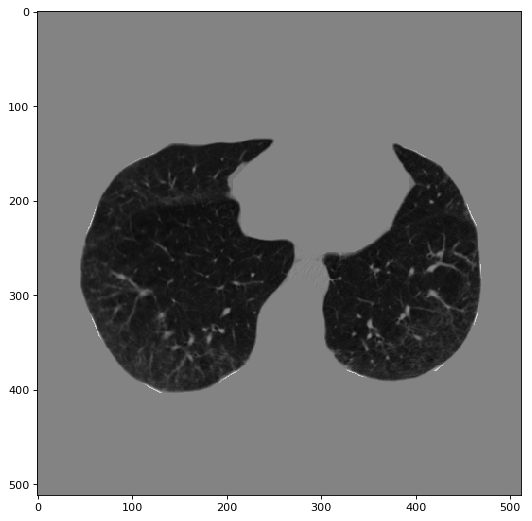

68


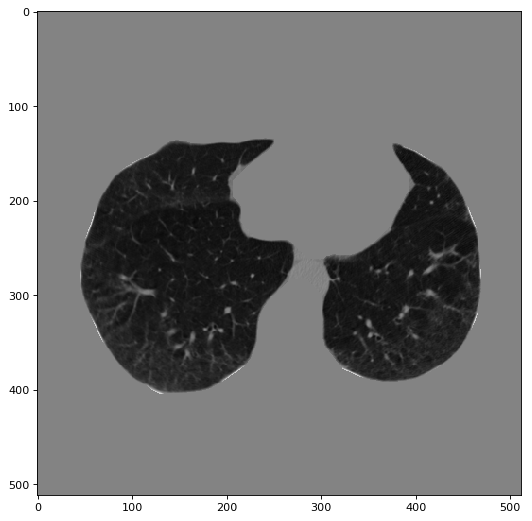

69


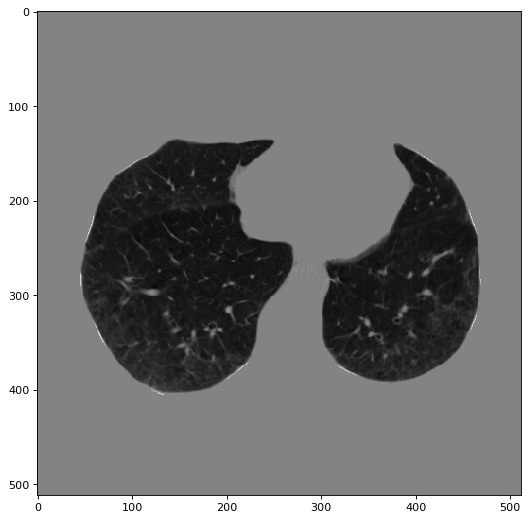

70


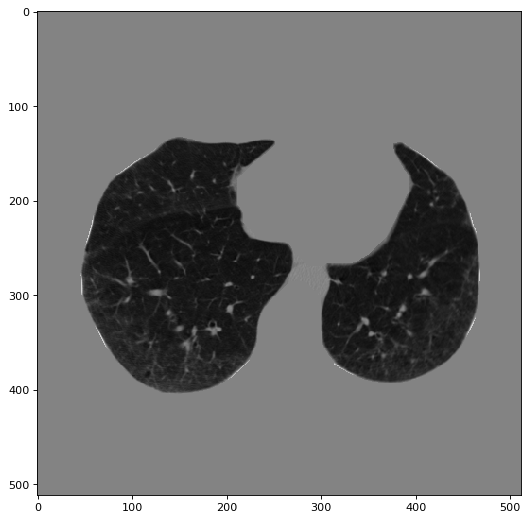

71


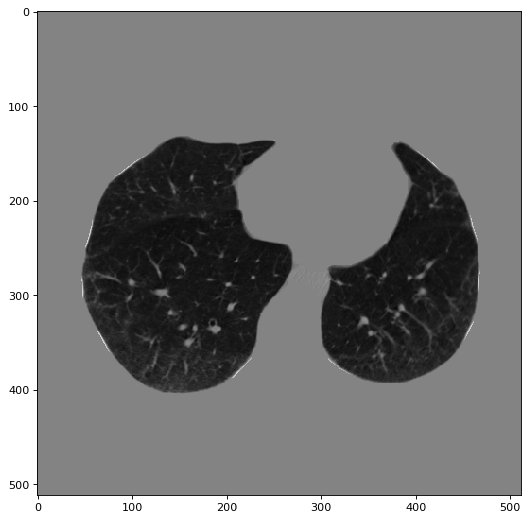

72


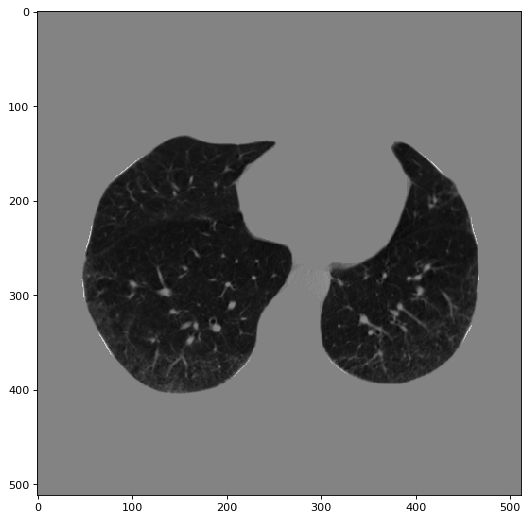

73


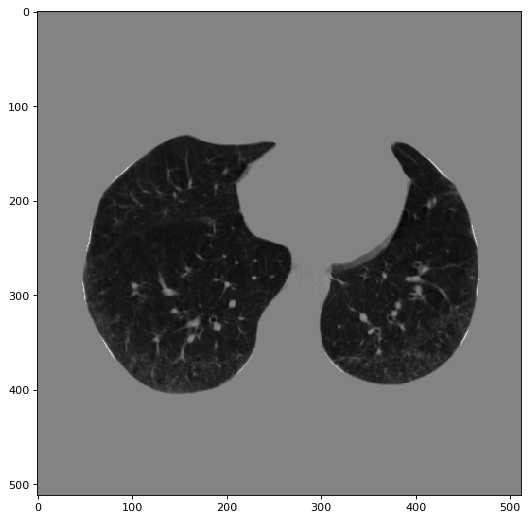

74


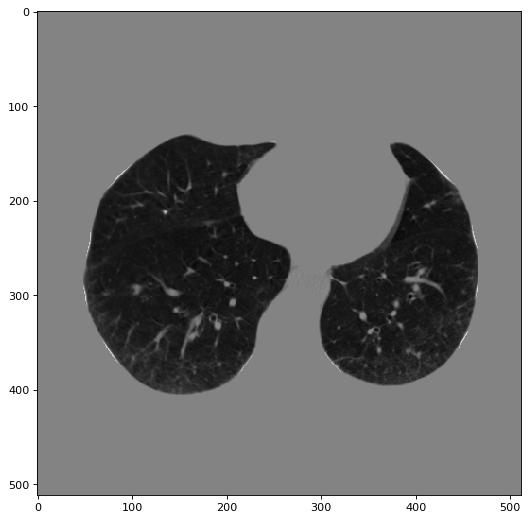

75


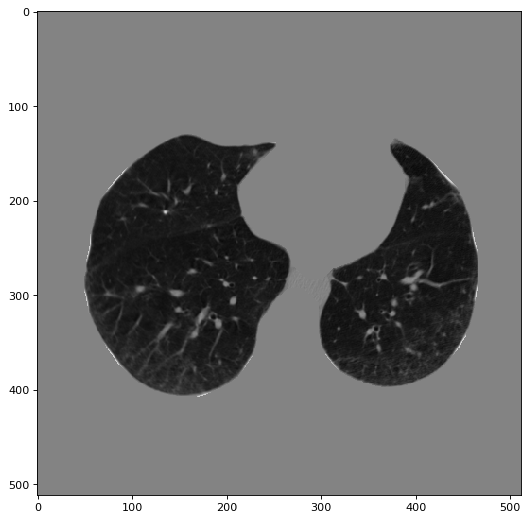

76


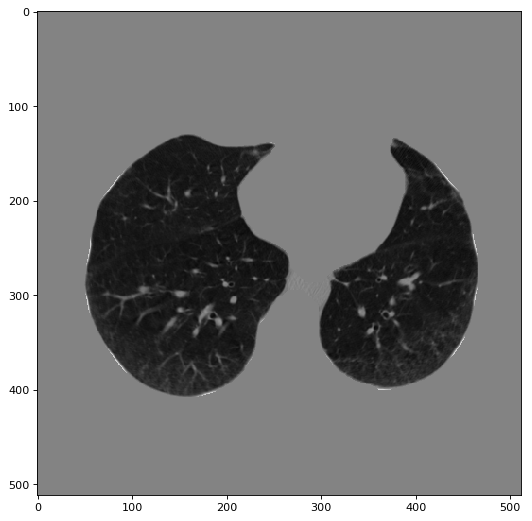

77


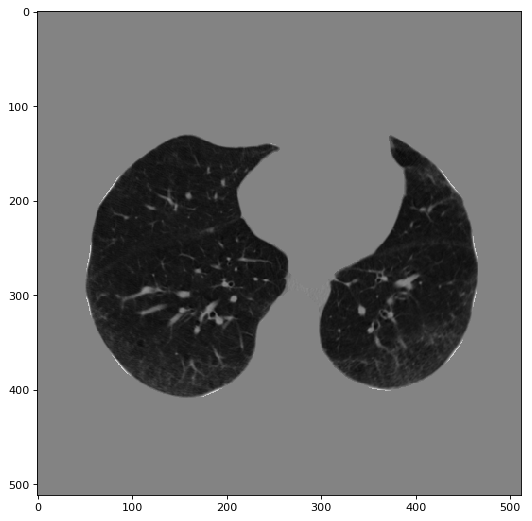

78


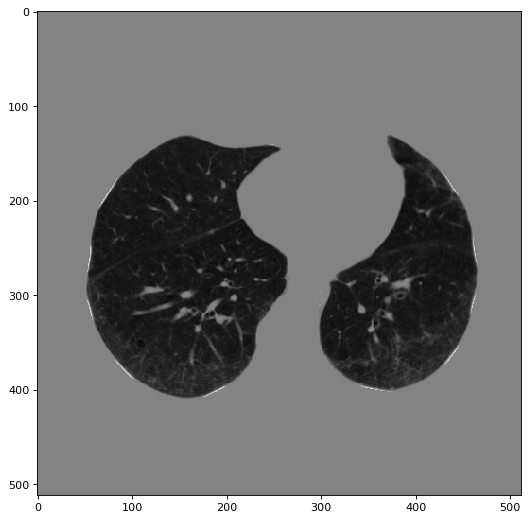

79


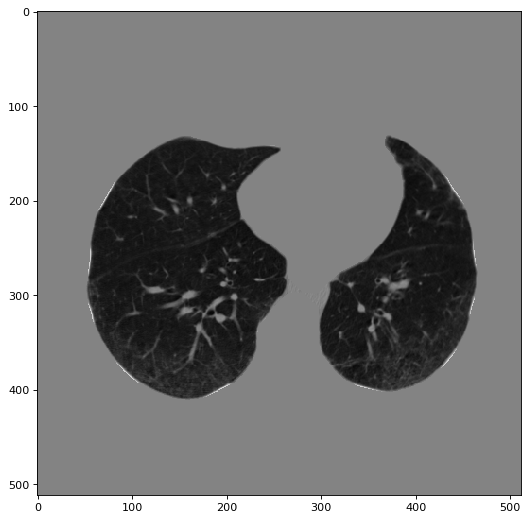

80


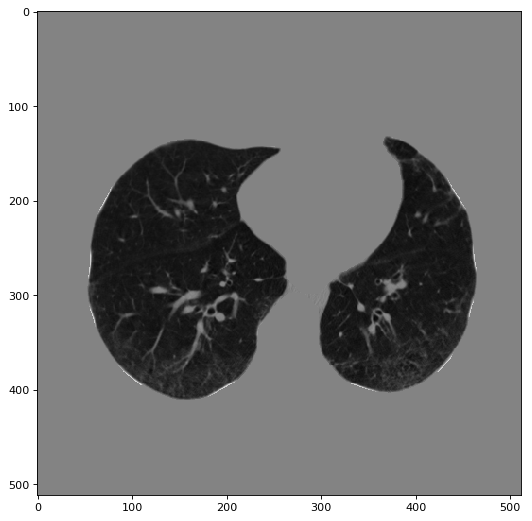

81


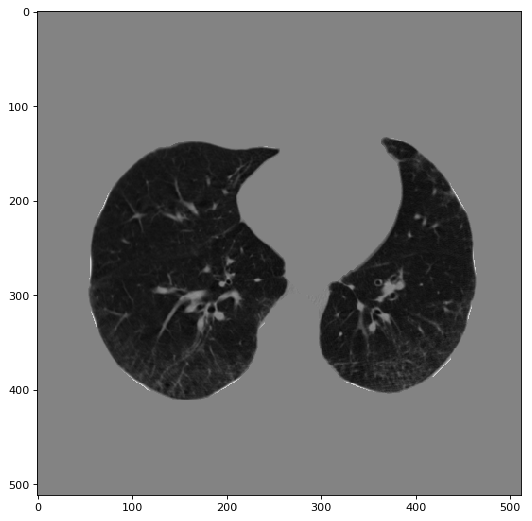

82


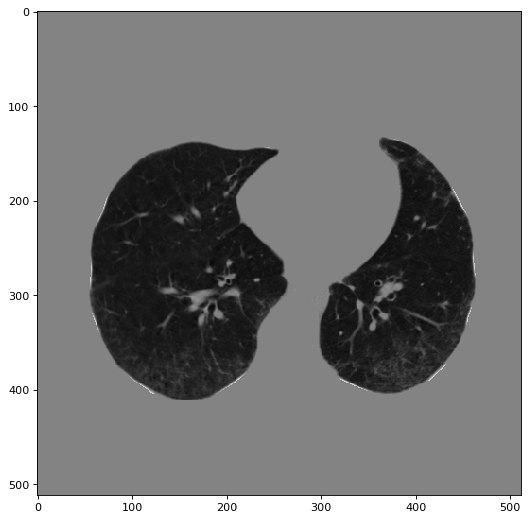

83


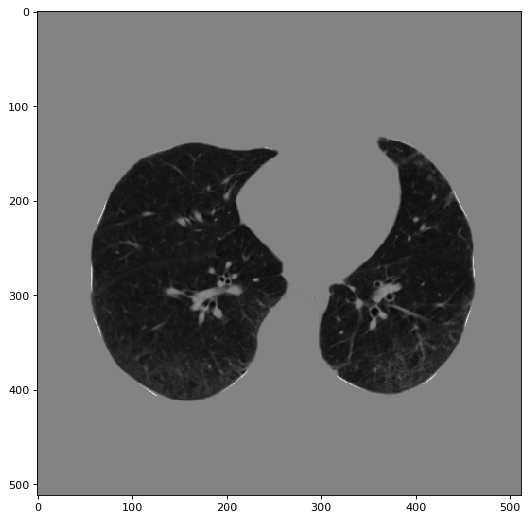

84


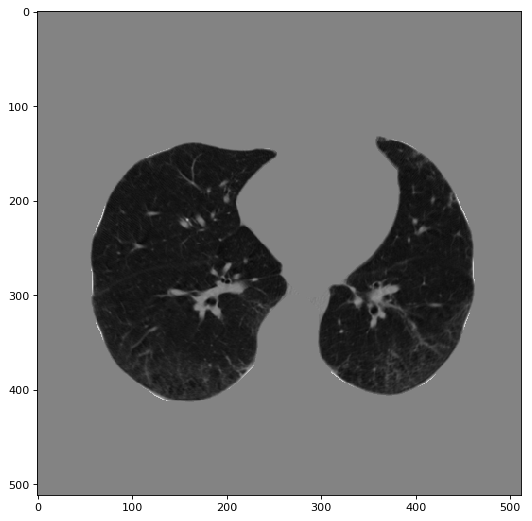

85


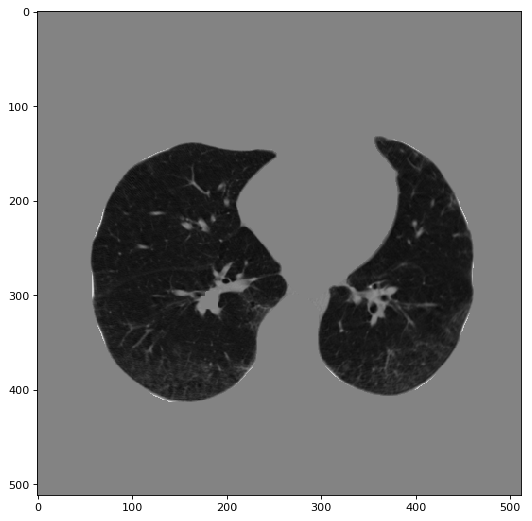

86


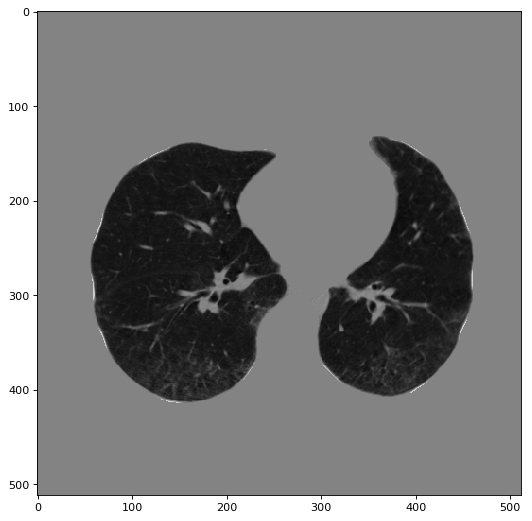

87


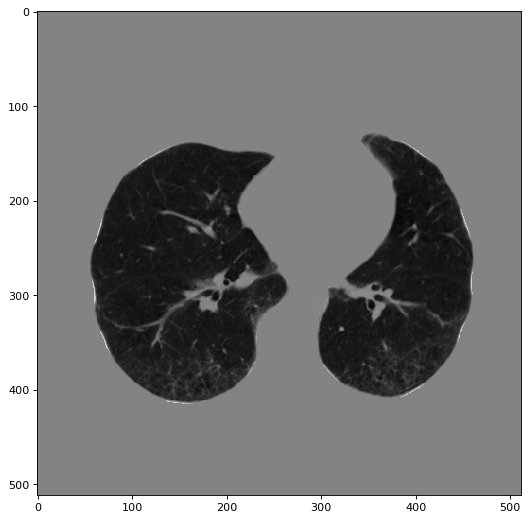

88


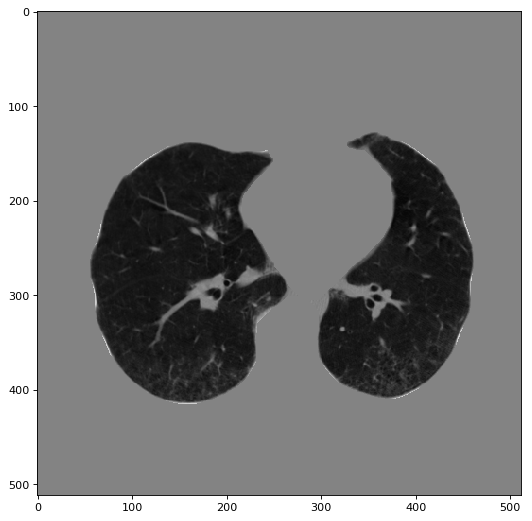

89


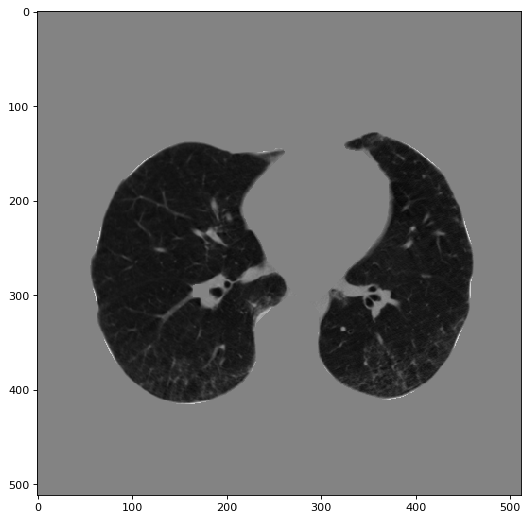

90


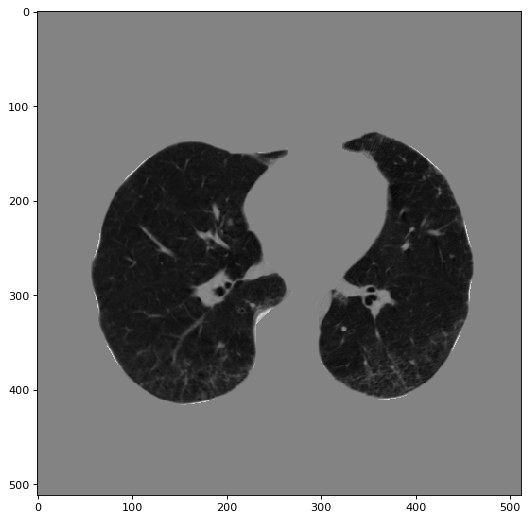

91


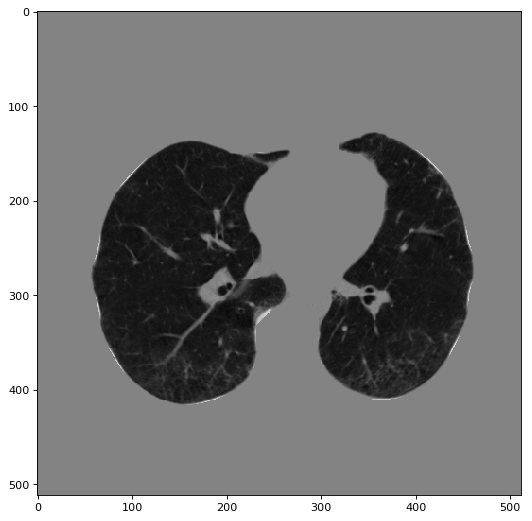

92


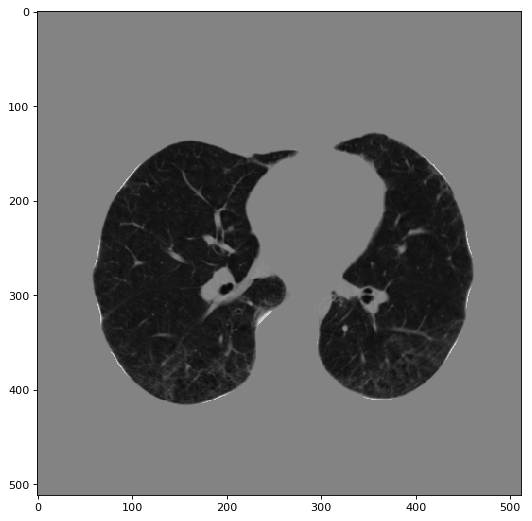

93


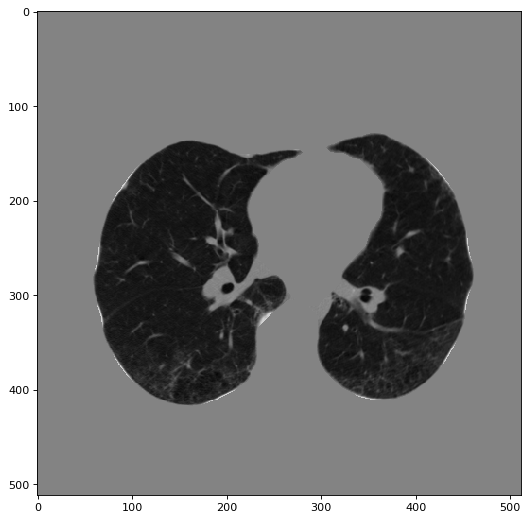

94


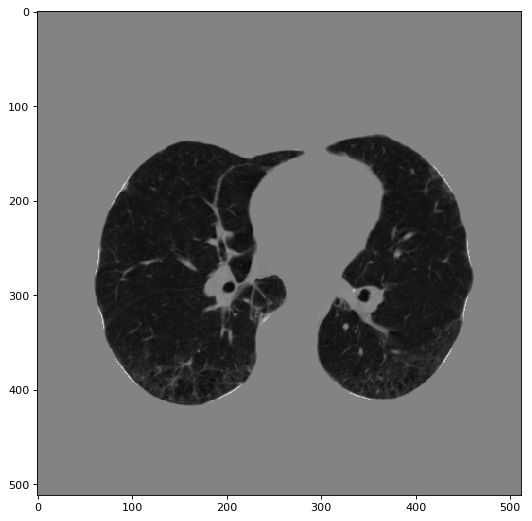

95


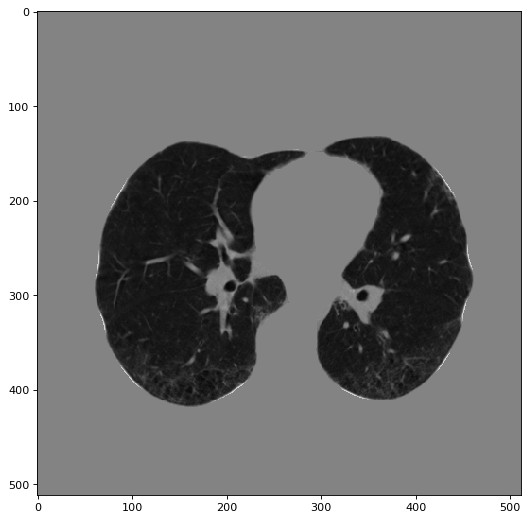

96


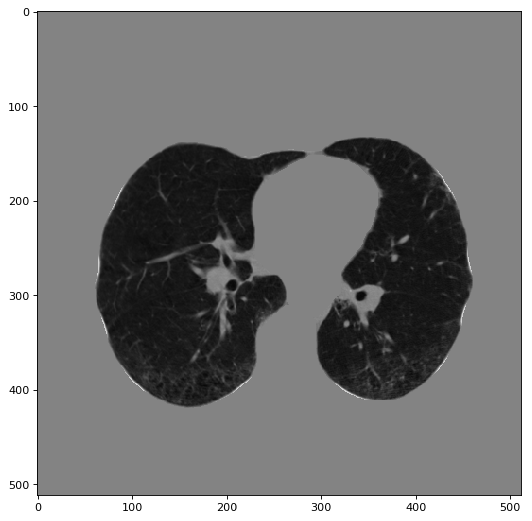

97


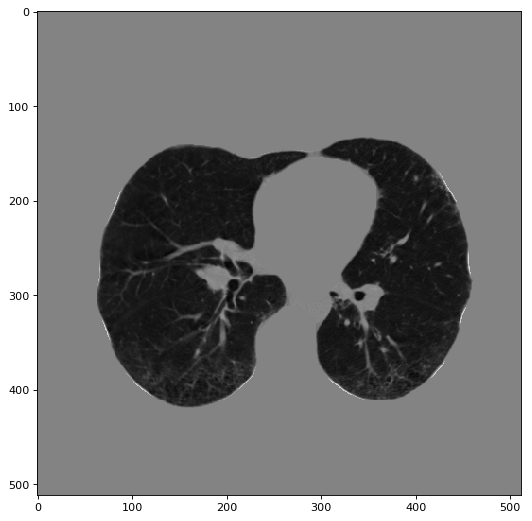

98


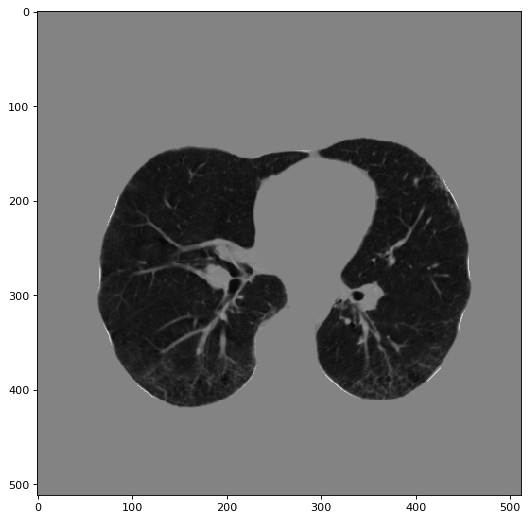

99


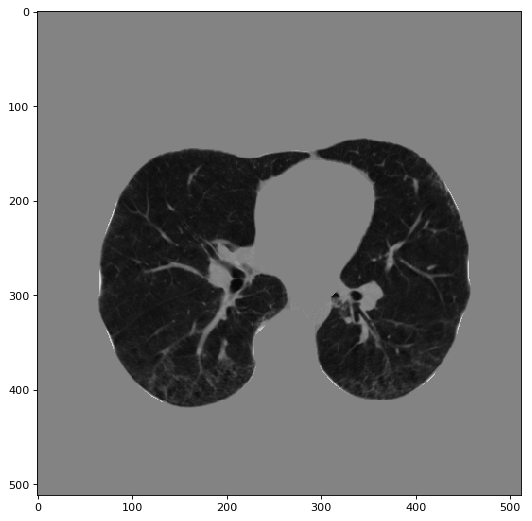

100


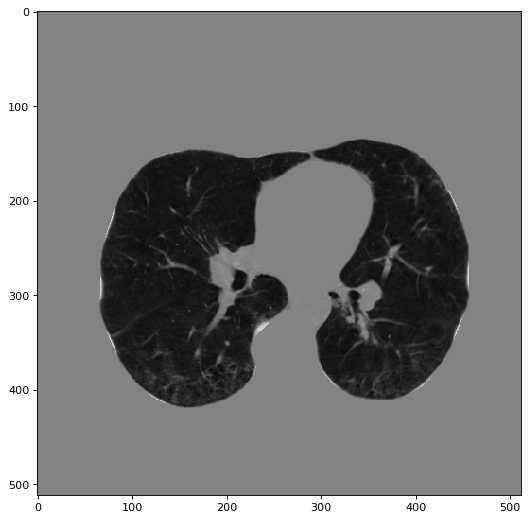

101


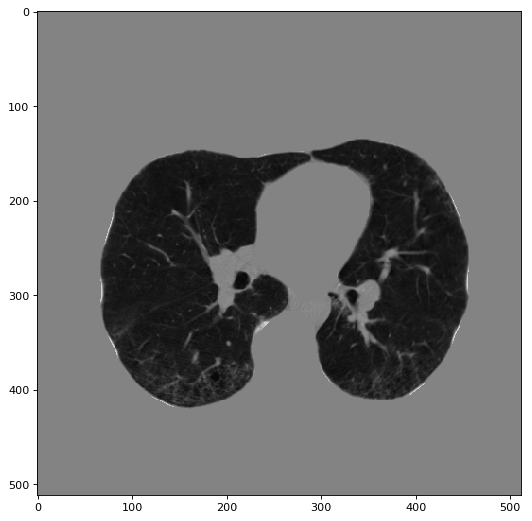

102


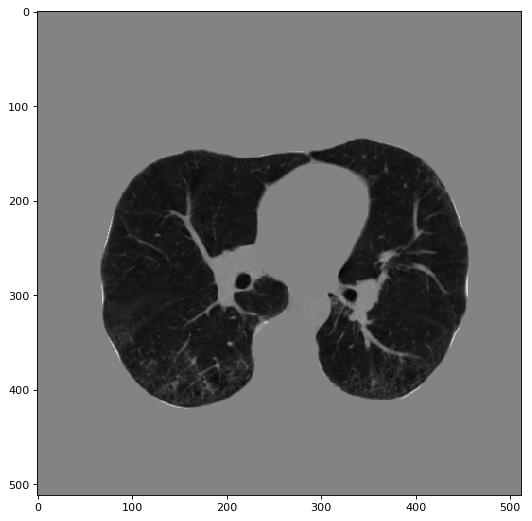

103


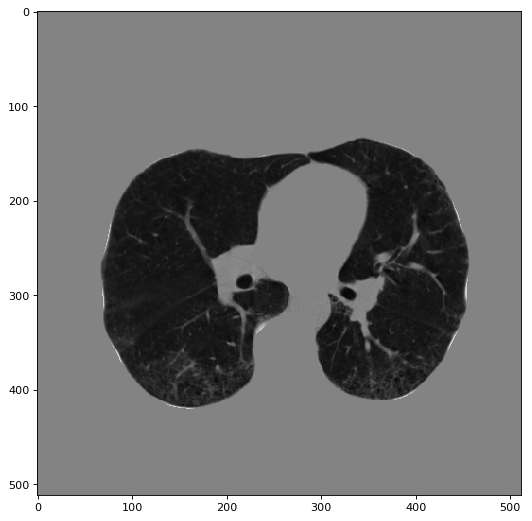

104


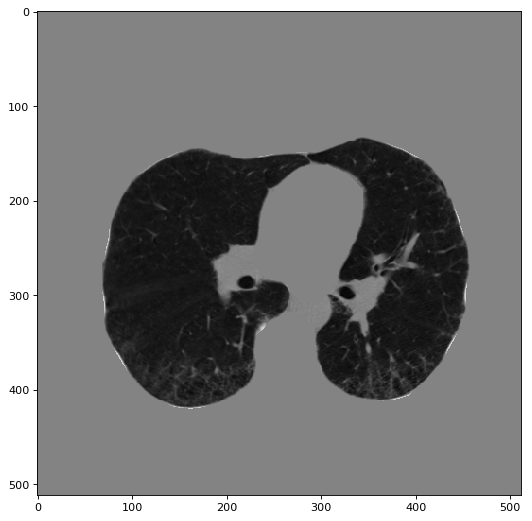

105


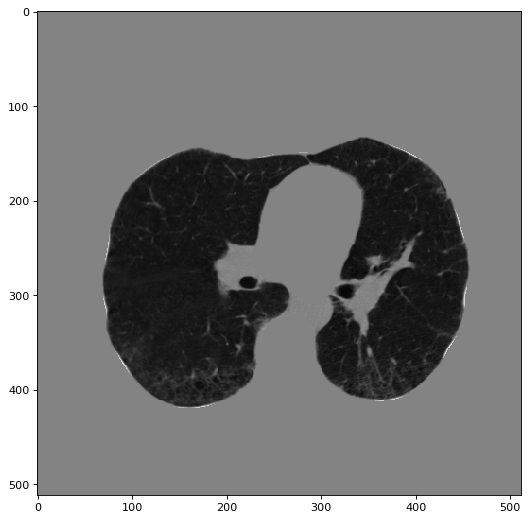

106


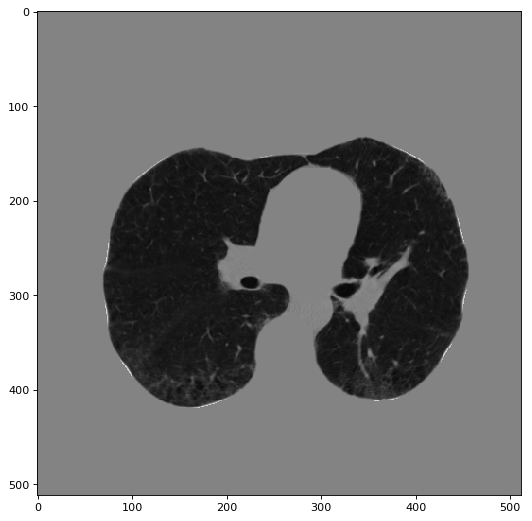

107


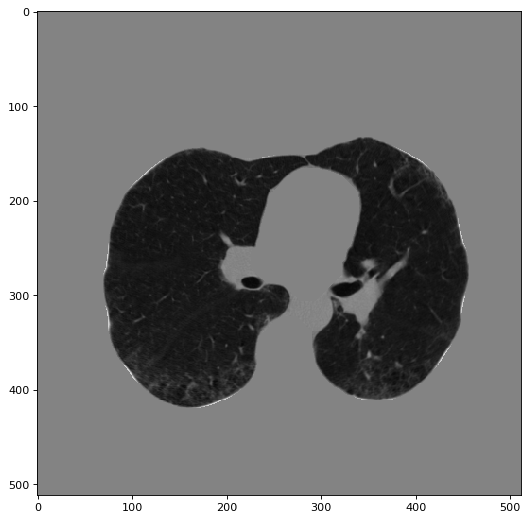

108


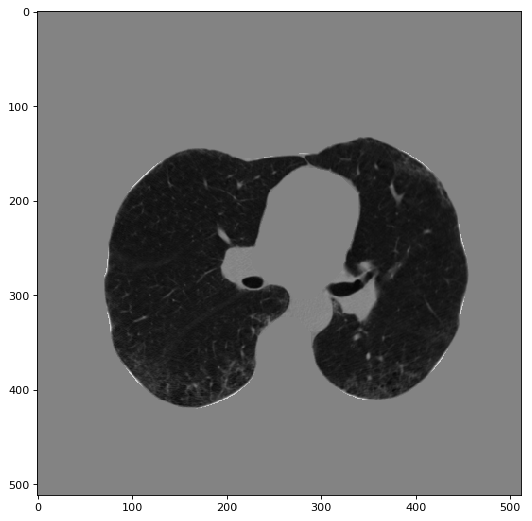

109


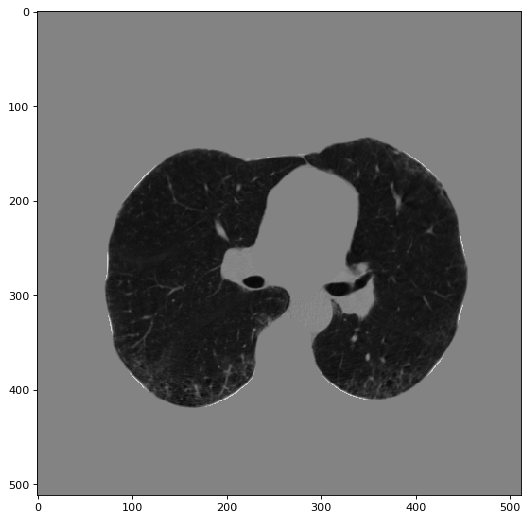

110


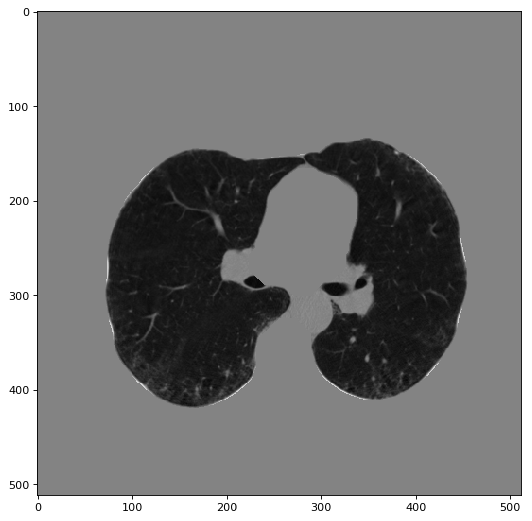

111


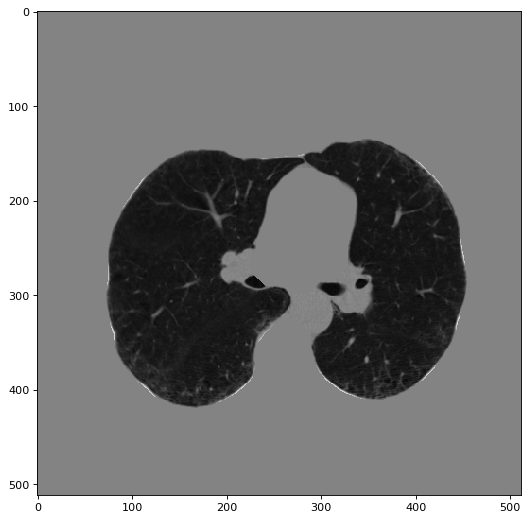

112


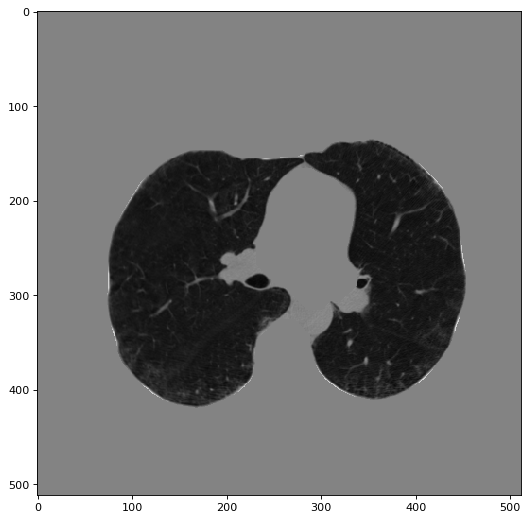

113


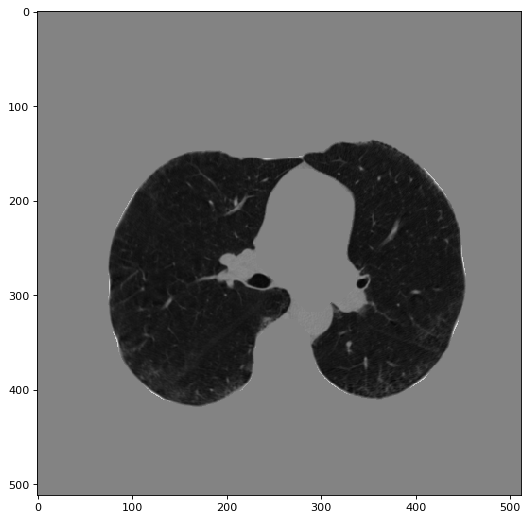

114


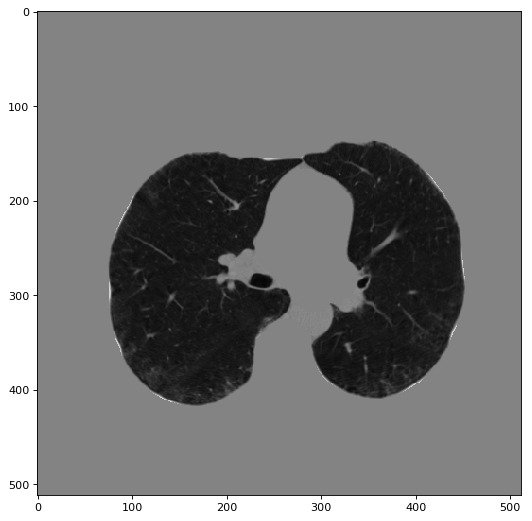

115


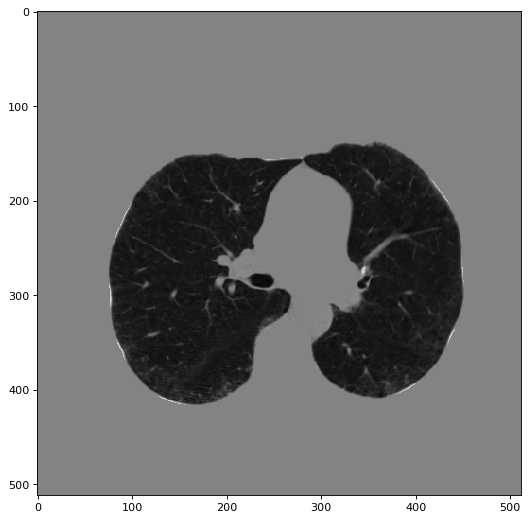

116


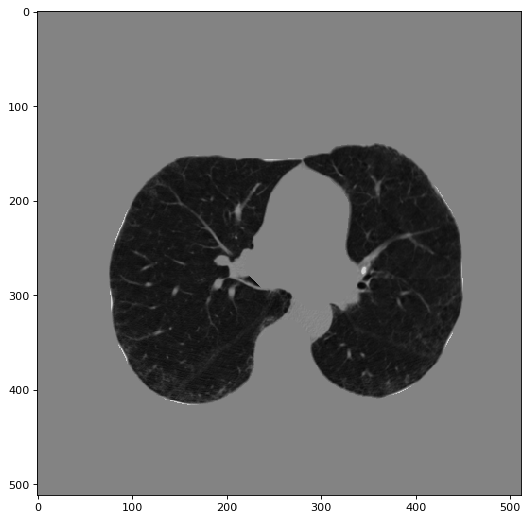

117


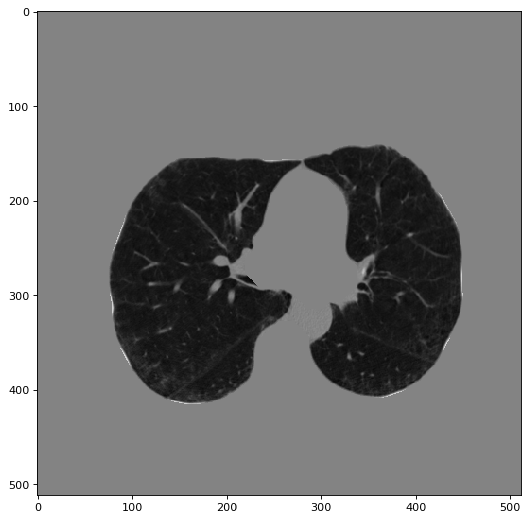

118


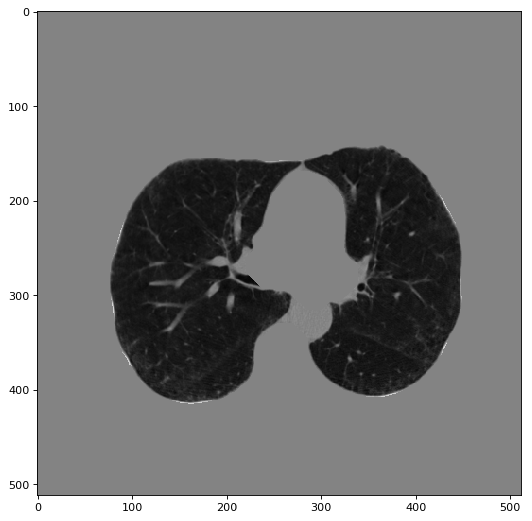

119


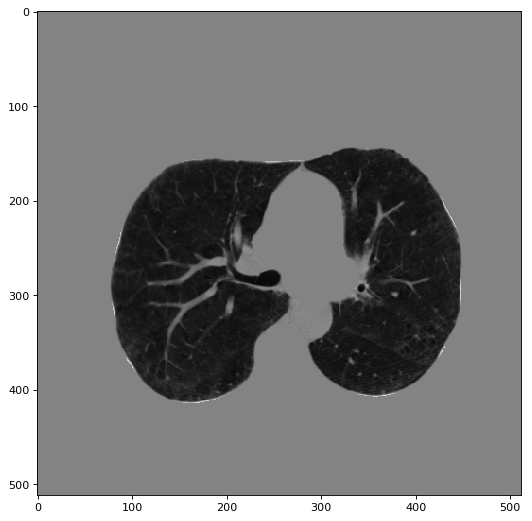

120


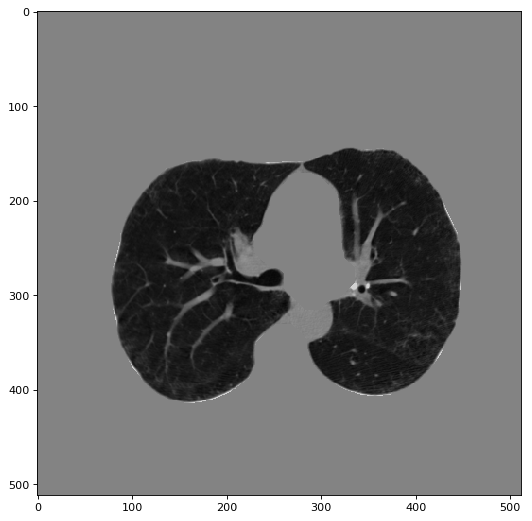

121


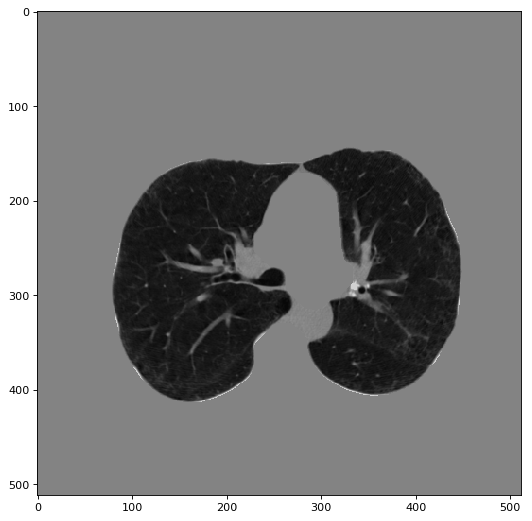

122


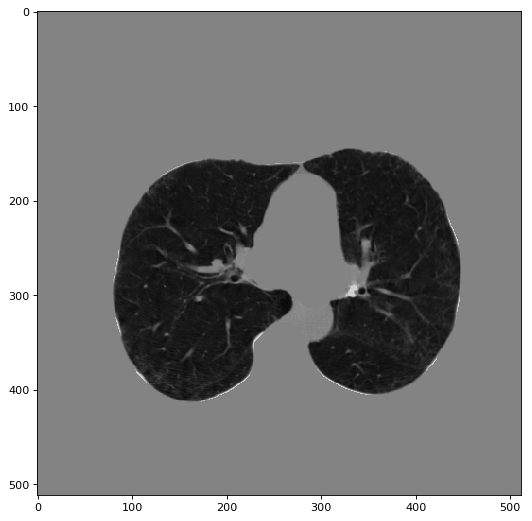

123


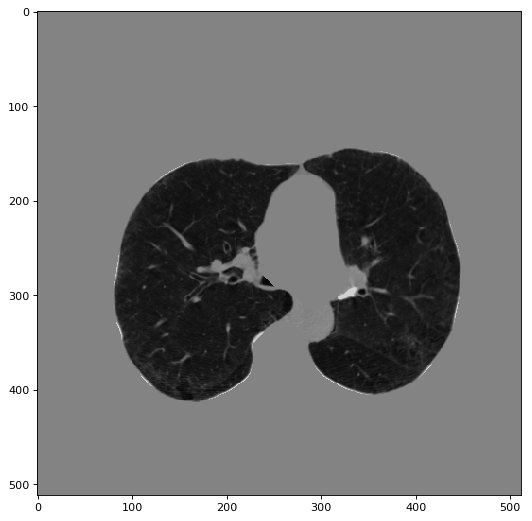

124


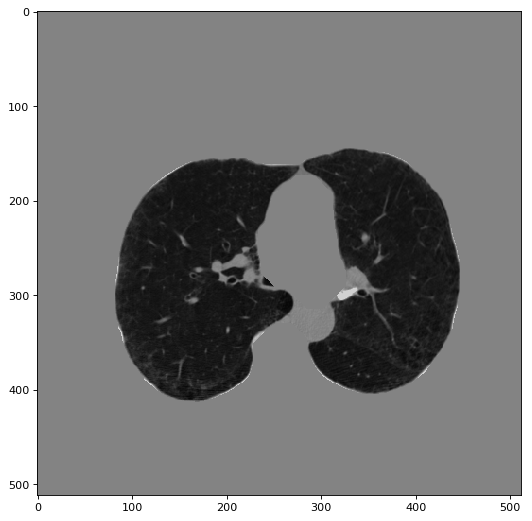

125


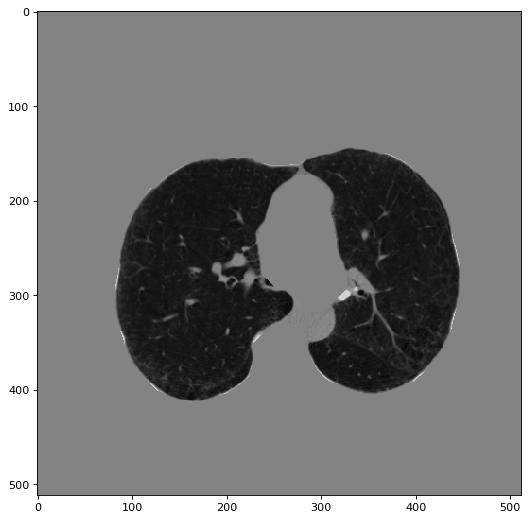

126


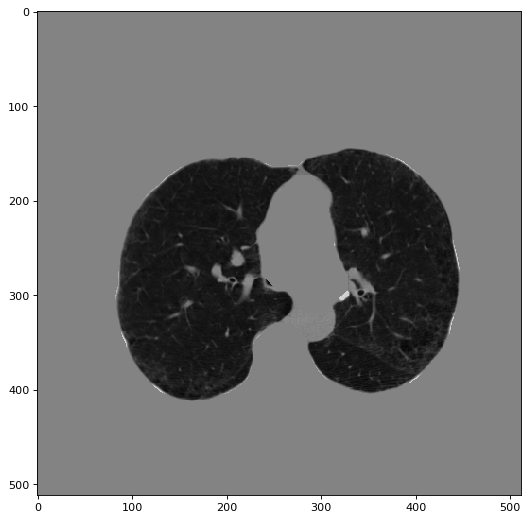

127


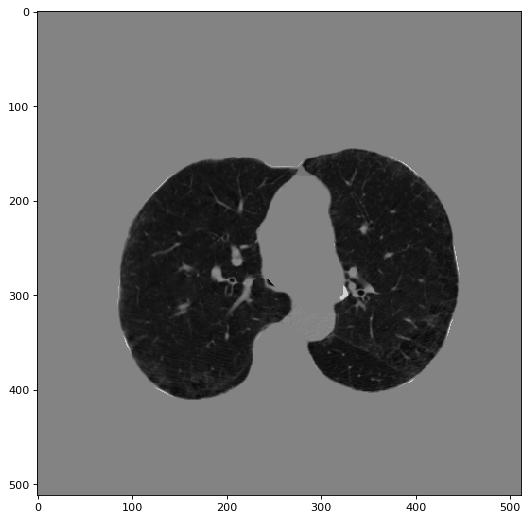

128


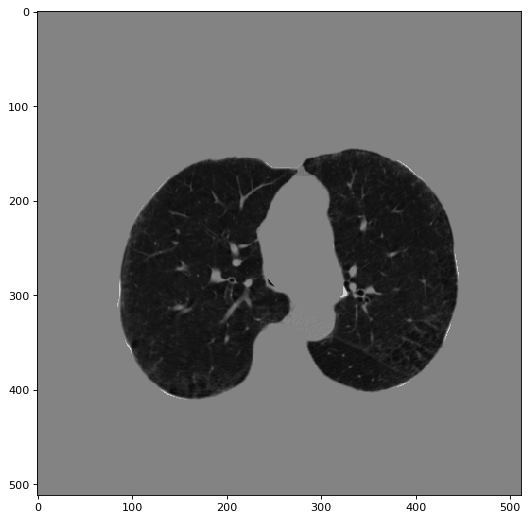

129


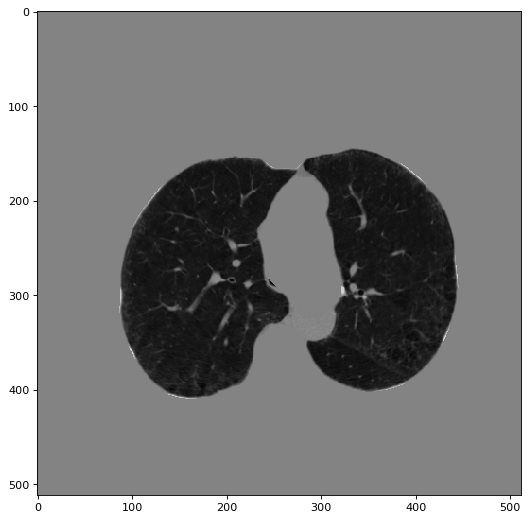

130


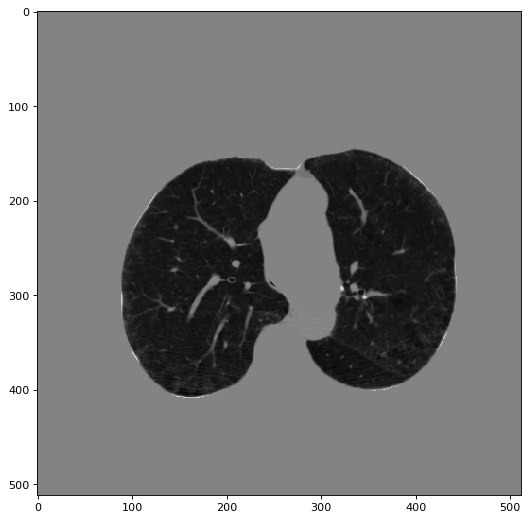

131


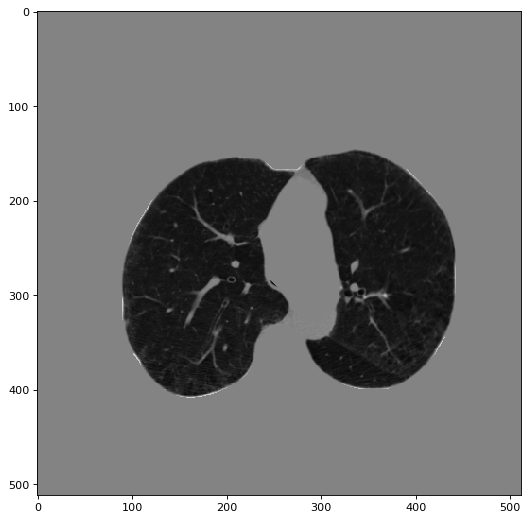

132


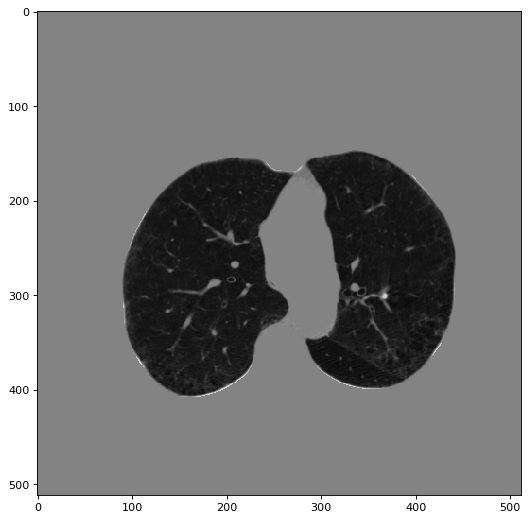

133


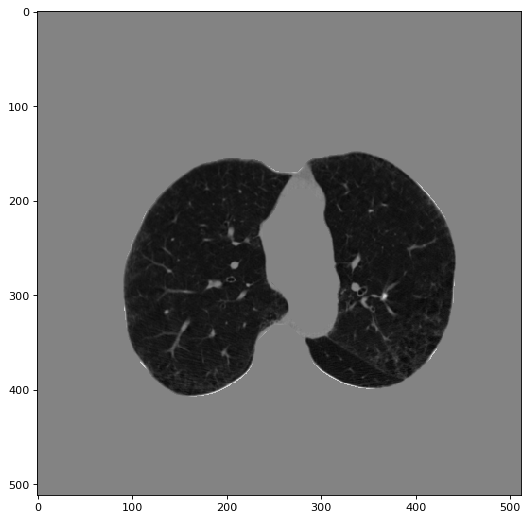

134


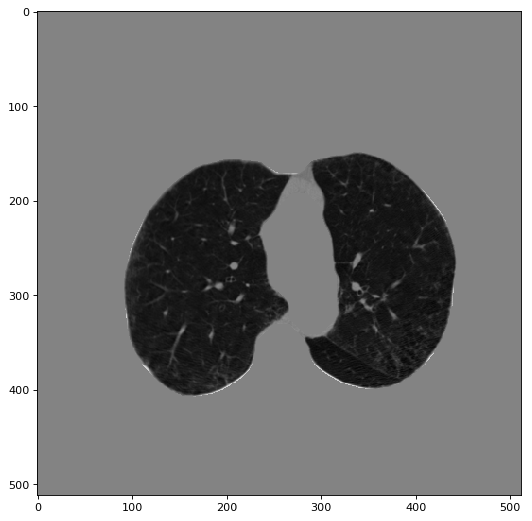

135


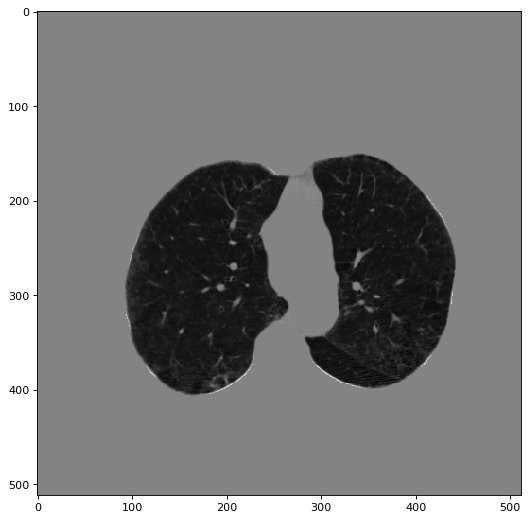

136


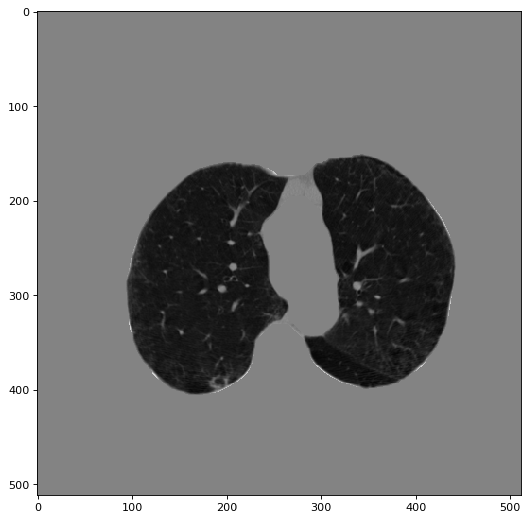

137


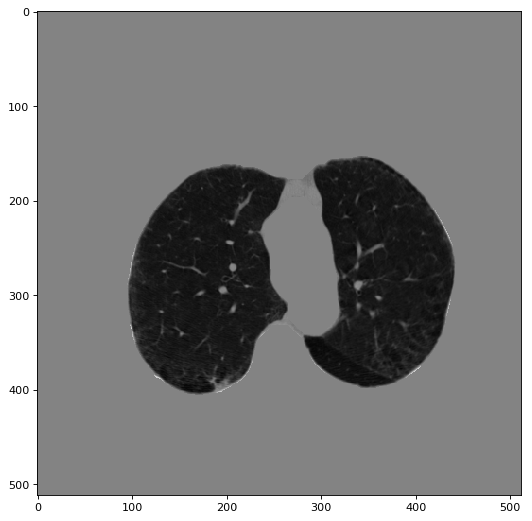

138


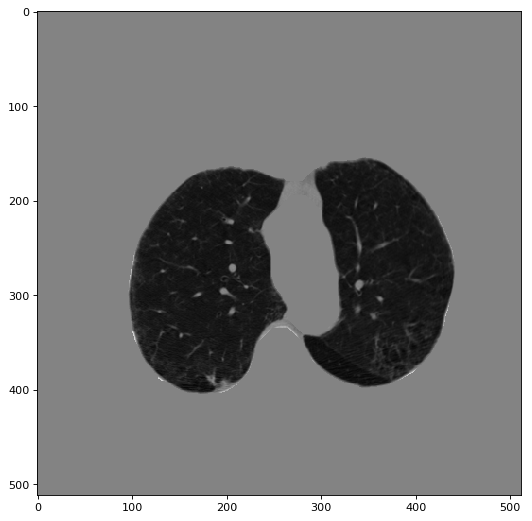

139


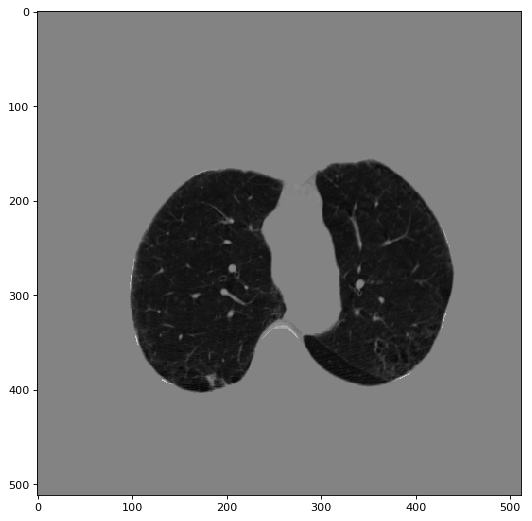

140


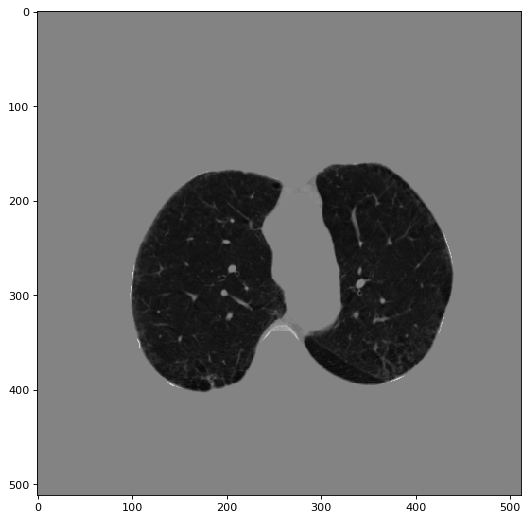

141


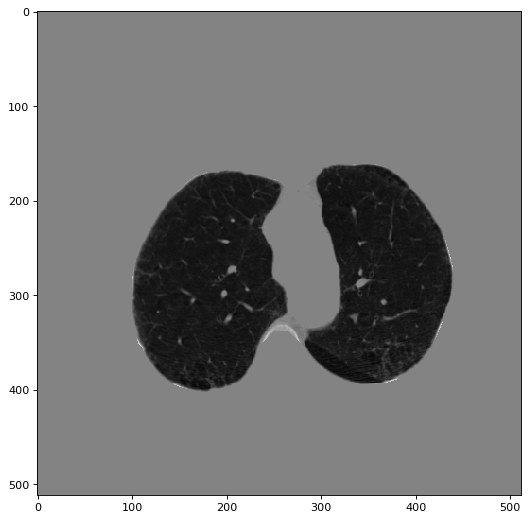

142


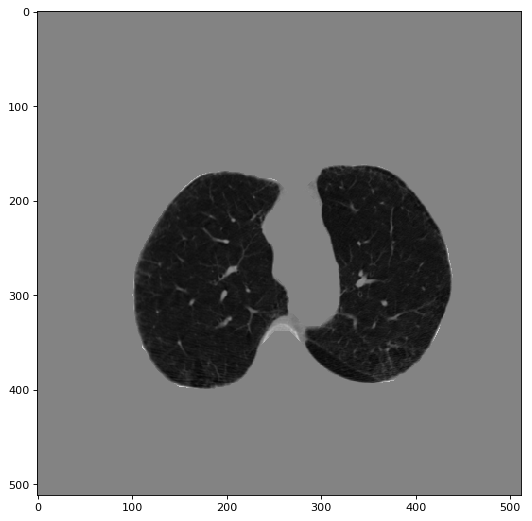

143


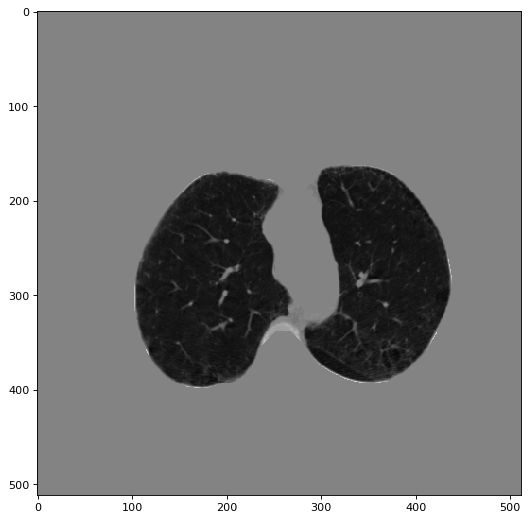

144


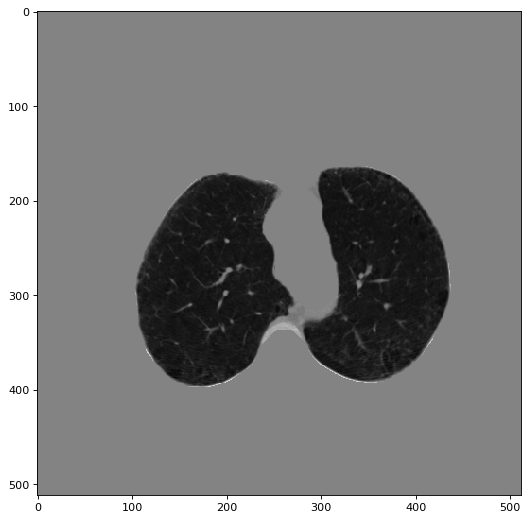

145


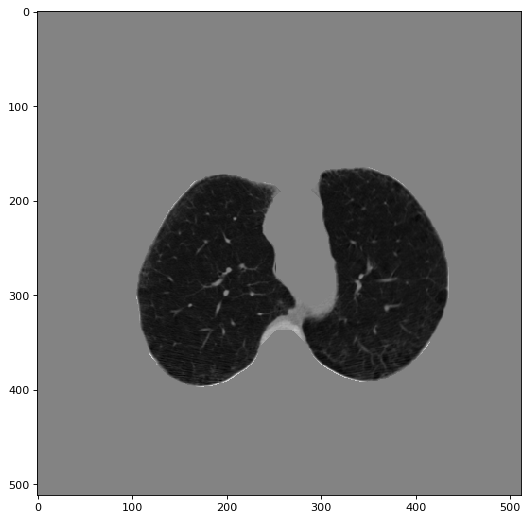

146


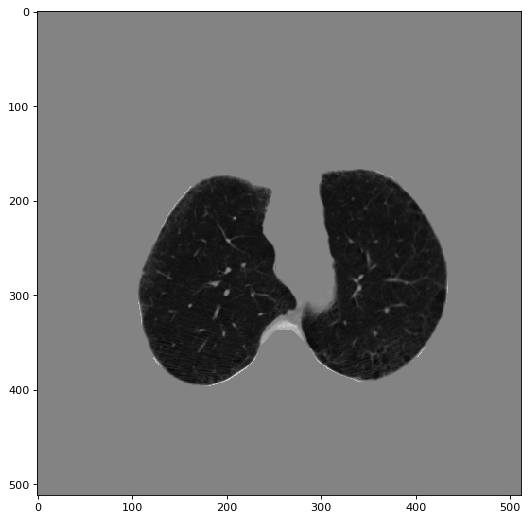

147


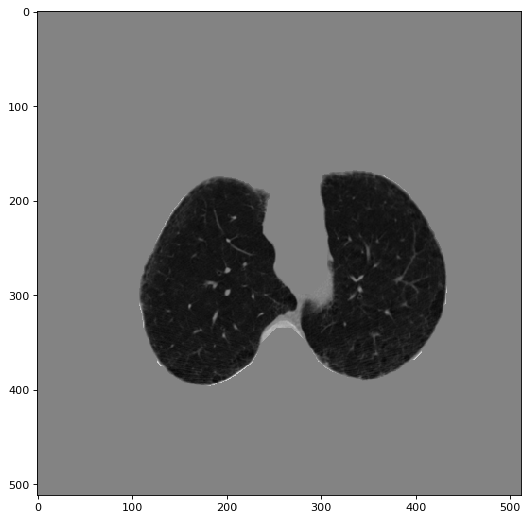

148


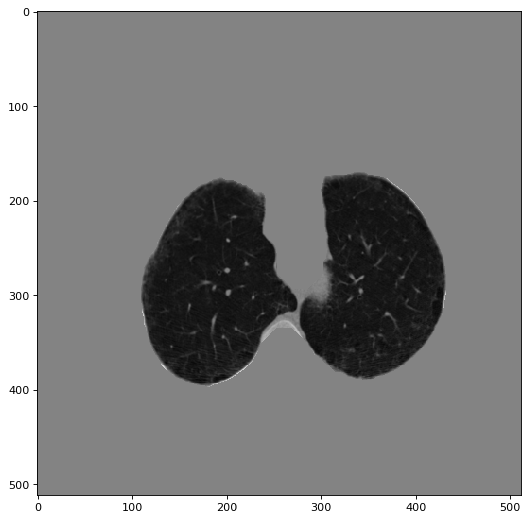

149


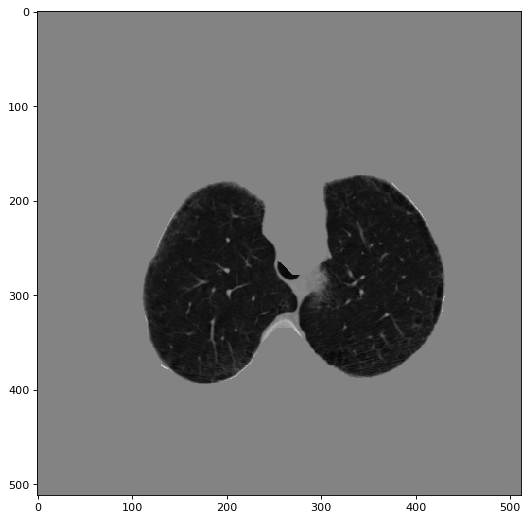

150


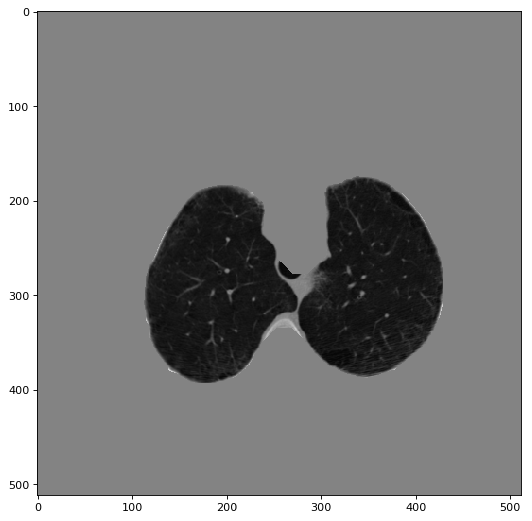

151


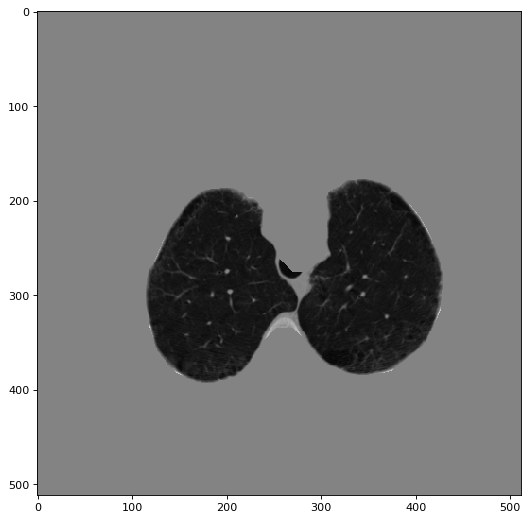

152


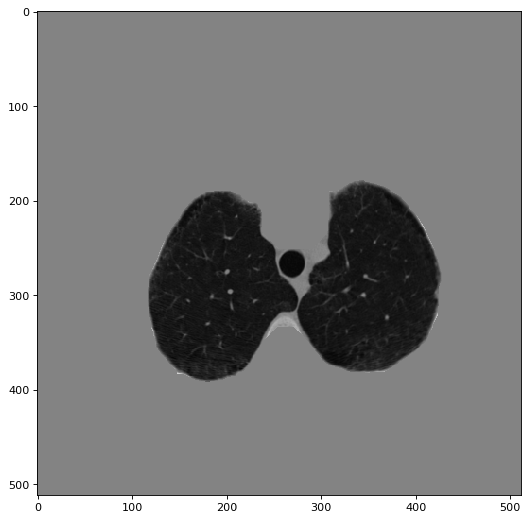

153


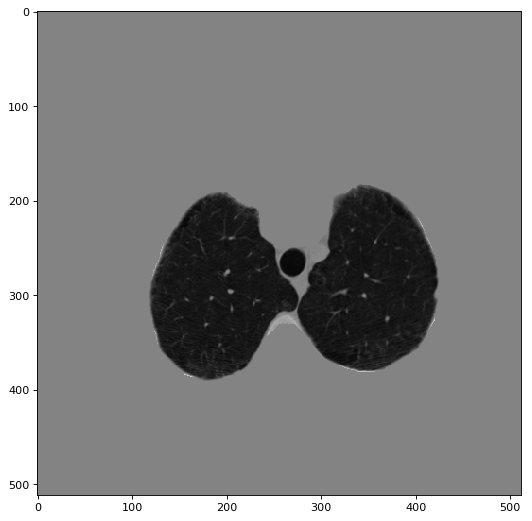

154


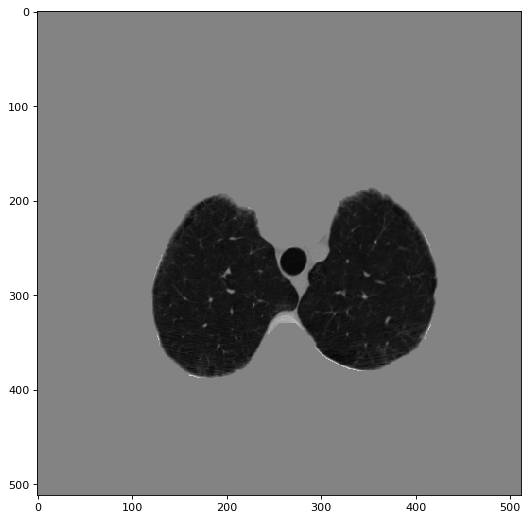

155


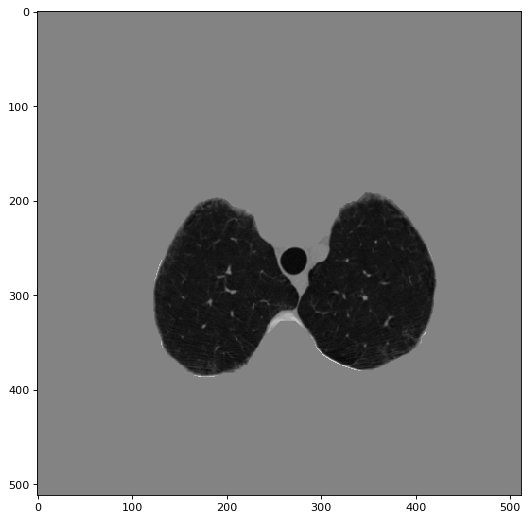

156


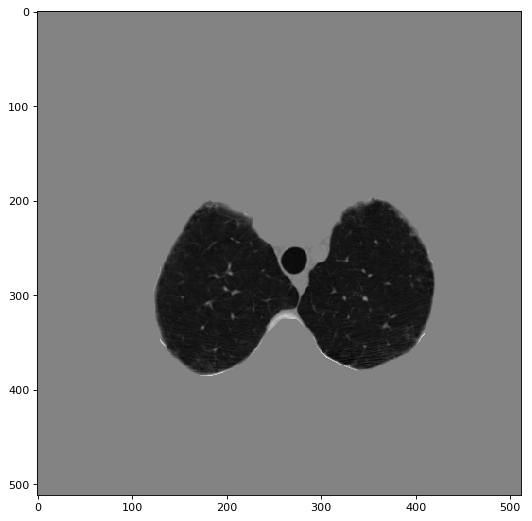

157


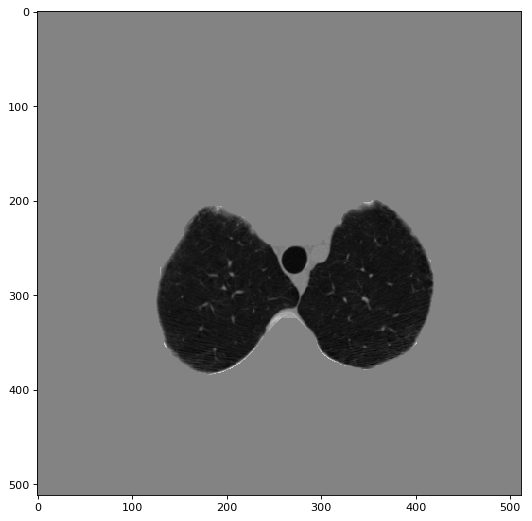

158


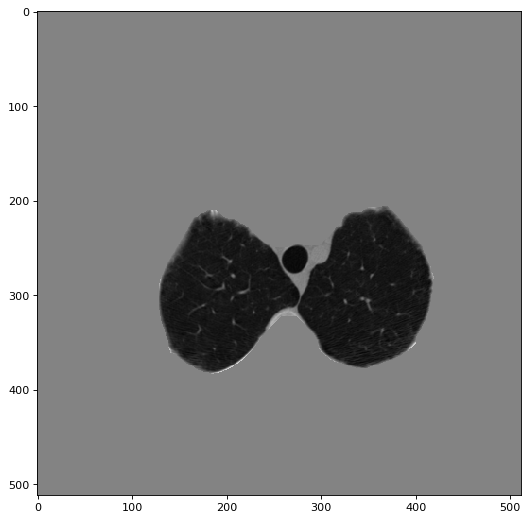

159


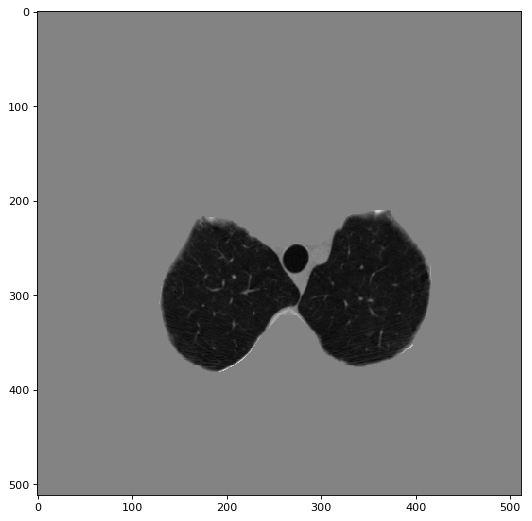

160


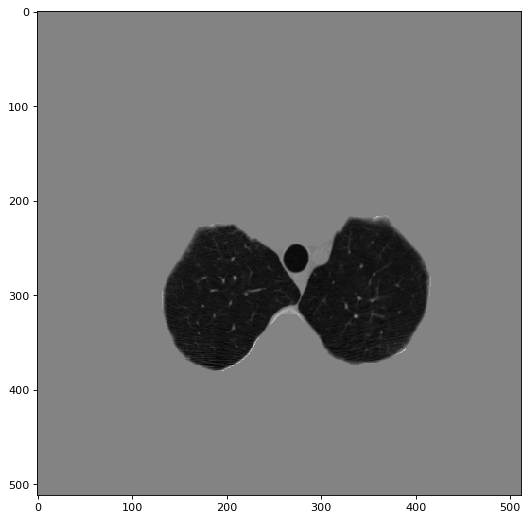

161


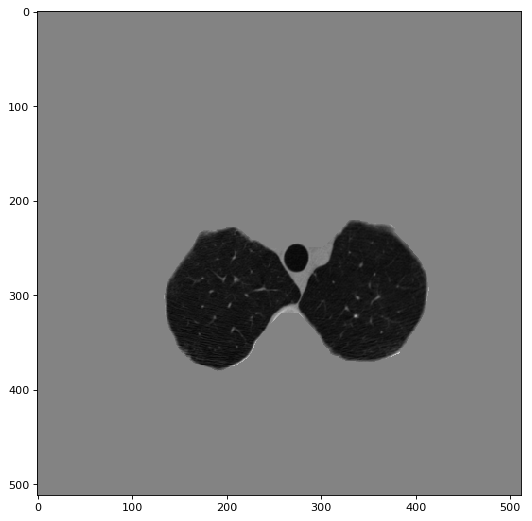

162


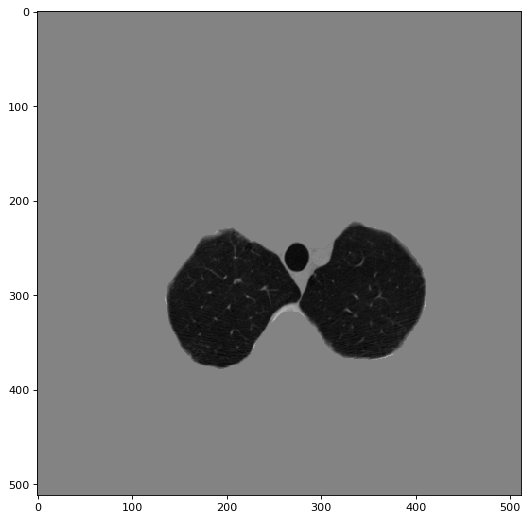

163


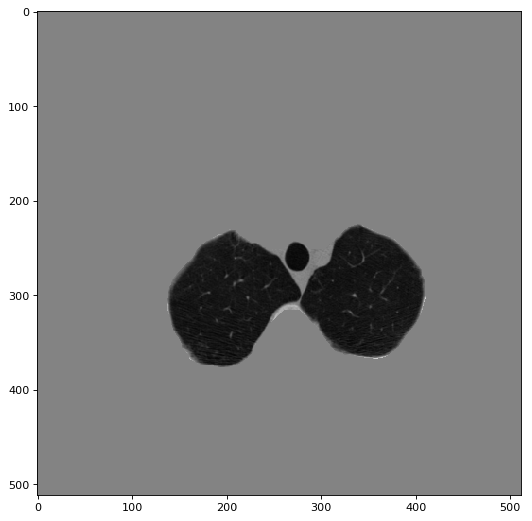

164


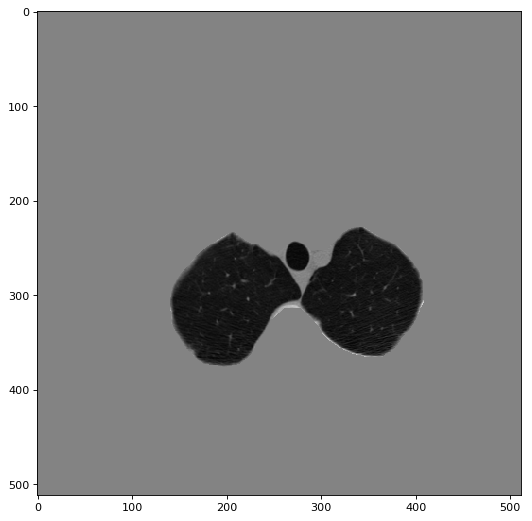

165


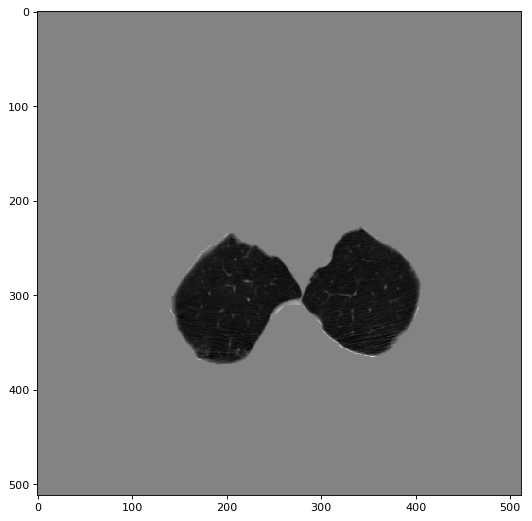

166


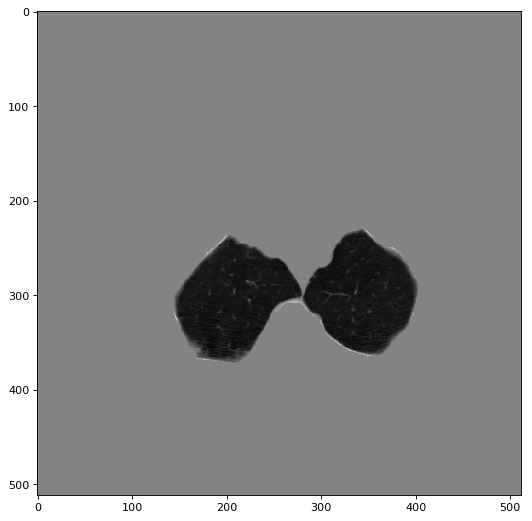

167


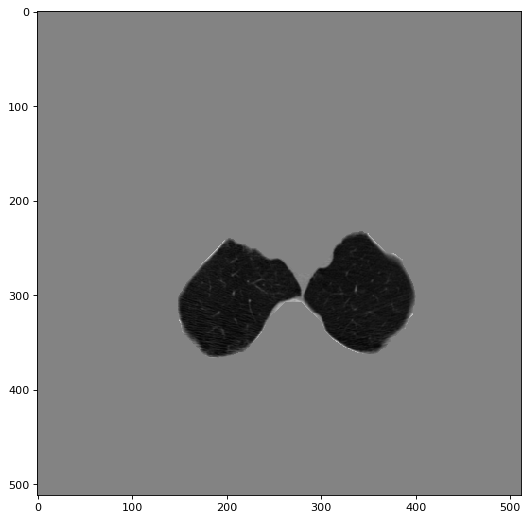

168


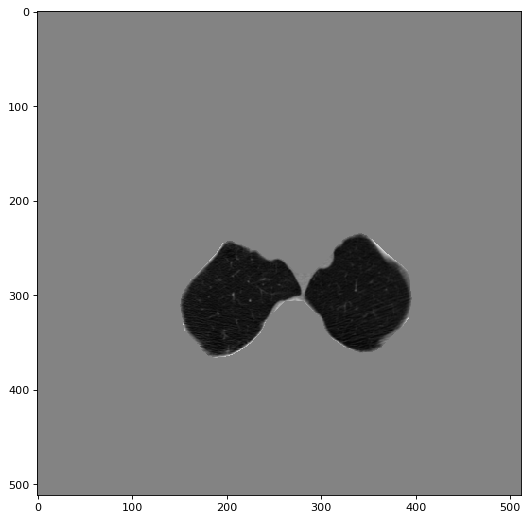

169


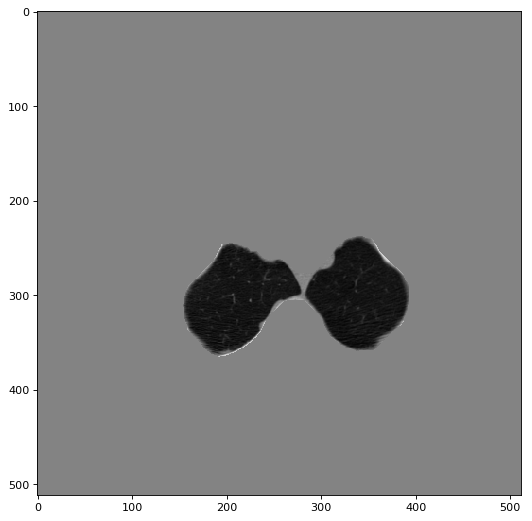

170


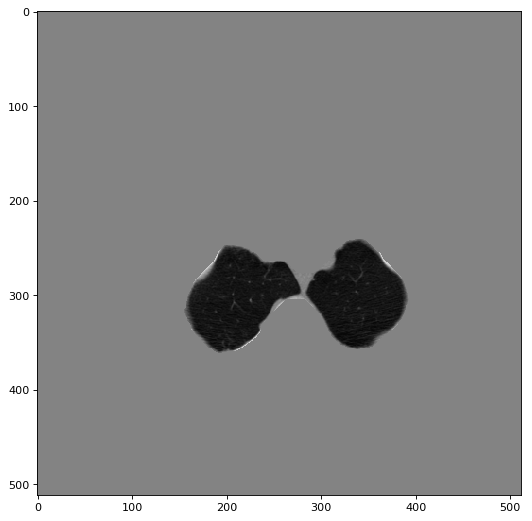

171


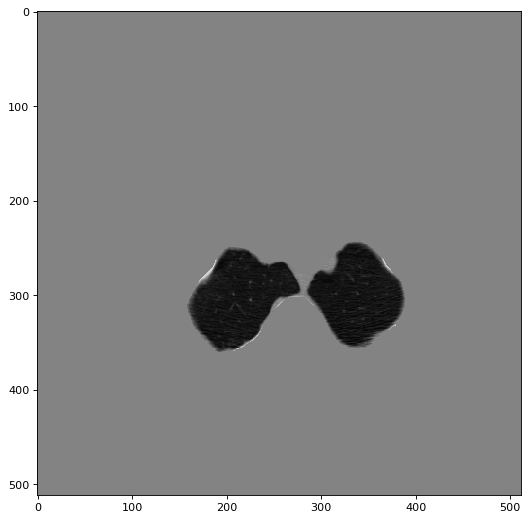

172


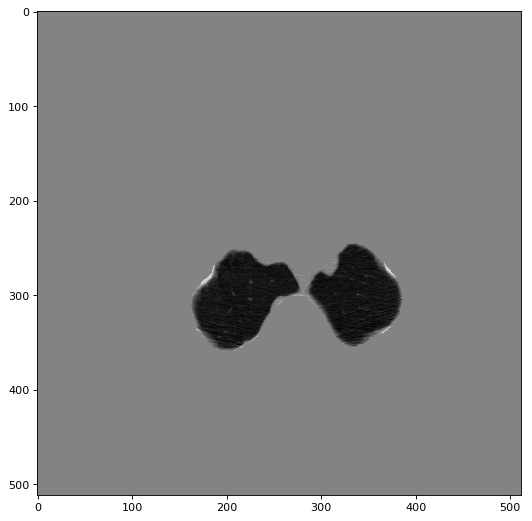

173


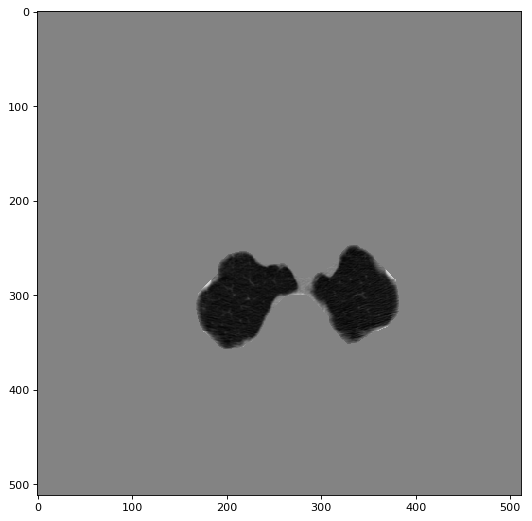

174


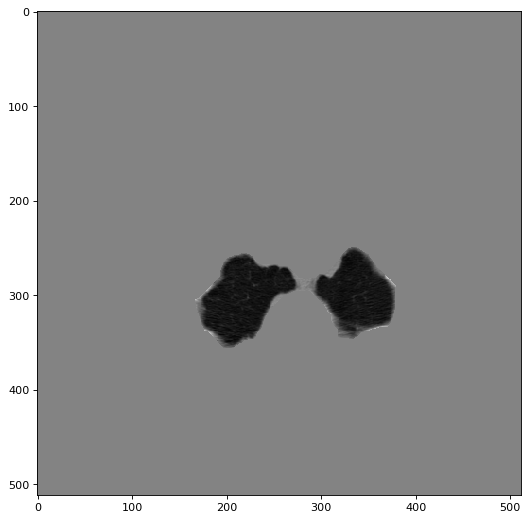

175


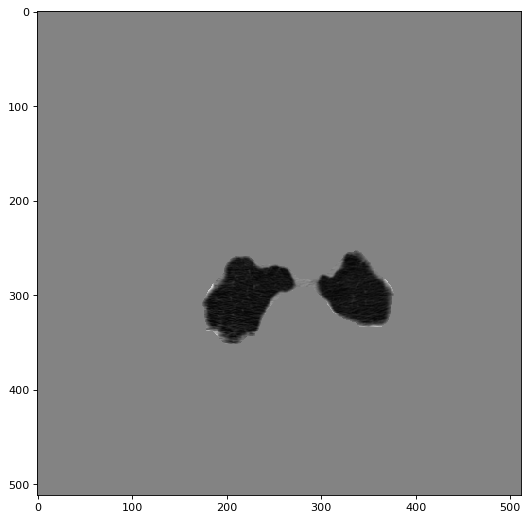

176


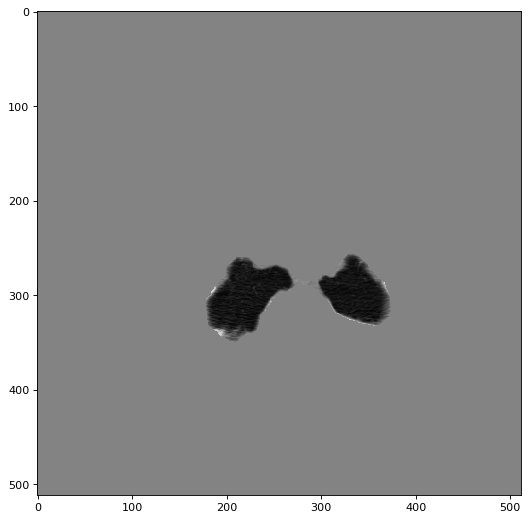

177


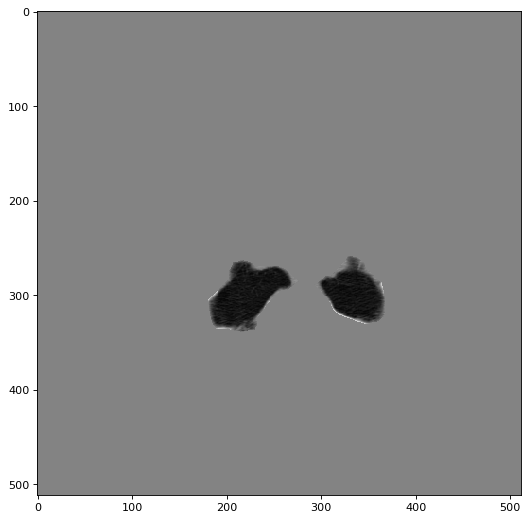

178


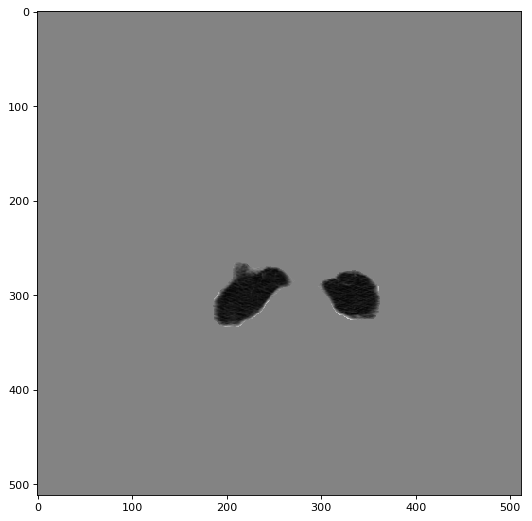

179


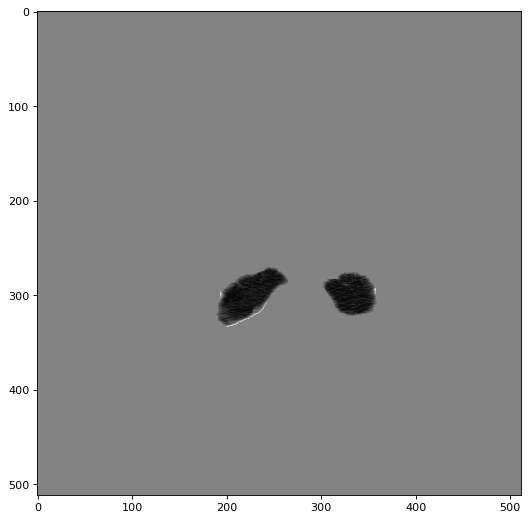

180


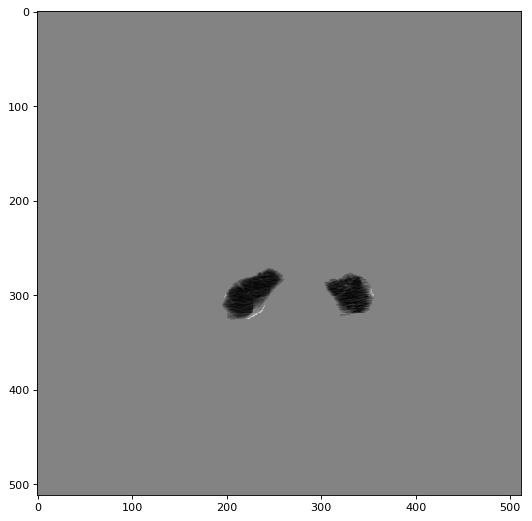

181


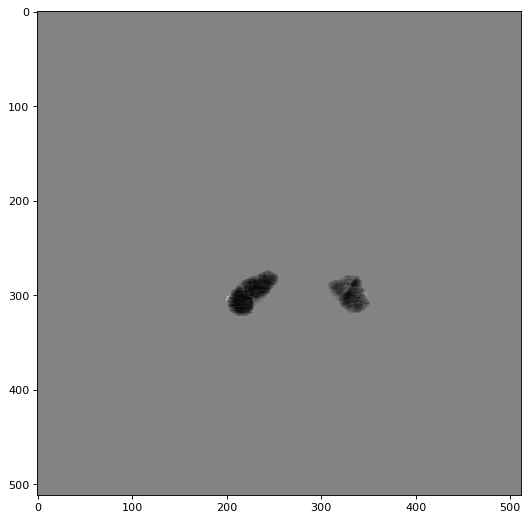

182


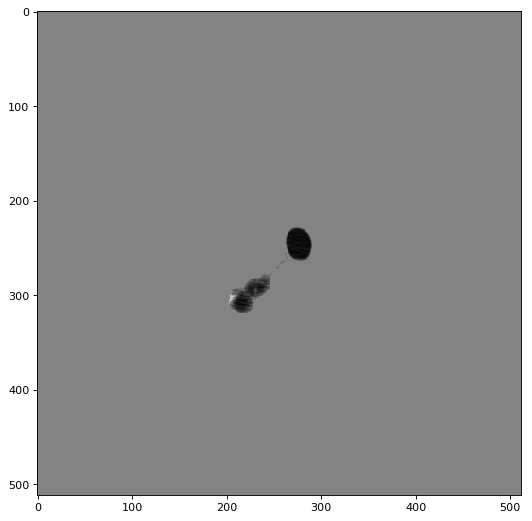

183


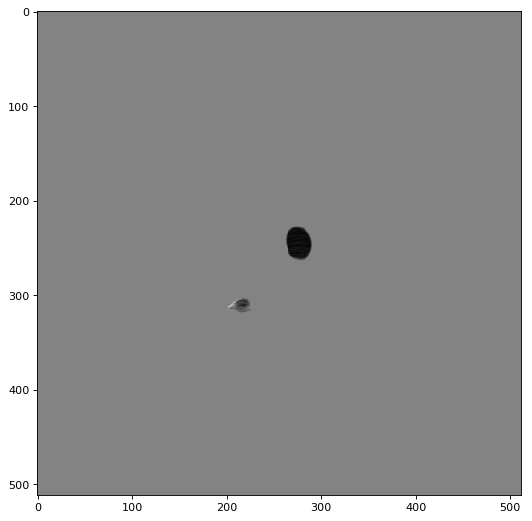

184


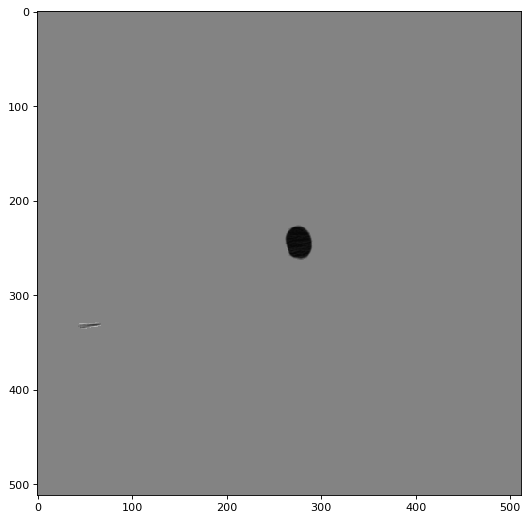

185


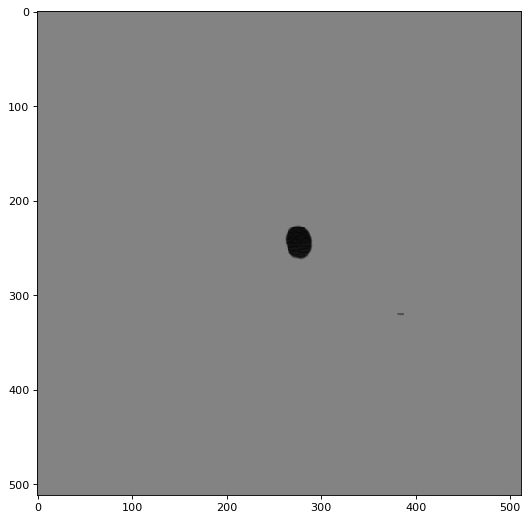

186


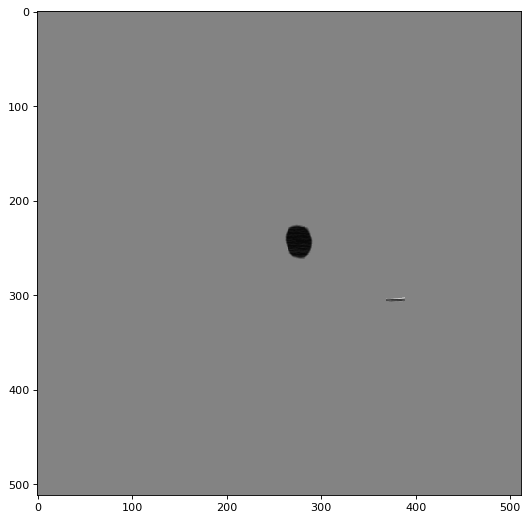

187


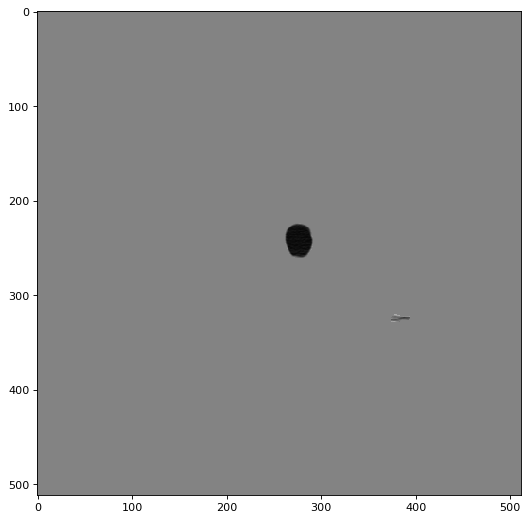

188


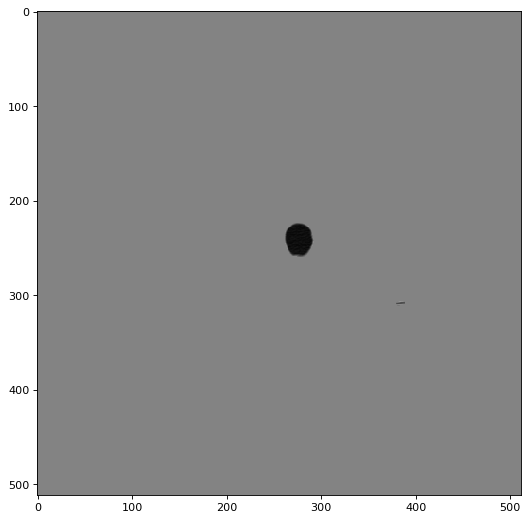

189


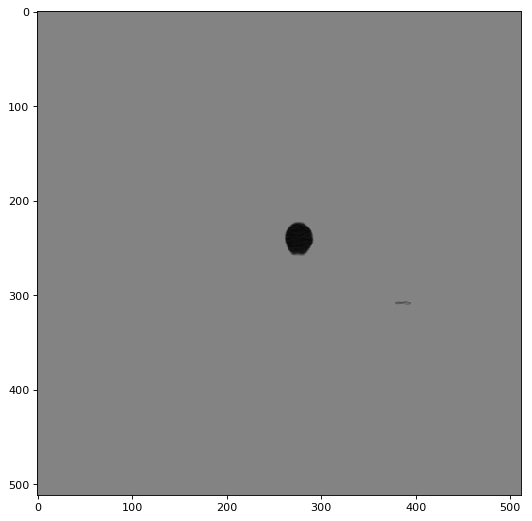

190


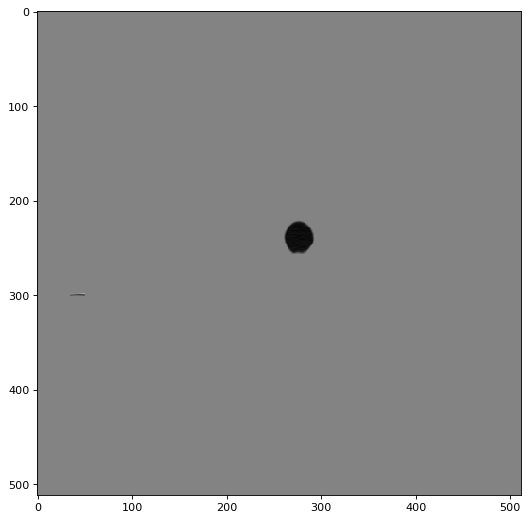

191


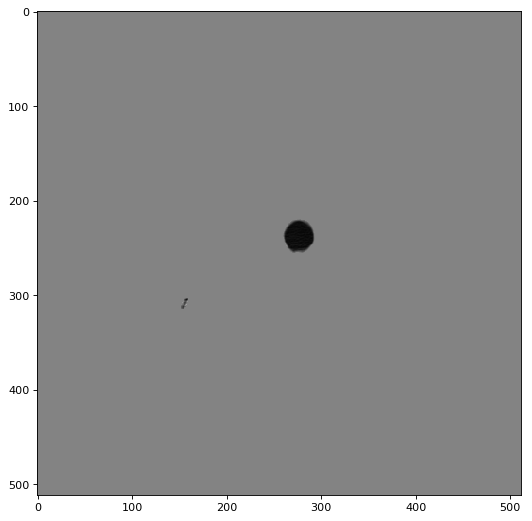

192


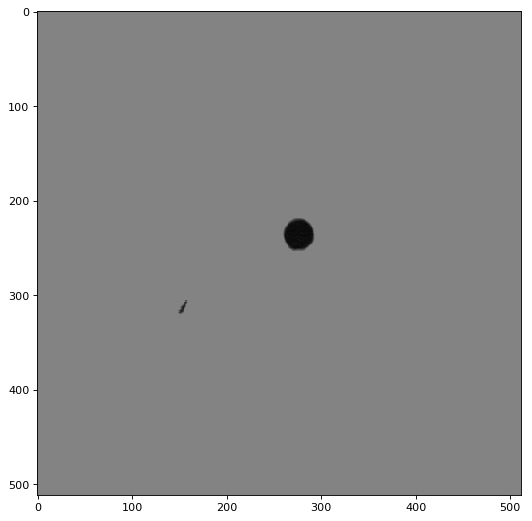

193


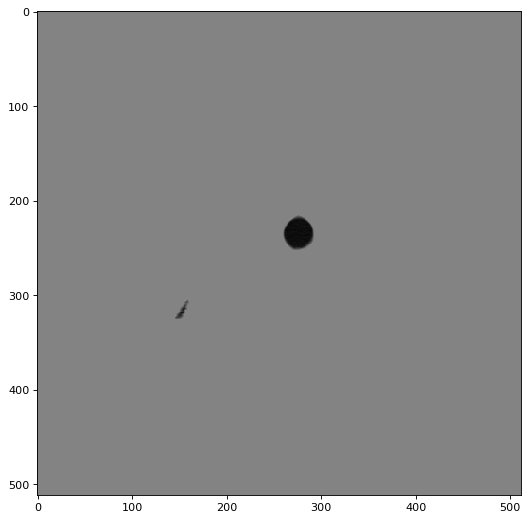

194


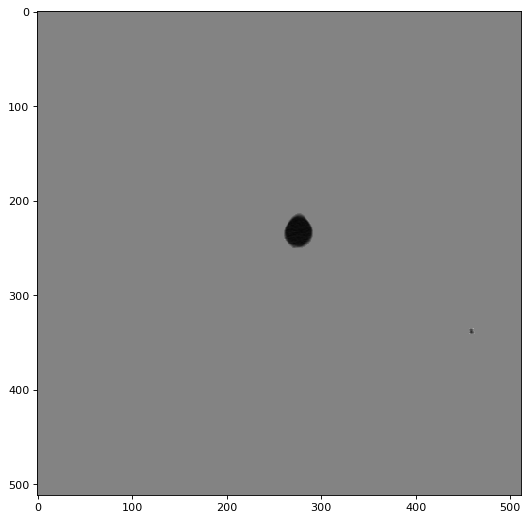

195


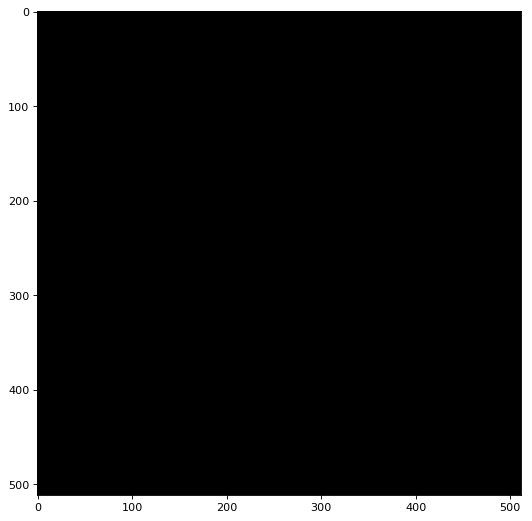

196


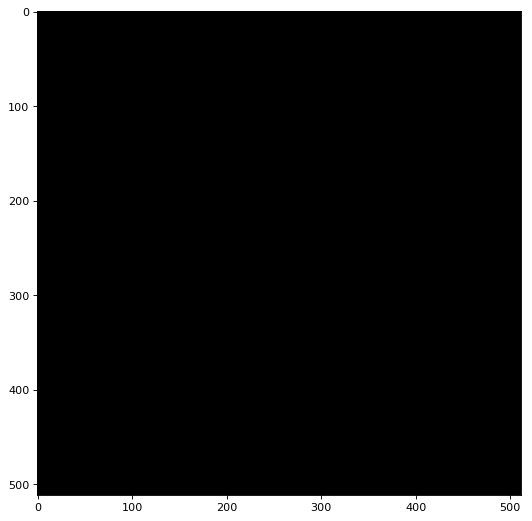

197


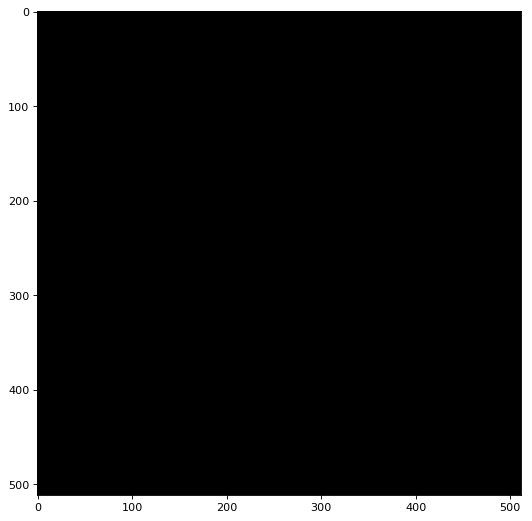

198


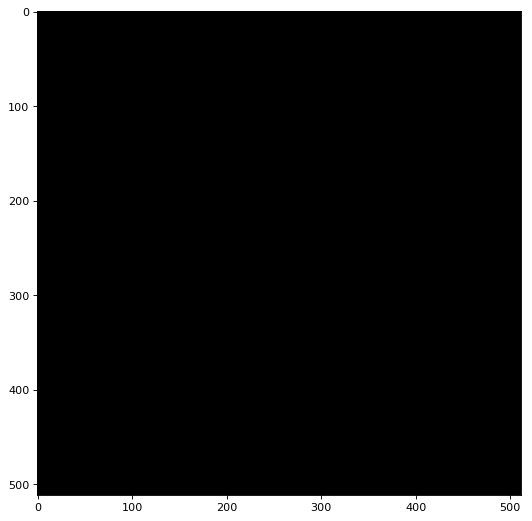

199


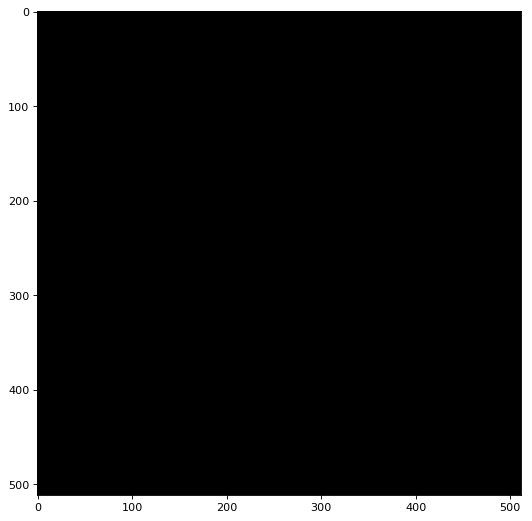

200


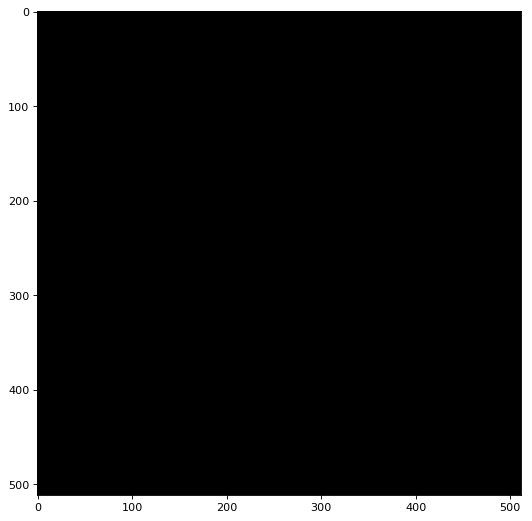

201


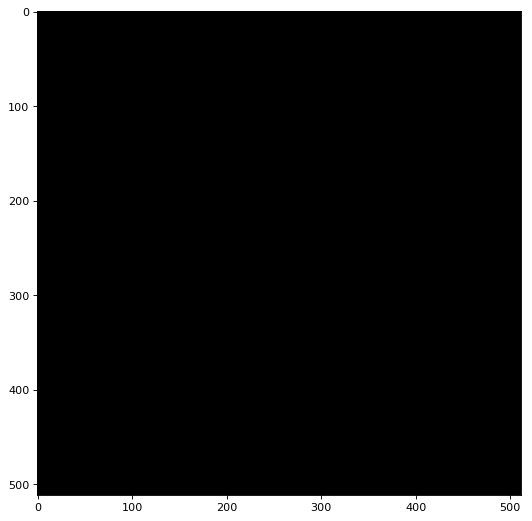

202


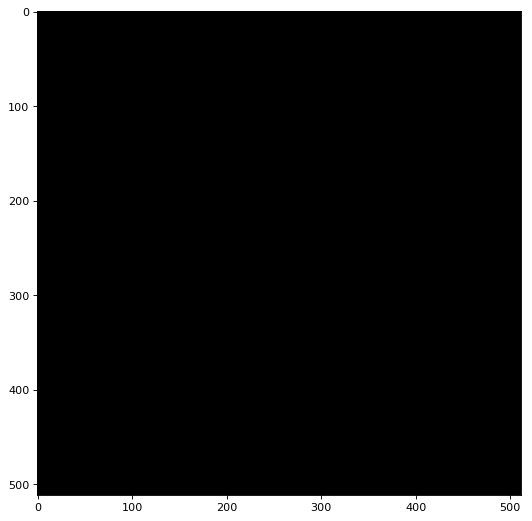

203


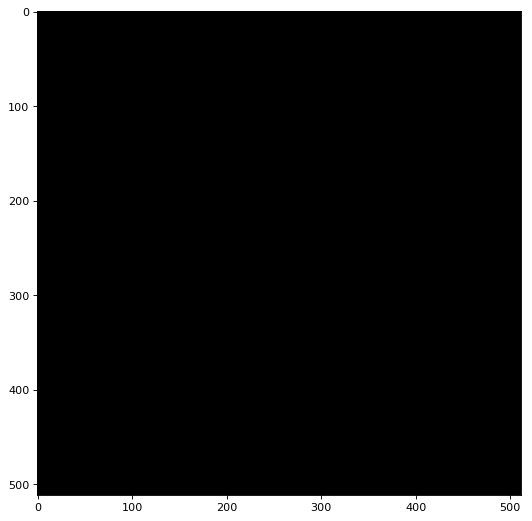

204


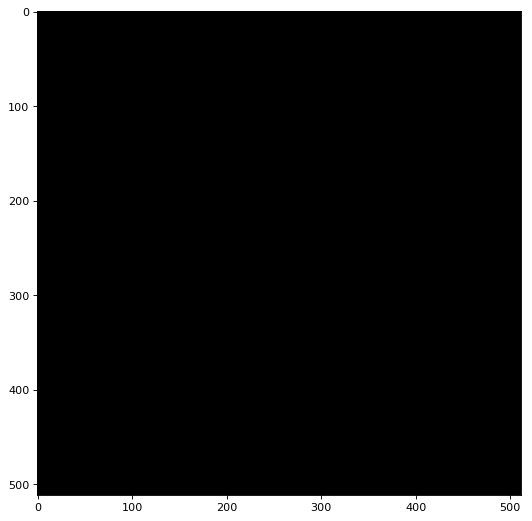

205


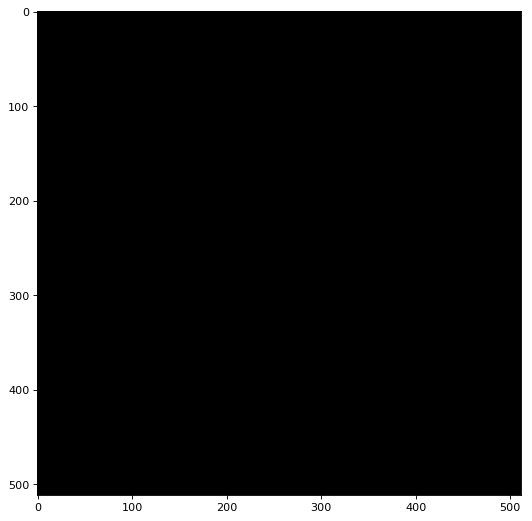

206


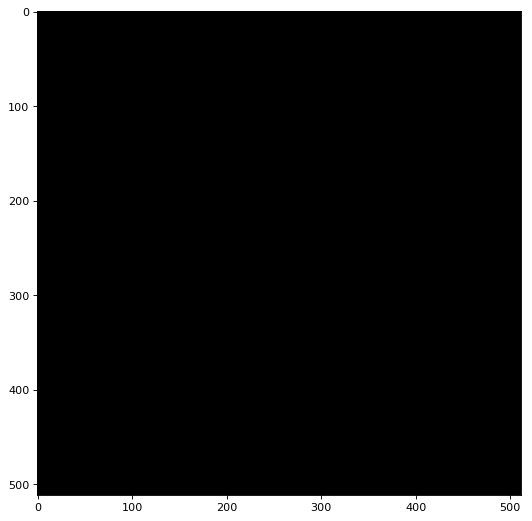

207


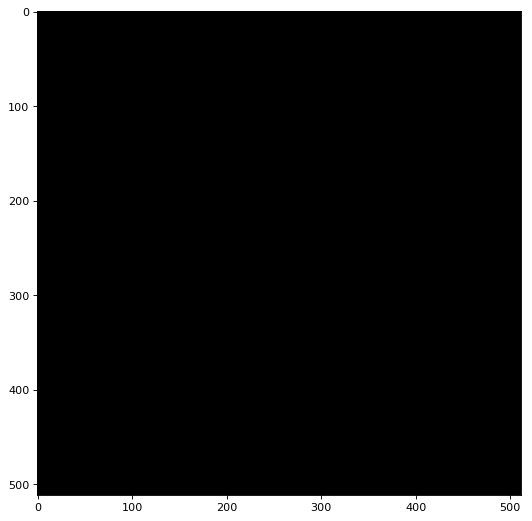

208


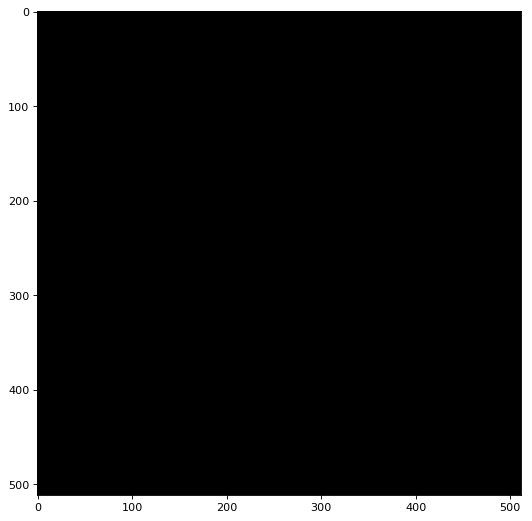

209


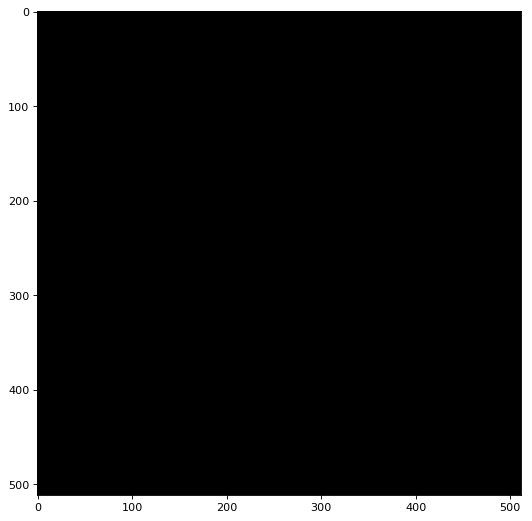

210


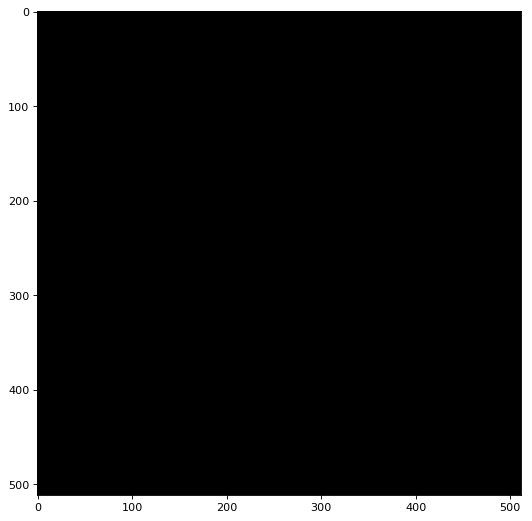

211


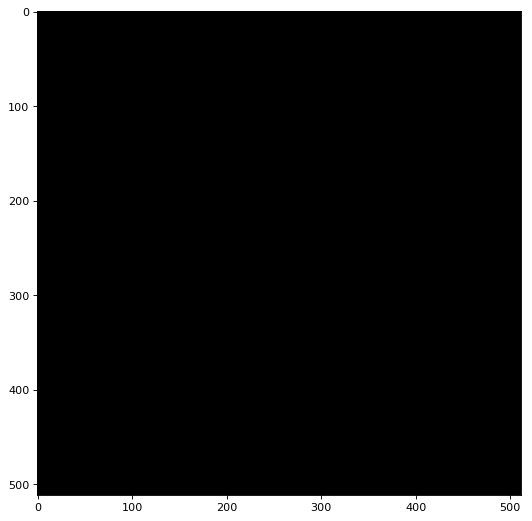

212


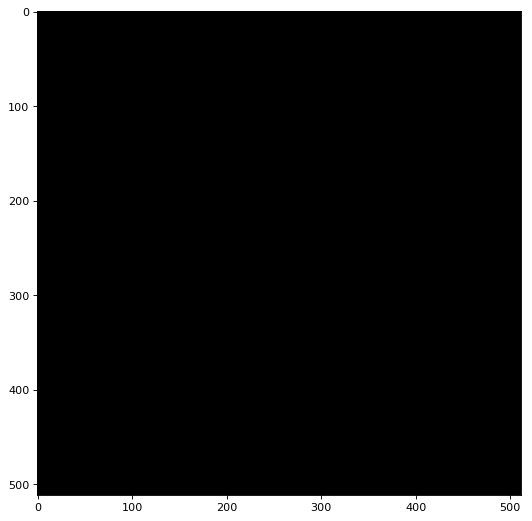

213


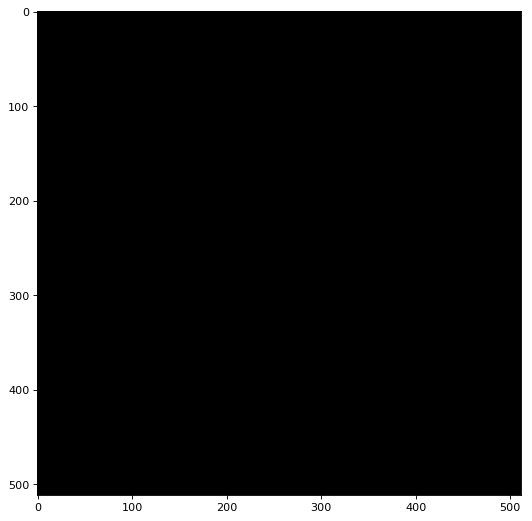

214


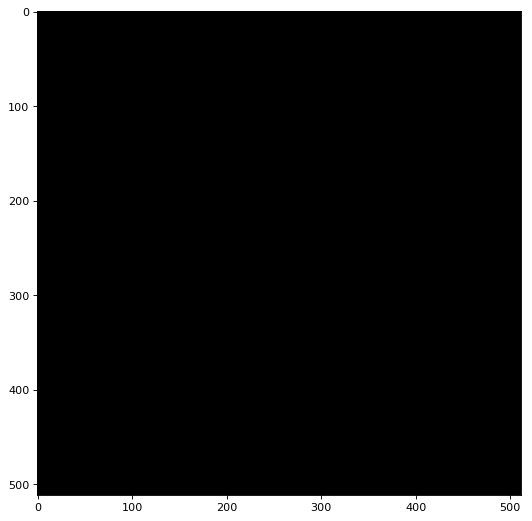

215


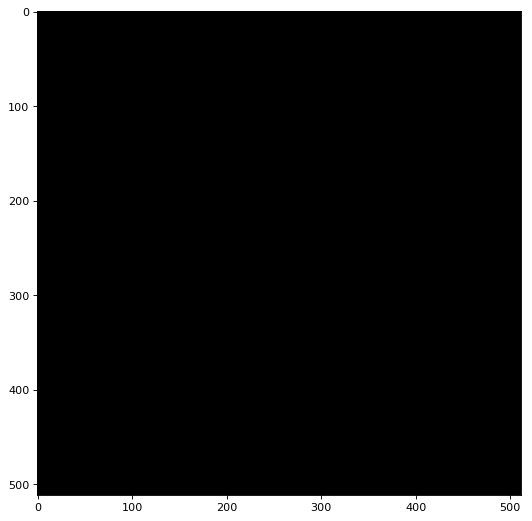

216


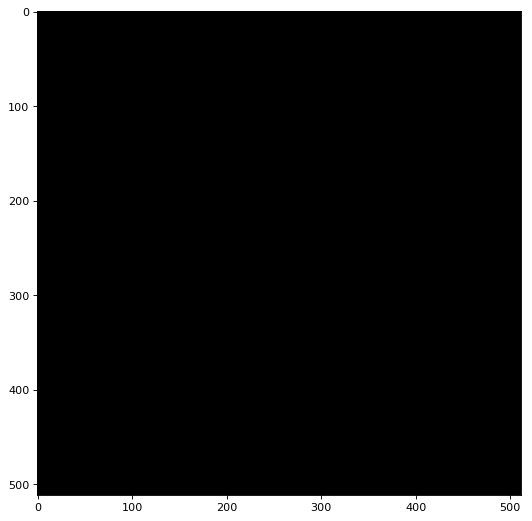

217


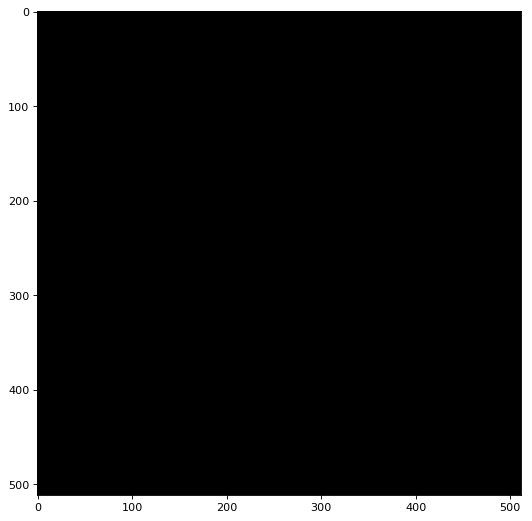

218


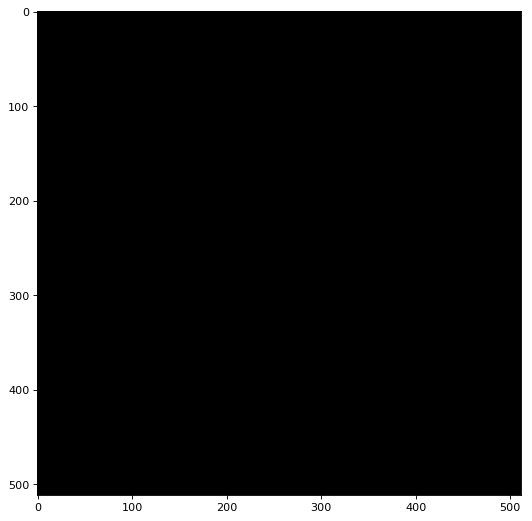

219


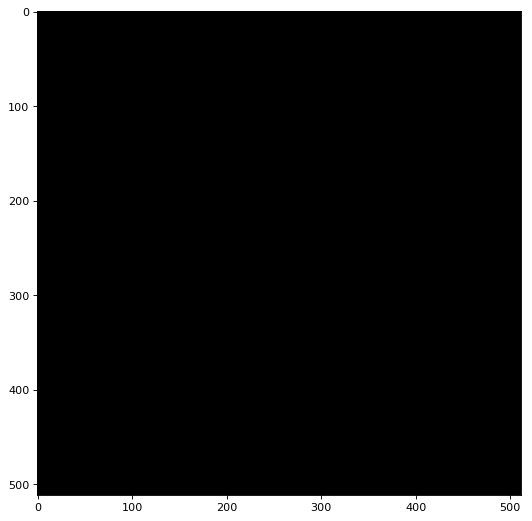

220


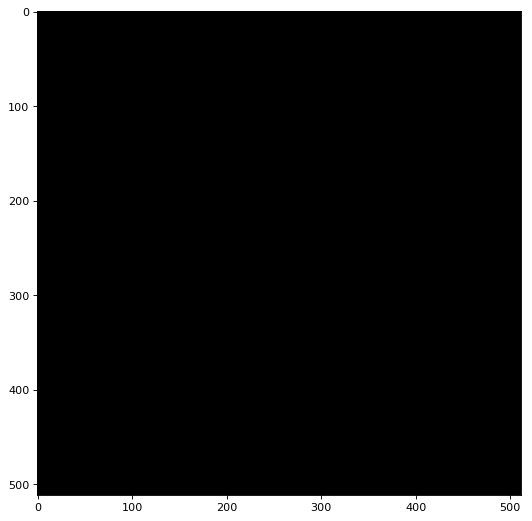

221


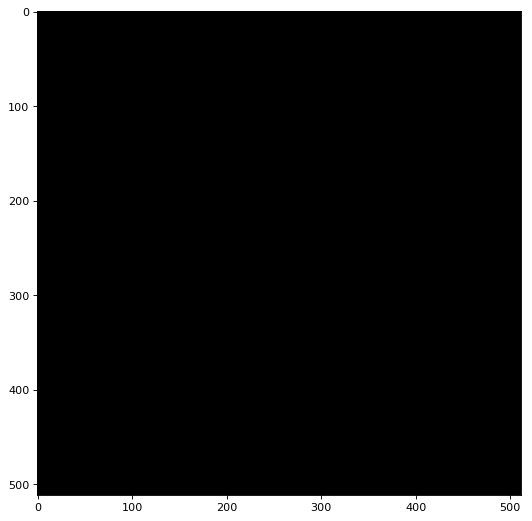

222


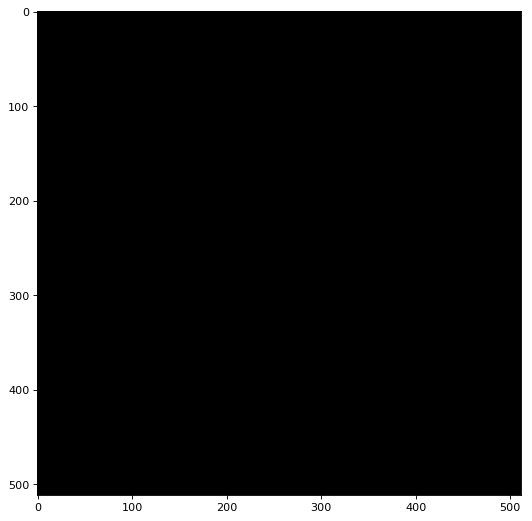

223


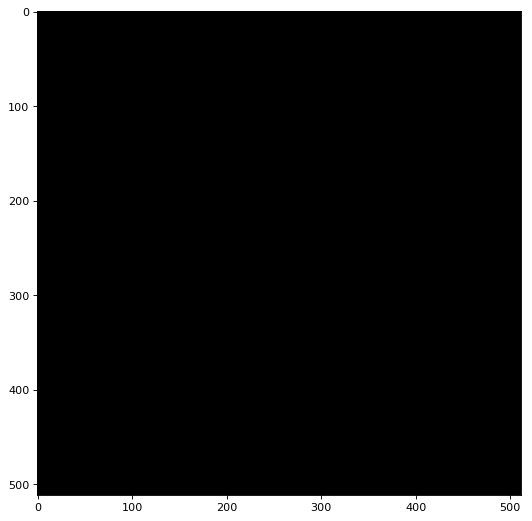

224


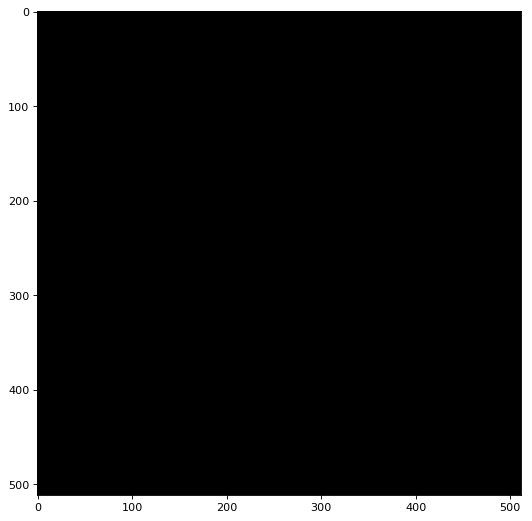

225


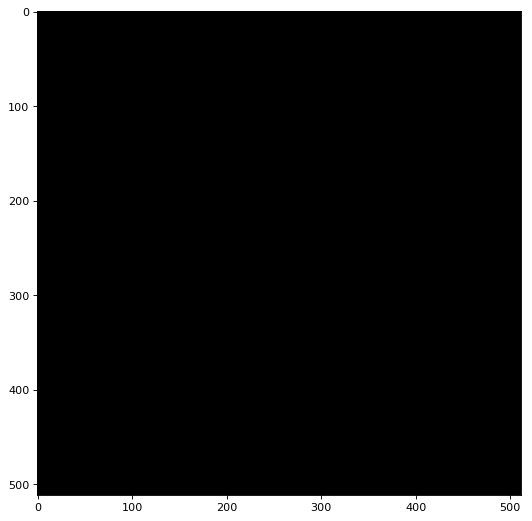

226


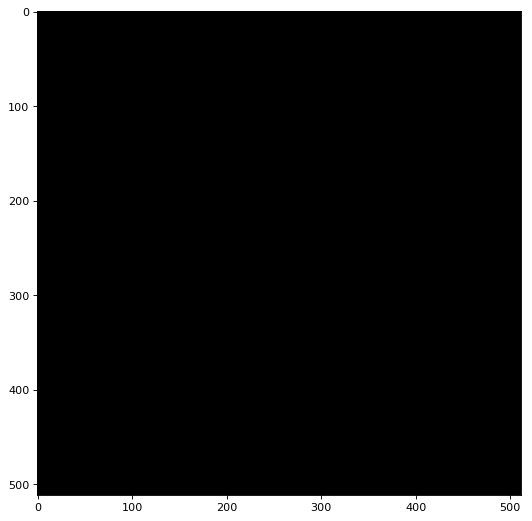

227


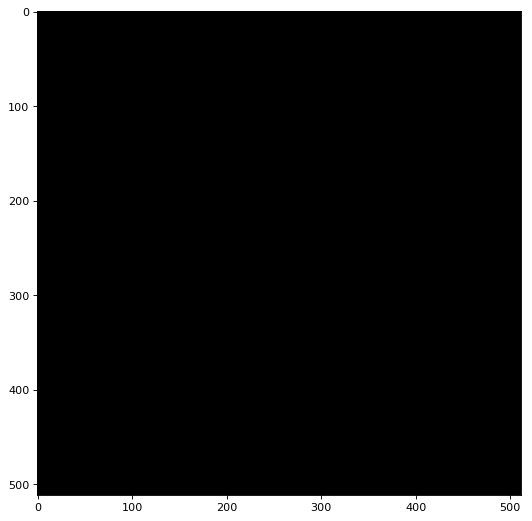

228


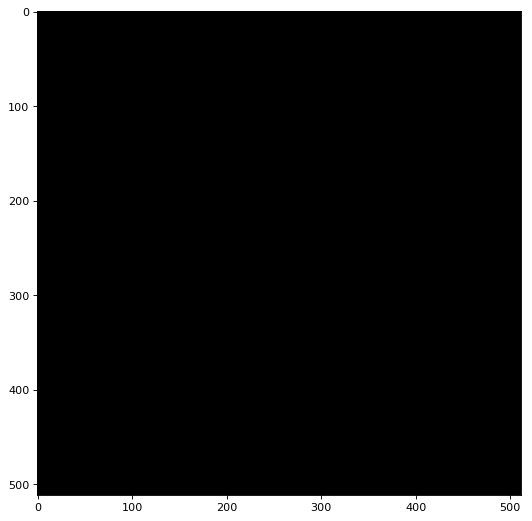

229


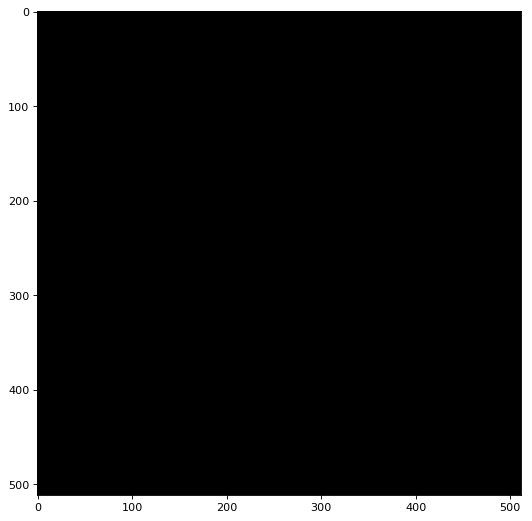

230


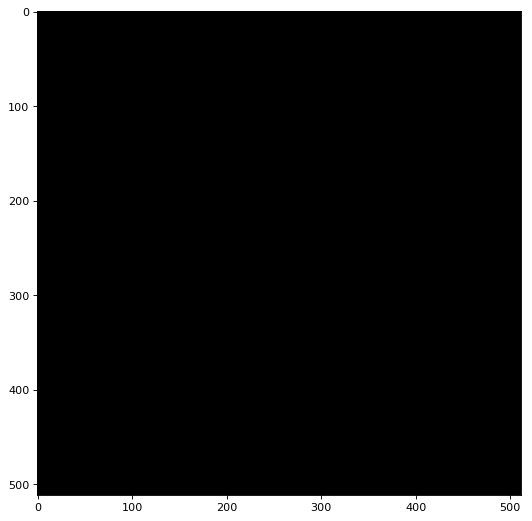

231


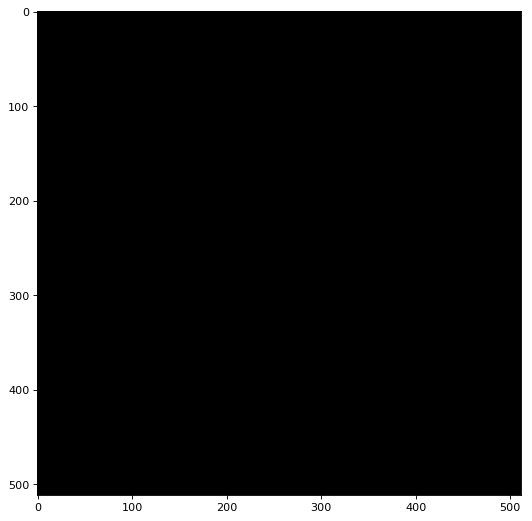

232


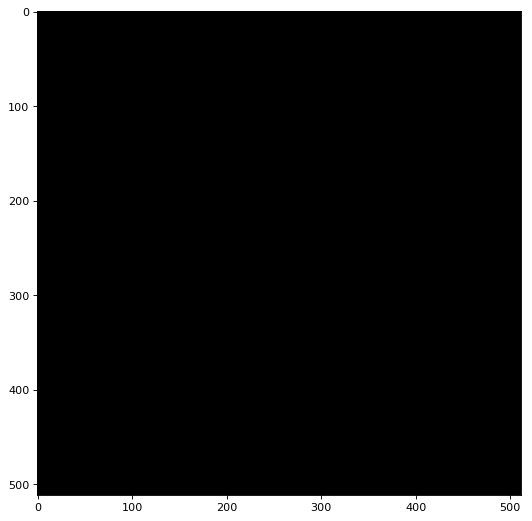

233


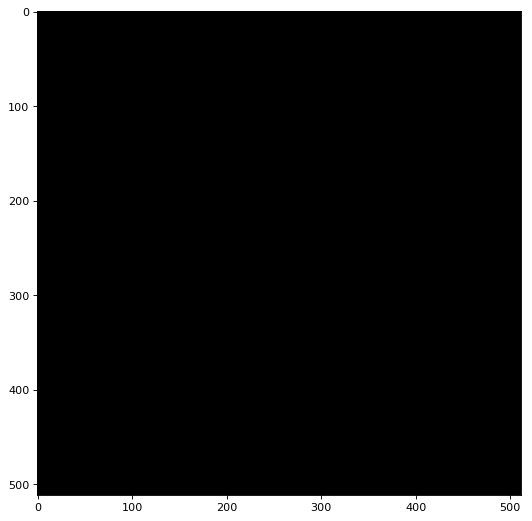

234


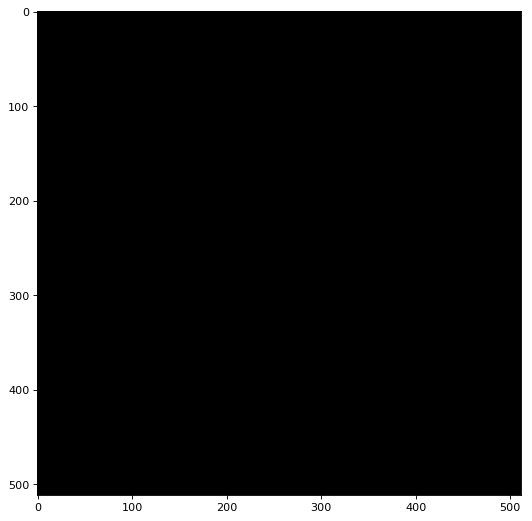

235


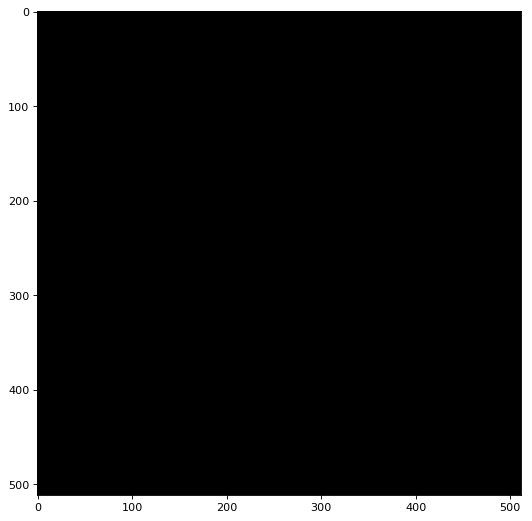

236


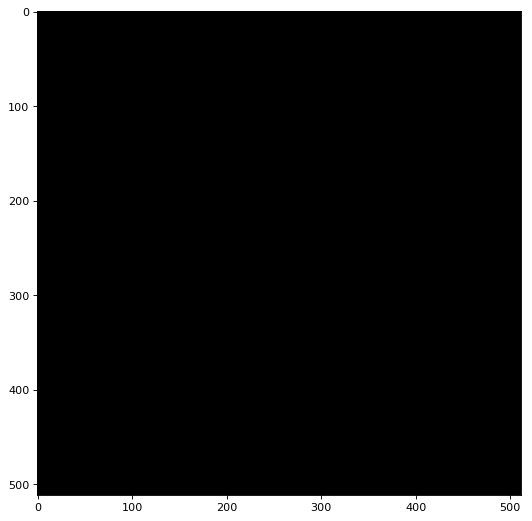

237


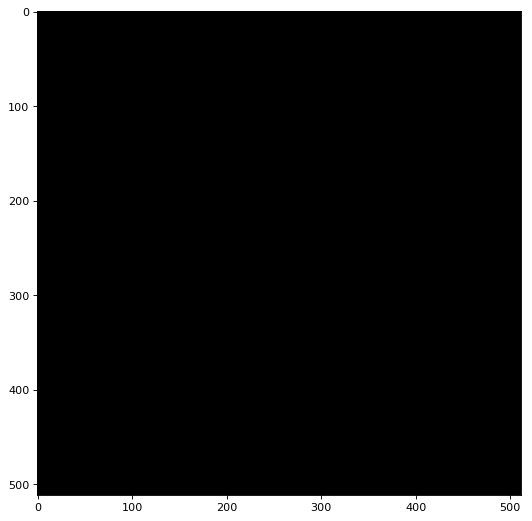

238


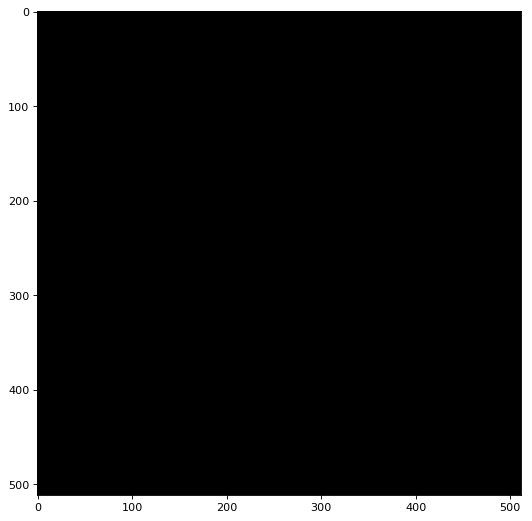

239


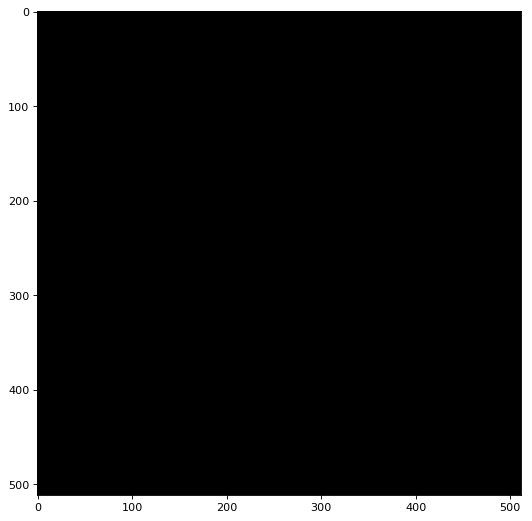

240


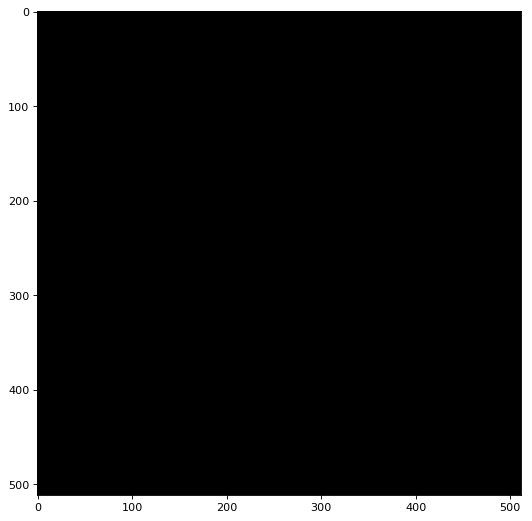

241


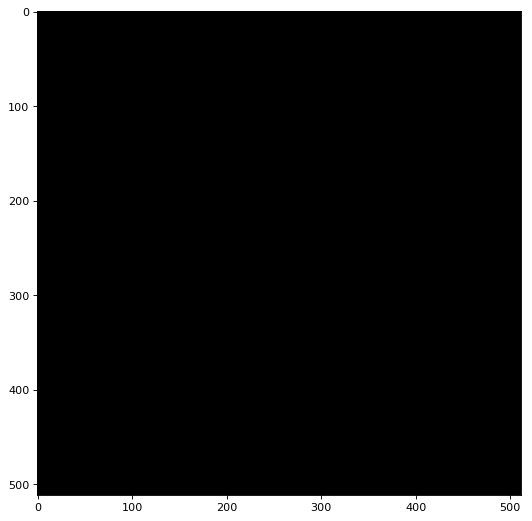

242


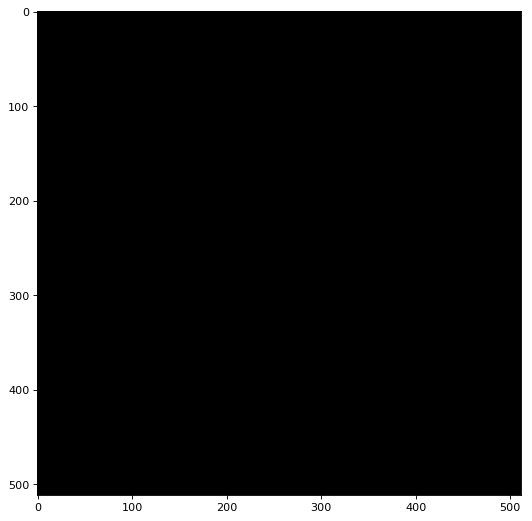

243


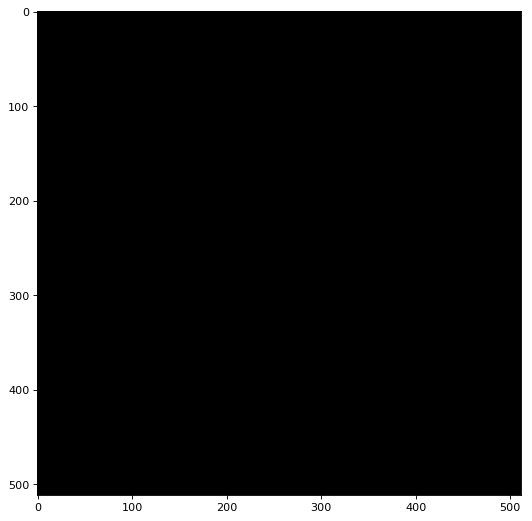

244


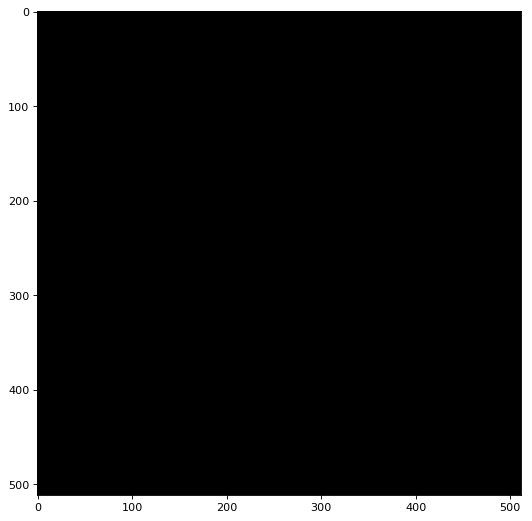

245


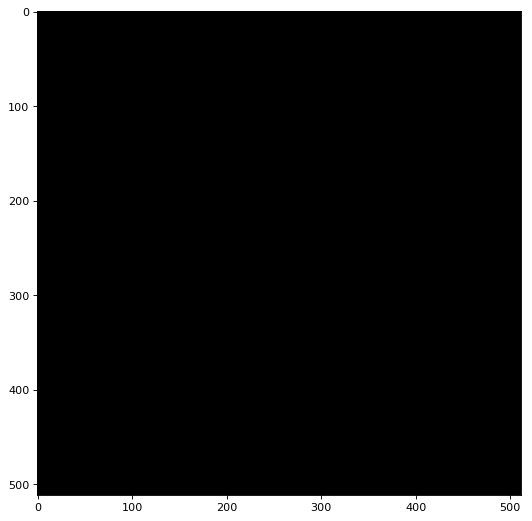

246


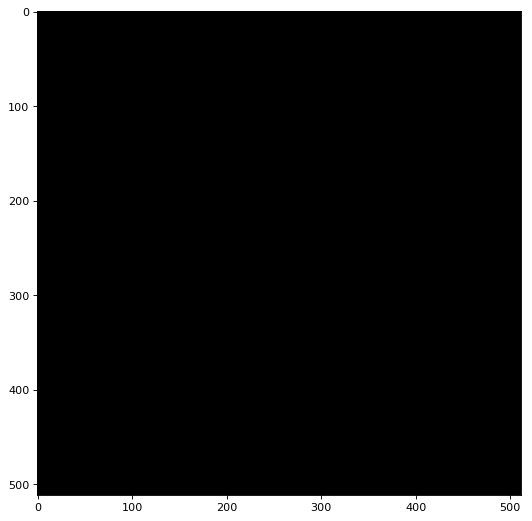

247


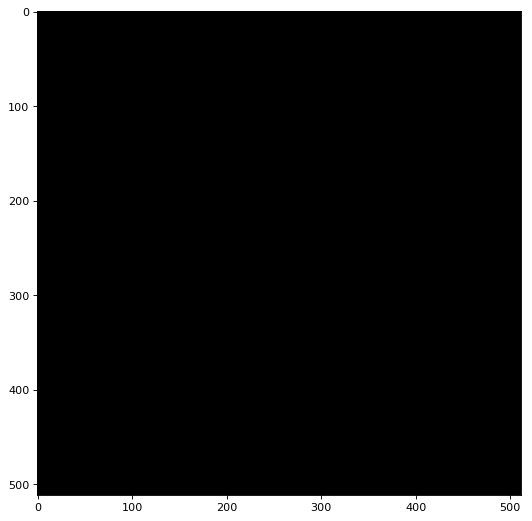

248


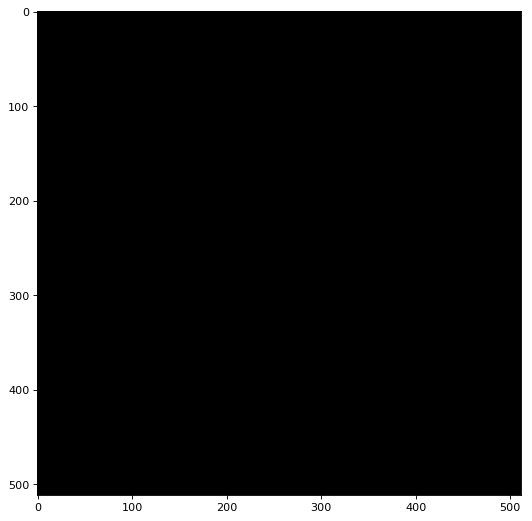

249


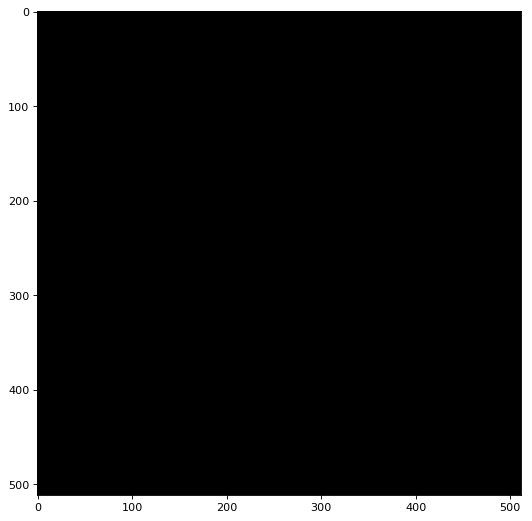

250


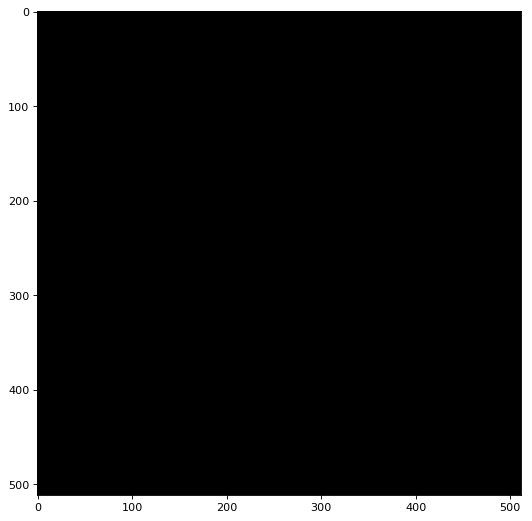

251


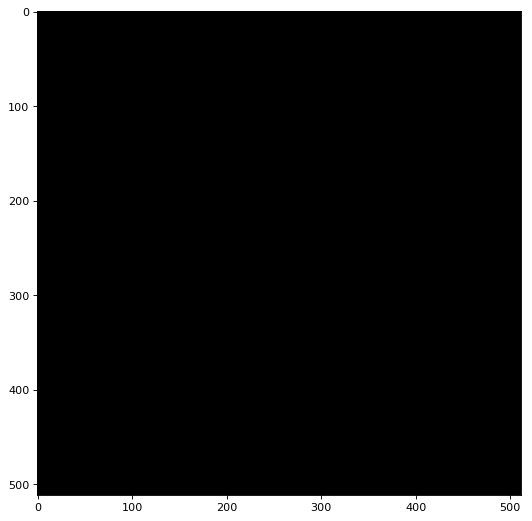

252


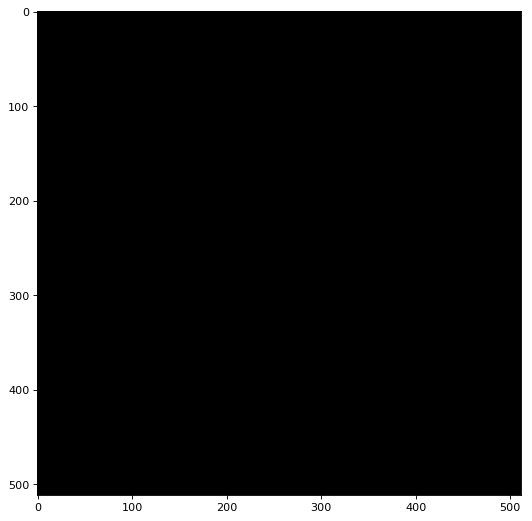

253


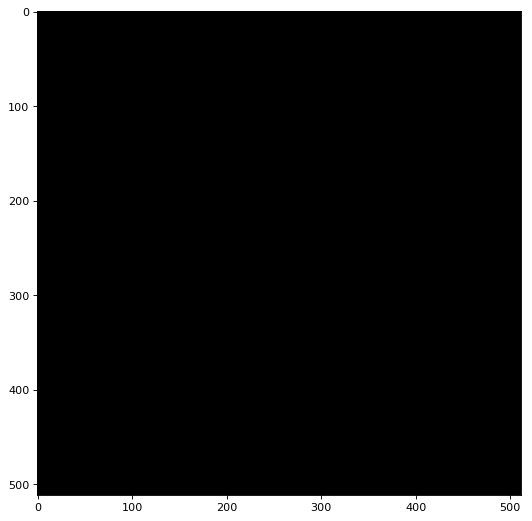

254


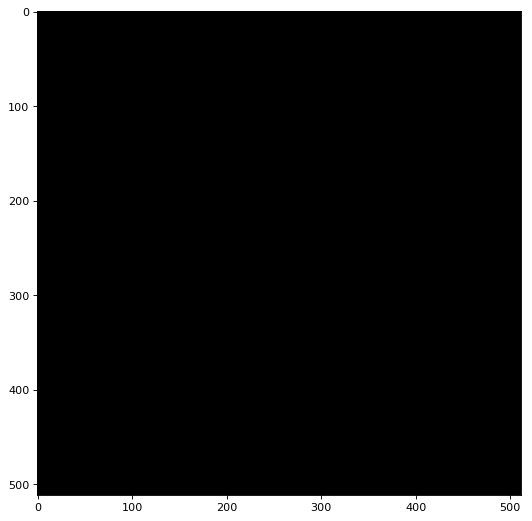

255


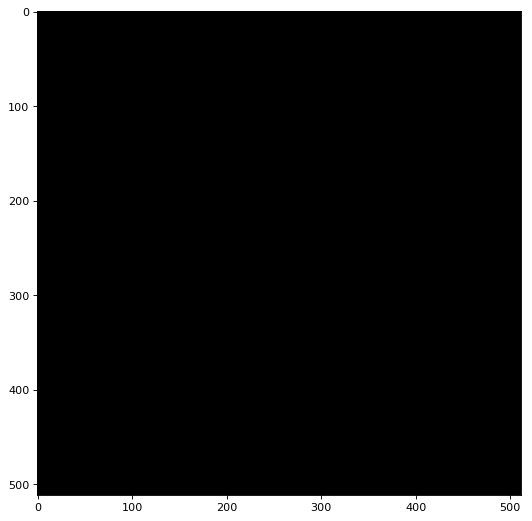


100%|██████████| 506/506 [01:02<00:00,  8.10it/s]

In [43]:
for i, row in tqdm(df.iterrows(), total=len(df)):
    if i != 100:
        continue
    print img_file
    lung = np.load(img_file)
    for j in range(256):
        print j
        l = lung[j]
        nz = np.count_nonzero(l)
        if nz == 0:
            continue
        if np.all(l) == THRESHOLD_LOW:
            continue
        show_slice (l, value_range=(-1,1))    
    #raw_input("hit enter to cont : ")

In [27]:
from glob import glob
file_list=glob(INPUT_FOLDER+"*.npy")

In [28]:
lung_slices = np.ndarray([1,1,num_slices,img_width,img_height],dtype=np.float32)
for i, img_file in enumerate(tqdm(file_list)):
#     if i != 0:
#         continue
    #print img_file
    slices = np.load(img_file)
#     slices = slices[slices.files[0]]
    #print slices.shape
    scan_folder = img_file.split('.')[0]
    scan_folder = scan_folder.split('/')[-1]
    fname = os.path.join(DATA_FOLDER, scan_folder)
    patient_slices = read_ct_scan_gzuidhof(fname)
    slices = slices.reshape(slices.shape[0], slices.shape[1], slices.shape[2])
    num_test = 0
    num_predictions = 0
    last_img = slices[0]
    for j in range(slices.shape[0]):
        if j not in imp_slices:
            continue
        if j >= len(patient_slices):
            continue
        img = slices[j]
#         img[img == THRESHOLD_LOW] = 0
#         nz = np.count_nonzero(img)
#         if nz == 0:
#             continue
        img = resize(img, [img_width, img_height])
        lung_slices[0, 0, num_test] = img
        num_test += 1
        last_img = img
        if num_test == num_slices:
            #lung_slices -= np.mean(lung_slices)
            #lung_slices /= np.std(lung_slices)
            my_nodules_mask = model.predict([lung_slices], verbose=0)[0]
            nz = np.count_nonzero(my_nodules_mask)
            if nz == 0:
                print 'predicted mask is 0...%d' %j
            num_test = 0
            output_fname = scan_folder + '_%d' % num_predictions
            output_fname += '.npy'
            #print output_fname
            num_predictions += 1
            np.save(OUTPUT_FOLDER+output_fname, my_nodules_mask)
    while num_test != 0 and num_test < num_slices:
        lung_slices[0, 0, num_test] = last_img
        num_test += 1
    if num_test == num_slices:
        #lung_slices -= np.mean(lung_slices)
        #lung_slices /= np.std(lung_slices)
        my_nodules_mask = model.predict([lung_slices], verbose=0)[0]
        nz = np.count_nonzero(my_nodules_mask)
        if nz == 0:
            print 'predicted mask is 0...%d' %j                                 
        num_test = 0
        output_fname = scan_folder + '_%d' % num_predictions
        output_fname += '.npy'
        num_predictions += 1
        np.save(OUTPUT_FOLDER+output_fname, my_nodules_mask)
    #print num_predictions
    if num_predictions == 0:
        continue
    predictions = np.ndarray([1,num_slices*num_predictions,img_width,img_height],dtype=np.float32)
    output_fname = scan_folder + '.npy'
    for k in range(num_predictions):
        fname = scan_folder + '_%d' % k
        fname += '.npy'
        pred = np.load(OUTPUT_FOLDER+fname)
        for l in range(num_slices):
            img = pred[0, l]
            predictions[0, (k*num_slices)+l] = img
    np.save(OUTPUT_FOLDER+output_fname, predictions)
            

100%|██████████| 507/507 [1:33:31<00:00, 10.56s/it]


In [29]:
mask = np.load(OUTPUT_FOLDER+'1ec3740d37c058058bf70949ba9e5766.npy')
print mask.shape

(1, 272, 128, 128)


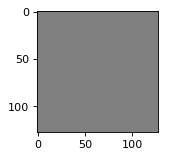

In [30]:
show_slice (mask[0,40], value_range=(-1,1)) 